# Multi Layered Perceptrons

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

from keras.optimizers import SGD
from keras.utils import to_categorical
from matplotlib import pyplot

In [2]:
import pandas as pd
import numpy as np
import matplotlib as plt
from collections import Counter
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn import metrics
from sklearn.metrics import classification_report
from statistics import mean
import math
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import recall_score, accuracy_score

In [3]:
hp_oHe = pd.read_csv('HP_OHE_3class.csv')
hp_oHe.drop(hp_oHe.tail(17).index,inplace=True) 
hp_oHe = hp_oHe.drop('Unnamed: 0',axis=1)

hp_ME = pd.read_csv("harryPotterClean.csv")
hp_ME.drop(hp_ME.tail(17).index,inplace=True) 
hp_ME = hp_ME.drop('Unnamed: 0',axis=1)

hp_OE = pd.read_csv("harryPotterCleanOE.csv")
hp_OE.drop(hp_OE.tail(17).index,inplace=True) 
hp_OE = hp_OE.drop('Unnamed: 0',axis=1)

In [4]:
def getXandY(df):
    df.drop(df.tail(20).index,inplace=True) 
    x = df.drop(['HP_Forbidden_clean'],axis=1)
    y = df.HP_Forbidden_clean
    return(x,y)

def trainTest(x,y):
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, shuffle=True)
    return(X_train, X_test, y_train, y_test)

#Function to perform oversampling
def overSampling(X_train, y_train, y_test, method):
    X_train_os, y_train_os= method.fit_resample(X_train, y_train)
    # Check the number of records after over sampling
    #print(sorted(Counter(y_train_os).items())) 
    return(X_train_os, y_train_os)

smote = SMOTE(random_state=42)


def testModel(df,var_order,n_vars,n_loops,method):
    highest = 0
    for j in tqdm(range(1,n_vars)):
        #split our dataframe into X and Y
        x,y=getXandY(df)
        #create the lists to store metrics
        acc = []
        rec = []
        preci = []
        f1 = []
        for i in range(n_loops):
            #split the dataFrame into test and train
            X_train, X_test, y_train, y_test = trainTest(x,y)
            #Oversample the train dataset with SMOTE
            X_train_os, y_train_os=overSampling(X_train, y_train, y_test, smote)
            #define the variables order 
            X_train_os_r = X_train_os[var_order]
            X_test_r = X_test[var_order]
            df1= X_train_os_r.iloc[:, 0:j] #use only part of the variables
            
            #create and train decision trees
            rnd_clf = RandomForestClassifier(n_jobs=-1)
            rnd_clf.fit(df1, y_train_os)
        
            y_pred=rnd_clf.predict(X_test_r.iloc[:, 0:j])
            ac=metrics.accuracy_score(y_test, y_pred)
            acc.append(ac)
            p=metrics.precision_score(y_test, y_pred,average='macro')
            preci.append(p)
            r=metrics.recall_score(y_test, y_pred,average='macro')
            rec.append(r)
            f=metrics.f1_score(y_test, y_pred, average='macro')
            f1.append(f)
        print(df1.columns)
        print("For {} features: \n Accuracy: {} \n Precision: {} \n Recall: {} \n F1 score: {}".format(
        j,mean(acc),mean(preci),mean(rec),mean(f1)))
        
        if mean(acc)>highest:
            highest = mean(acc)
            best = "best accuracy = {}, with {} features, with {}".format(mean(acc),j,method)
        print(best)
        #print(classification_report(y_test, y_pred))
    print(best)
        
def analizeDF(df,order,n_vars,n_loops):
    for i in range(len(order)):
        print('------------------------- Analyzing method {} -------------------------'.format(method[i]))
        print('The variable order is: \n {}'.format(order[i]))
        testModel(df,order[i],n_vars,n_loops,method[i])
        print('\n \n')

In [5]:
# change the y class to [0-2]
a = hp_oHe.HP_Forbidden_clean.replace([1,2,3], [0,1,2])

#Create the final dataframe
df=pd.DataFrame(a)
hp2=hp_oHe.drop('HP_Forbidden_clean',axis=1)
hp_oHe=pd.concat([hp2, df], axis=1)

In [6]:
#split our dataframe into X and Y
x,y=getXandY(hp_oHe)
#split the dataFrame into test and train
X_train, X_test, y_train, y_test = trainTest(x,y)
#Oversample the train dataset with SMOTE
X_train_os, y_train_os=overSampling(X_train, y_train, y_test, smote)

In [7]:
# determine the number of input features
n_features = X_train_os.shape[1]

In [1]:
class MLP:
    
    def testGD(self,X_train_os, y_train_os,X_test, y_test, epoch, bs):
        # determine the number of input features
        n_features = X_train_os.shape[1]
        #define the NN architecture
        model = Sequential()
        model.add(Dense(n_features, activation='relu', kernel_initializer='he_normal', input_shape=(n_features,)))
        model.add(Dense(20, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(20, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(15, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(3, activation='softmax'))
        #compile the model
        #opt = SGD(lr=0.1, momentum=0.9)
        model.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        # fit the model
        history = model.fit(X_train_os, y_train_os, epochs=epoch, batch_size=bs, verbose=0,
                            validation_data=(X_test, y_test))
        # evaluate the model
        _, train_acc = model.evaluate(X_test, y_test, verbose=2)
        _, test_acc = model.evaluate(X_test, y_test, verbose=2)
        loss, acc = model.evaluate(X_test, y_test, verbose=2)
        print('with batch size = {}'.format(bs))
        print('Test Accuracy: %.3f ' % acc)
        # plot training history
        pyplot.plot(history.history['accuracy'], label='train')
        pyplot.plot(history.history['val_accuracy'], label='test')
        pyplot.title("MLP with batch size: {}".format(bs))
        pyplot.legend()
        pyplot.show()
    
    def testLrGdMom(self,X_train_os, y_train_os,X_test, y_test, epoch, bs,LR,moment):
        # determine the number of input features
        n_features = X_train_os.shape[1]
        #define the NN architecture
        model = Sequential()
        model.add(Dense(n_features, activation='relu', kernel_initializer='he_normal', input_shape=(n_features,)))
        model.add(Dense(20, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(20, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(15, activation='relu', kernel_initializer='he_normal'))
        model.add(Dense(3, activation='softmax'))
        #compile the model
        opt = SGD(lr=LR, momentum=moment)
        model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        # fit the model
        history = model.fit(X_train_os, y_train_os, epochs=epoch, batch_size=bs, verbose=0,
                            validation_data=(X_test, y_test))
        # evaluate the model
        _, train_acc = model.evaluate(X_test, y_test, verbose=2)
        _, test_acc = model.evaluate(X_test, y_test, verbose=2)
        loss, acc = model.evaluate(X_test, y_test, verbose=2)
        print('with batch size = {}, LR= {} and momentum={}'.format(bs,LR,moment))
        print('Test Accuracy: %.3f ' % acc)
        # plot training history
        pyplot.plot(history.history['accuracy'], label='train')
        pyplot.plot(history.history['val_accuracy'], label='test')
        pyplot.title("MLP with batch size: {}, LR: {} and momentum:{}".format(bs,LR,moment))
        pyplot.legend()
        pyplot.show()

Epoch 1/100
16839/16839 - 16s - loss: 0.9929 - accuracy: 0.4985 - val_loss: 0.8597 - val_accuracy: 0.6048 - 16s/epoch - 927us/step
Epoch 2/100
16839/16839 - 15s - loss: 0.8792 - accuracy: 0.5825 - val_loss: 0.8457 - val_accuracy: 0.6042 - 15s/epoch - 897us/step
Epoch 3/100
16839/16839 - 15s - loss: 0.8211 - accuracy: 0.6214 - val_loss: 0.7588 - val_accuracy: 0.6576 - 15s/epoch - 904us/step
Epoch 4/100
16839/16839 - 16s - loss: 0.7904 - accuracy: 0.6347 - val_loss: 0.8283 - val_accuracy: 0.6266 - 16s/epoch - 947us/step
Epoch 5/100
16839/16839 - 18s - loss: 0.7652 - accuracy: 0.6507 - val_loss: 0.8734 - val_accuracy: 0.5910 - 18s/epoch - 1ms/step
Epoch 6/100
16839/16839 - 15s - loss: 0.7420 - accuracy: 0.6630 - val_loss: 0.7744 - val_accuracy: 0.6281 - 15s/epoch - 885us/step
Epoch 7/100
16839/16839 - 15s - loss: 0.7221 - accuracy: 0.6715 - val_loss: 0.7947 - val_accuracy: 0.6385 - 15s/epoch - 897us/step
Epoch 8/100
16839/16839 - 15s - loss: 0.6999 - accuracy: 0.6841 - val_loss: 0.7171 - 

Epoch 64/100
16839/16839 - 17s - loss: 0.4892 - accuracy: 0.7841 - val_loss: 0.5775 - val_accuracy: 0.7504 - 17s/epoch - 1ms/step
Epoch 65/100
16839/16839 - 17s - loss: 0.4888 - accuracy: 0.7897 - val_loss: 0.5821 - val_accuracy: 0.7576 - 17s/epoch - 1ms/step
Epoch 66/100
16839/16839 - 17s - loss: 0.4857 - accuracy: 0.7905 - val_loss: 0.6126 - val_accuracy: 0.7321 - 17s/epoch - 1ms/step
Epoch 67/100
16839/16839 - 18s - loss: 0.4882 - accuracy: 0.7885 - val_loss: 0.5631 - val_accuracy: 0.7701 - 18s/epoch - 1ms/step
Epoch 68/100
16839/16839 - 19s - loss: 0.4830 - accuracy: 0.7876 - val_loss: 0.5892 - val_accuracy: 0.7616 - 19s/epoch - 1ms/step
Epoch 69/100
16839/16839 - 17s - loss: 0.4840 - accuracy: 0.7889 - val_loss: 0.6611 - val_accuracy: 0.7296 - 17s/epoch - 1ms/step
Epoch 70/100
16839/16839 - 19s - loss: 0.4905 - accuracy: 0.7872 - val_loss: 0.6139 - val_accuracy: 0.7296 - 19s/epoch - 1ms/step
Epoch 71/100
16839/16839 - 20s - loss: 0.4824 - accuracy: 0.7949 - val_loss: 0.6025 - val_

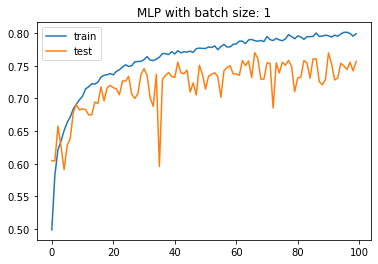

In [30]:
 MLP().testGD(X_train_os, y_train_os,X_test, y_test, 100, 1)

148/148 - 0s - loss: 0.5792 - accuracy: 0.7686 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 0.5792 - accuracy: 0.7686 - 127ms/epoch - 856us/step
148/148 - 0s - loss: 0.5792 - accuracy: 0.7686 - 131ms/epoch - 887us/step
with batch size = 32
Test Accuracy: 0.769 


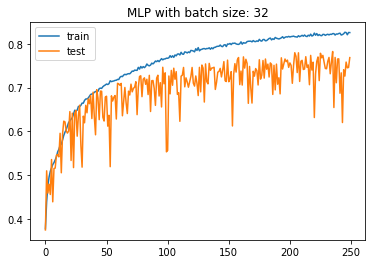

148/148 - 0s - loss: 0.8609 - accuracy: 0.6315 - 129ms/epoch - 875us/step
148/148 - 0s - loss: 0.8609 - accuracy: 0.6315 - 124ms/epoch - 837us/step
148/148 - 0s - loss: 0.8609 - accuracy: 0.6315 - 112ms/epoch - 756us/step
with batch size = 64
Test Accuracy: 0.631 


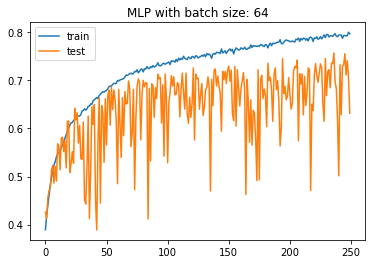

148/148 - 0s - loss: 0.6807 - accuracy: 0.7038 - 119ms/epoch - 807us/step
148/148 - 0s - loss: 0.6807 - accuracy: 0.7038 - 139ms/epoch - 939us/step
148/148 - 0s - loss: 0.6807 - accuracy: 0.7038 - 142ms/epoch - 961us/step
with batch size = 128
Test Accuracy: 0.704 


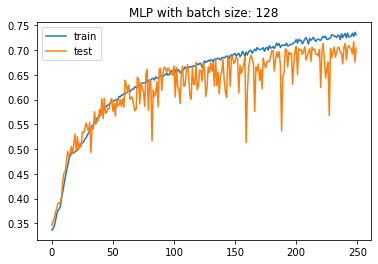

148/148 - 0s - loss: 0.7767 - accuracy: 0.6444 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 0.7767 - accuracy: 0.6444 - 129ms/epoch - 871us/step
148/148 - 0s - loss: 0.7767 - accuracy: 0.6444 - 131ms/epoch - 886us/step
with batch size = 256
Test Accuracy: 0.644 


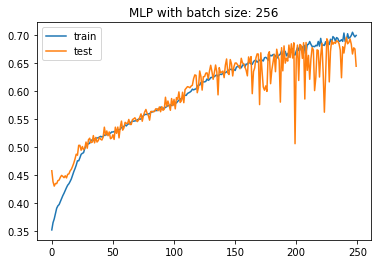

148/148 - 0s - loss: 0.8777 - accuracy: 0.5940 - 110ms/epoch - 746us/step
148/148 - 0s - loss: 0.8777 - accuracy: 0.5940 - 159ms/epoch - 1ms/step
148/148 - 0s - loss: 0.8777 - accuracy: 0.5940 - 124ms/epoch - 835us/step
with batch size = 562
Test Accuracy: 0.594 


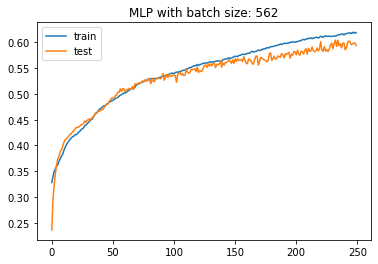

148/148 - 0s - loss: 0.9517 - accuracy: 0.5262 - 138ms/epoch - 935us/step
148/148 - 0s - loss: 0.9517 - accuracy: 0.5262 - 118ms/epoch - 795us/step
148/148 - 0s - loss: 0.9517 - accuracy: 0.5262 - 115ms/epoch - 779us/step
with batch size = 1024
Test Accuracy: 0.526 


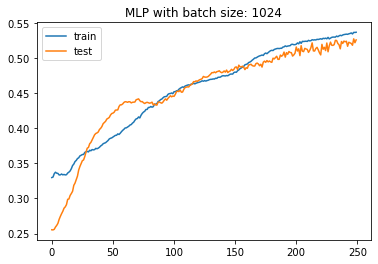

148/148 - 0s - loss: 1.0947 - accuracy: 0.3507 - 125ms/epoch - 846us/step
148/148 - 0s - loss: 1.0947 - accuracy: 0.3507 - 131ms/epoch - 884us/step
148/148 - 0s - loss: 1.0947 - accuracy: 0.3507 - 128ms/epoch - 862us/step
with batch size = 16839
Test Accuracy: 0.351 


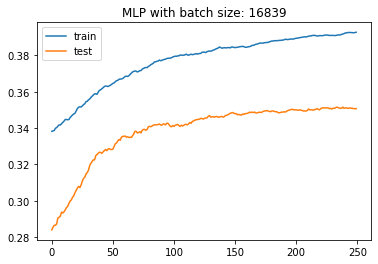

In [34]:
diff_batchS=[32,64,128,256,562,1024,16839]

for i in range(len(diff_batchS)):
  MLP().testGD(X_train_os, y_train_os,X_test, y_test, 250, diff_batchS[i])

148/148 - 1s - loss: nan - accuracy: 0.5249 - 1s/epoch - 7ms/step
148/148 - 0s - loss: nan - accuracy: 0.5249 - 125ms/epoch - 844us/step
148/148 - 0s - loss: nan - accuracy: 0.5249 - 156ms/epoch - 1ms/step
with batch size = 1, LR= 1 and momentum=0.1
Test Accuracy: 0.525 


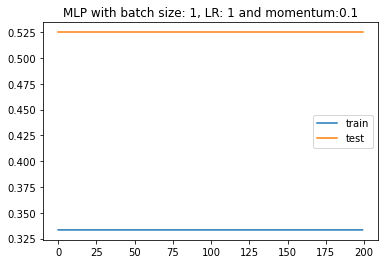

148/148 - 0s - loss: 1.0456 - accuracy: 0.5249 - 123ms/epoch - 829us/step
148/148 - 0s - loss: 1.0456 - accuracy: 0.5249 - 129ms/epoch - 873us/step
148/148 - 0s - loss: 1.0456 - accuracy: 0.5249 - 128ms/epoch - 867us/step
with batch size = 32, LR= 1 and momentum=0.1
Test Accuracy: 0.525 


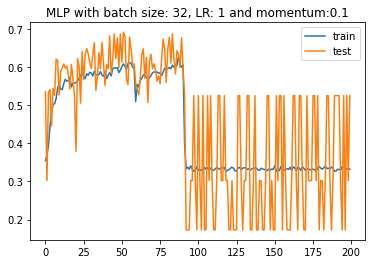

148/148 - 0s - loss: 1.0934 - accuracy: 0.3022 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0934 - accuracy: 0.3022 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0934 - accuracy: 0.3022 - 125ms/epoch - 844us/step
with batch size = 64, LR= 1 and momentum=0.1
Test Accuracy: 0.302 


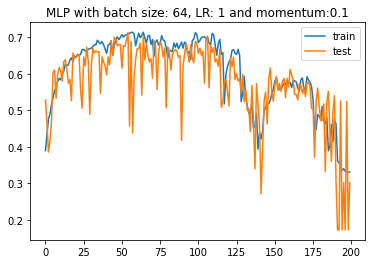

148/148 - 0s - loss: 0.6217 - accuracy: 0.7451 - 141ms/epoch - 951us/step
148/148 - 0s - loss: 0.6217 - accuracy: 0.7451 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6217 - accuracy: 0.7451 - 109ms/epoch - 739us/step
with batch size = 128, LR= 1 and momentum=0.1
Test Accuracy: 0.745 


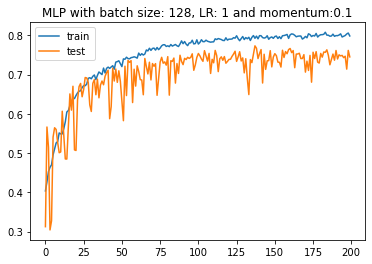

148/148 - 0s - loss: 0.5811 - accuracy: 0.7569 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5811 - accuracy: 0.7569 - 122ms/epoch - 828us/step
148/148 - 0s - loss: 0.5811 - accuracy: 0.7569 - 118ms/epoch - 796us/step
with batch size = 256, LR= 1 and momentum=0.1
Test Accuracy: 0.757 


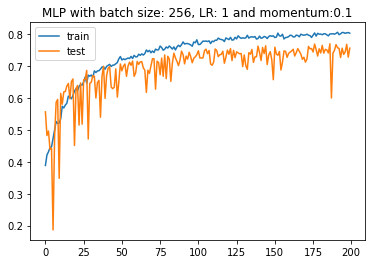

148/148 - 0s - loss: 0.6251 - accuracy: 0.7313 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6251 - accuracy: 0.7313 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 0.6251 - accuracy: 0.7313 - 125ms/epoch - 844us/step
with batch size = 562, LR= 1 and momentum=0.1
Test Accuracy: 0.731 


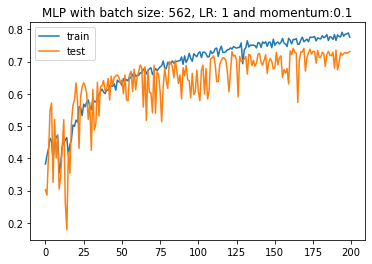

148/148 - 0s - loss: 0.7724 - accuracy: 0.6482 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.7724 - accuracy: 0.6482 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.7724 - accuracy: 0.6482 - 109ms/epoch - 739us/step
with batch size = 1024, LR= 1 and momentum=0.1
Test Accuracy: 0.648 


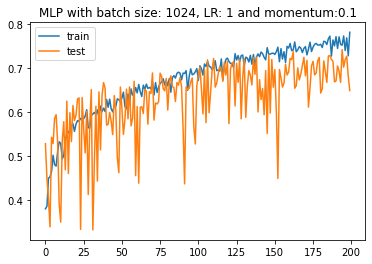

148/148 - 0s - loss: 0.9848 - accuracy: 0.5652 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9848 - accuracy: 0.5652 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.9848 - accuracy: 0.5652 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 1 and momentum=0.1
Test Accuracy: 0.565 


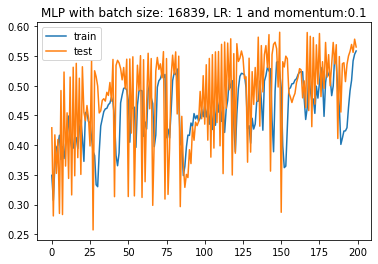

148/148 - 0s - loss: 1.0614 - accuracy: 0.5249 - 276ms/epoch - 2ms/step
148/148 - 0s - loss: 1.0614 - accuracy: 0.5249 - 129ms/epoch - 874us/step
148/148 - 0s - loss: 1.0614 - accuracy: 0.5249 - 123ms/epoch - 830us/step
with batch size = 1, LR= 0.1 and momentum=0.1
Test Accuracy: 0.525 


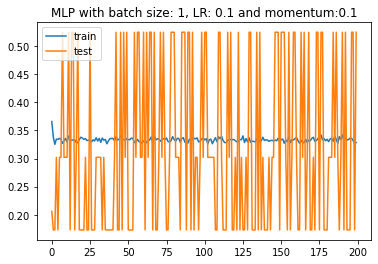

148/148 - 0s - loss: 0.5505 - accuracy: 0.7798 - 133ms/epoch - 901us/step
148/148 - 0s - loss: 0.5505 - accuracy: 0.7798 - 130ms/epoch - 880us/step
148/148 - 0s - loss: 0.5505 - accuracy: 0.7798 - 123ms/epoch - 832us/step
with batch size = 32, LR= 0.1 and momentum=0.1
Test Accuracy: 0.780 


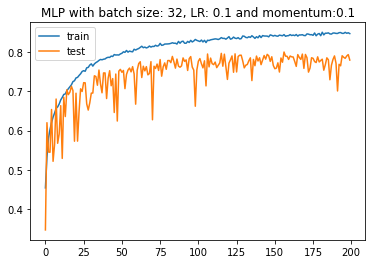

148/148 - 0s - loss: 0.5508 - accuracy: 0.7862 - 126ms/epoch - 849us/step
148/148 - 0s - loss: 0.5508 - accuracy: 0.7862 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 0.5508 - accuracy: 0.7862 - 118ms/epoch - 797us/step
with batch size = 64, LR= 0.1 and momentum=0.1
Test Accuracy: 0.786 


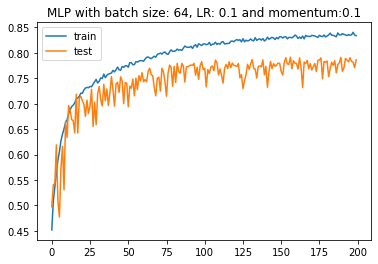

148/148 - 0s - loss: 0.5386 - accuracy: 0.7819 - 128ms/epoch - 865us/step
148/148 - 0s - loss: 0.5386 - accuracy: 0.7819 - 125ms/epoch - 846us/step
148/148 - 0s - loss: 0.5386 - accuracy: 0.7819 - 120ms/epoch - 810us/step
with batch size = 128, LR= 0.1 and momentum=0.1
Test Accuracy: 0.782 


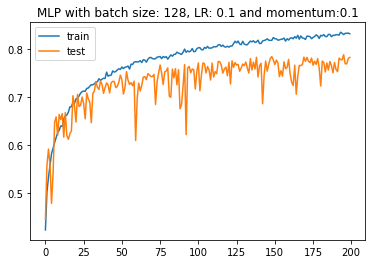

148/148 - 0s - loss: 0.5792 - accuracy: 0.7828 - 123ms/epoch - 832us/step
148/148 - 0s - loss: 0.5792 - accuracy: 0.7828 - 117ms/epoch - 792us/step
148/148 - 0s - loss: 0.5792 - accuracy: 0.7828 - 117ms/epoch - 791us/step
with batch size = 256, LR= 0.1 and momentum=0.1
Test Accuracy: 0.783 


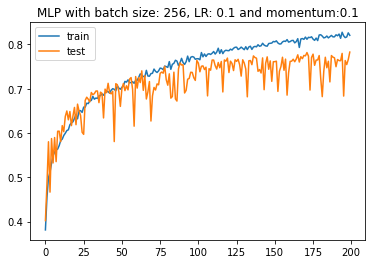

148/148 - 0s - loss: 0.6096 - accuracy: 0.7480 - 129ms/epoch - 869us/step
148/148 - 0s - loss: 0.6096 - accuracy: 0.7480 - 131ms/epoch - 883us/step
148/148 - 0s - loss: 0.6096 - accuracy: 0.7480 - 121ms/epoch - 815us/step
with batch size = 562, LR= 0.1 and momentum=0.1
Test Accuracy: 0.748 


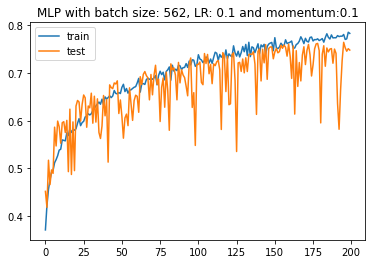

148/148 - 0s - loss: 0.6933 - accuracy: 0.6974 - 139ms/epoch - 937us/step
148/148 - 0s - loss: 0.6933 - accuracy: 0.6974 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 0.6933 - accuracy: 0.6974 - 119ms/epoch - 807us/step
with batch size = 1024, LR= 0.1 and momentum=0.1
Test Accuracy: 0.697 


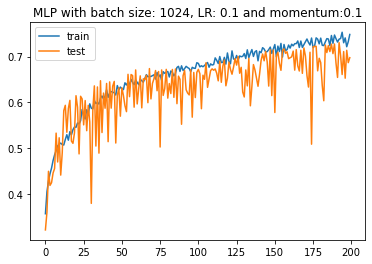

148/148 - 0s - loss: 1.0233 - accuracy: 0.4628 - 110ms/epoch - 746us/step
148/148 - 0s - loss: 1.0233 - accuracy: 0.4628 - 123ms/epoch - 832us/step
148/148 - 0s - loss: 1.0233 - accuracy: 0.4628 - 130ms/epoch - 877us/step
with batch size = 16839, LR= 0.1 and momentum=0.1
Test Accuracy: 0.463 


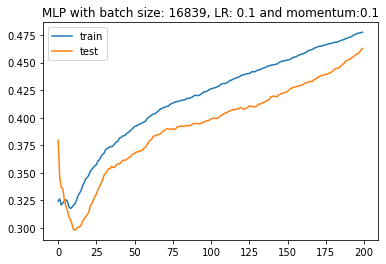

148/148 - 0s - loss: 0.5833 - accuracy: 0.7677 - 246ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5833 - accuracy: 0.7677 - 131ms/epoch - 887us/step
148/148 - 0s - loss: 0.5833 - accuracy: 0.7677 - 125ms/epoch - 848us/step
with batch size = 1, LR= 0.01 and momentum=0.1
Test Accuracy: 0.768 


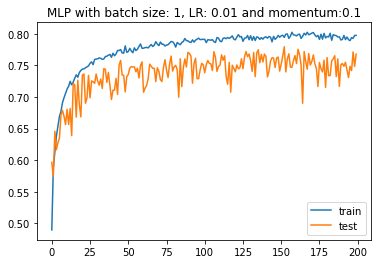

148/148 - 0s - loss: 0.5481 - accuracy: 0.7760 - 127ms/epoch - 856us/step
148/148 - 0s - loss: 0.5481 - accuracy: 0.7760 - 135ms/epoch - 913us/step
148/148 - 0s - loss: 0.5481 - accuracy: 0.7760 - 128ms/epoch - 864us/step
with batch size = 32, LR= 0.01 and momentum=0.1
Test Accuracy: 0.776 


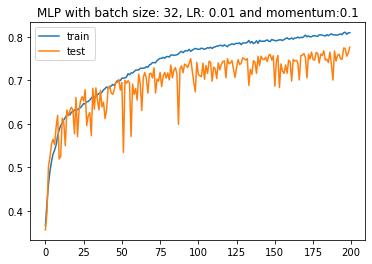

148/148 - 0s - loss: 0.6646 - accuracy: 0.7245 - 126ms/epoch - 854us/step
148/148 - 0s - loss: 0.6646 - accuracy: 0.7245 - 141ms/epoch - 952us/step
148/148 - 0s - loss: 0.6646 - accuracy: 0.7245 - 137ms/epoch - 928us/step
with batch size = 64, LR= 0.01 and momentum=0.1
Test Accuracy: 0.725 


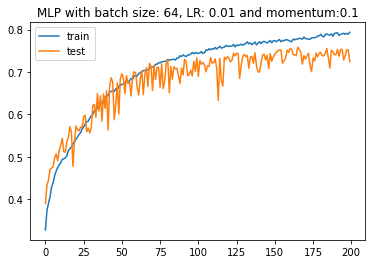

148/148 - 0s - loss: 0.6397 - accuracy: 0.7190 - 141ms/epoch - 955us/step
148/148 - 0s - loss: 0.6397 - accuracy: 0.7190 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.6397 - accuracy: 0.7190 - 127ms/epoch - 857us/step
with batch size = 128, LR= 0.01 and momentum=0.1
Test Accuracy: 0.719 


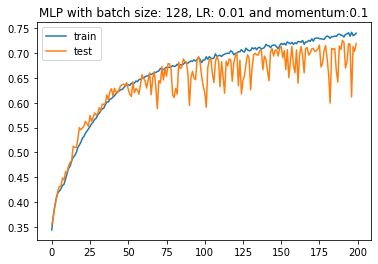

148/148 - 0s - loss: 0.7503 - accuracy: 0.6684 - 126ms/epoch - 851us/step
148/148 - 0s - loss: 0.7503 - accuracy: 0.6684 - 133ms/epoch - 901us/step
148/148 - 0s - loss: 0.7503 - accuracy: 0.6684 - 142ms/epoch - 957us/step
with batch size = 256, LR= 0.01 and momentum=0.1
Test Accuracy: 0.668 


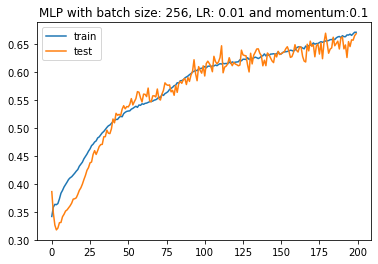

148/148 - 0s - loss: 0.8734 - accuracy: 0.5959 - 141ms/epoch - 955us/step
148/148 - 0s - loss: 0.8734 - accuracy: 0.5959 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.8734 - accuracy: 0.5959 - 136ms/epoch - 920us/step
with batch size = 562, LR= 0.01 and momentum=0.1
Test Accuracy: 0.596 


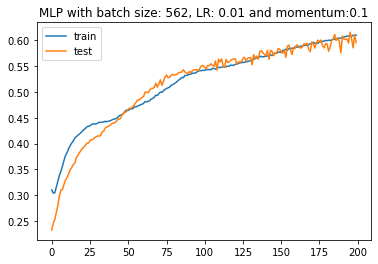

148/148 - 0s - loss: 0.9219 - accuracy: 0.5743 - 131ms/epoch - 887us/step
148/148 - 0s - loss: 0.9219 - accuracy: 0.5743 - 127ms/epoch - 860us/step
148/148 - 0s - loss: 0.9219 - accuracy: 0.5743 - 121ms/epoch - 816us/step
with batch size = 1024, LR= 0.01 and momentum=0.1
Test Accuracy: 0.574 


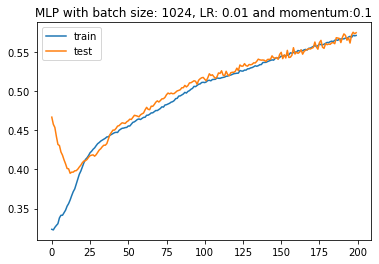

148/148 - 0s - loss: 1.1013 - accuracy: 0.3480 - 124ms/epoch - 841us/step
148/148 - 0s - loss: 1.1013 - accuracy: 0.3480 - 131ms/epoch - 885us/step
148/148 - 0s - loss: 1.1013 - accuracy: 0.3480 - 130ms/epoch - 881us/step
with batch size = 16839, LR= 0.01 and momentum=0.1
Test Accuracy: 0.348 


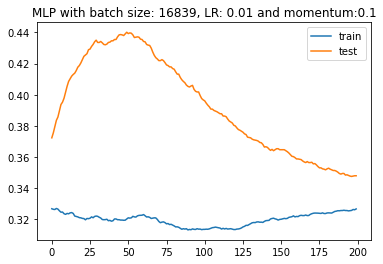

148/148 - 0s - loss: 0.5576 - accuracy: 0.7843 - 242ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5576 - accuracy: 0.7843 - 123ms/epoch - 834us/step
148/148 - 0s - loss: 0.5576 - accuracy: 0.7843 - 138ms/epoch - 935us/step
with batch size = 1, LR= 0.001 and momentum=0.1
Test Accuracy: 0.784 


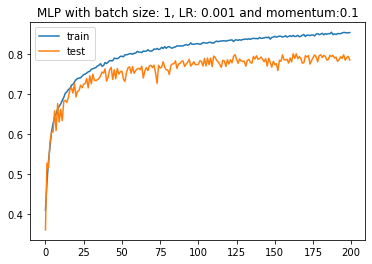

148/148 - 0s - loss: 0.7509 - accuracy: 0.6520 - 147ms/epoch - 991us/step
148/148 - 0s - loss: 0.7509 - accuracy: 0.6520 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.7509 - accuracy: 0.6520 - 131ms/epoch - 886us/step
with batch size = 32, LR= 0.001 and momentum=0.1
Test Accuracy: 0.652 


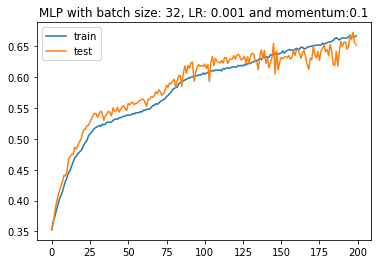

148/148 - 0s - loss: 0.9123 - accuracy: 0.5686 - 131ms/epoch - 885us/step
148/148 - 0s - loss: 0.9123 - accuracy: 0.5686 - 130ms/epoch - 878us/step
148/148 - 0s - loss: 0.9123 - accuracy: 0.5686 - 141ms/epoch - 952us/step
with batch size = 64, LR= 0.001 and momentum=0.1
Test Accuracy: 0.569 


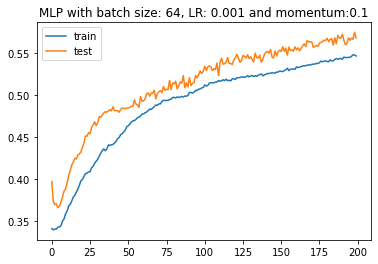

148/148 - 0s - loss: 0.9439 - accuracy: 0.5758 - 127ms/epoch - 858us/step
148/148 - 0s - loss: 0.9439 - accuracy: 0.5758 - 127ms/epoch - 855us/step
148/148 - 0s - loss: 0.9439 - accuracy: 0.5758 - 140ms/epoch - 949us/step
with batch size = 128, LR= 0.001 and momentum=0.1
Test Accuracy: 0.576 


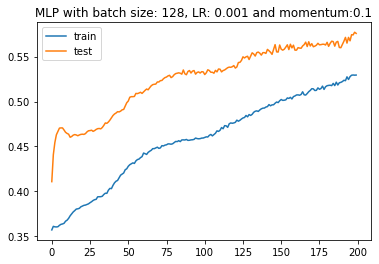

148/148 - 0s - loss: 1.0345 - accuracy: 0.4927 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 1.0345 - accuracy: 0.4927 - 127ms/epoch - 855us/step
148/148 - 0s - loss: 1.0345 - accuracy: 0.4927 - 122ms/epoch - 821us/step
with batch size = 256, LR= 0.001 and momentum=0.1
Test Accuracy: 0.493 


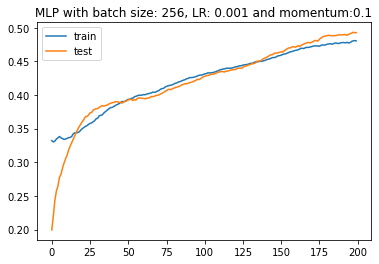

148/148 - 0s - loss: 1.0687 - accuracy: 0.4344 - 157ms/epoch - 1ms/step
148/148 - 0s - loss: 1.0687 - accuracy: 0.4344 - 141ms/epoch - 952us/step
148/148 - 0s - loss: 1.0687 - accuracy: 0.4344 - 129ms/epoch - 874us/step
with batch size = 562, LR= 0.001 and momentum=0.1
Test Accuracy: 0.434 


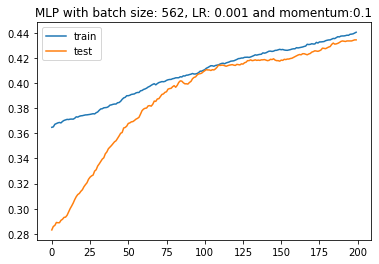

148/148 - 0s - loss: 1.0892 - accuracy: 0.3660 - 123ms/epoch - 828us/step
148/148 - 0s - loss: 1.0892 - accuracy: 0.3660 - 120ms/epoch - 812us/step
148/148 - 0s - loss: 1.0892 - accuracy: 0.3660 - 122ms/epoch - 825us/step
with batch size = 1024, LR= 0.001 and momentum=0.1
Test Accuracy: 0.366 


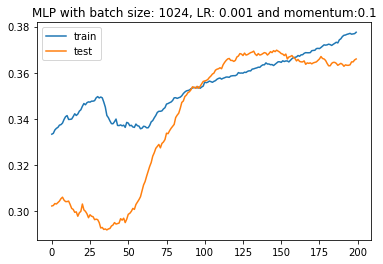

148/148 - 0s - loss: 1.0845 - accuracy: 0.4586 - 124ms/epoch - 839us/step
148/148 - 0s - loss: 1.0845 - accuracy: 0.4586 - 121ms/epoch - 820us/step
148/148 - 0s - loss: 1.0845 - accuracy: 0.4586 - 115ms/epoch - 775us/step
with batch size = 16839, LR= 0.001 and momentum=0.1
Test Accuracy: 0.459 


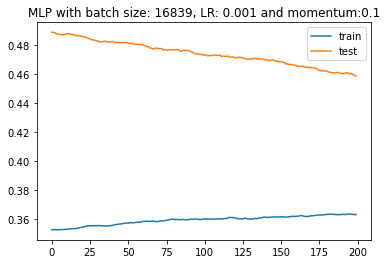

148/148 - 0s - loss: 0.6357 - accuracy: 0.7220 - 250ms/epoch - 2ms/step
148/148 - 0s - loss: 0.6357 - accuracy: 0.7220 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.6357 - accuracy: 0.7220 - 125ms/epoch - 844us/step
with batch size = 1, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.722 


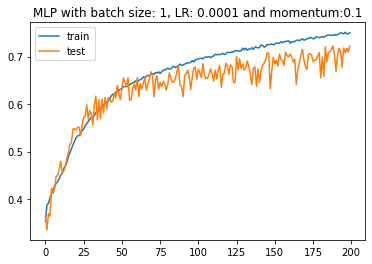

148/148 - 0s - loss: 1.0590 - accuracy: 0.4446 - 126ms/epoch - 851us/step
148/148 - 0s - loss: 1.0590 - accuracy: 0.4446 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0590 - accuracy: 0.4446 - 141ms/epoch - 950us/step
with batch size = 32, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.445 


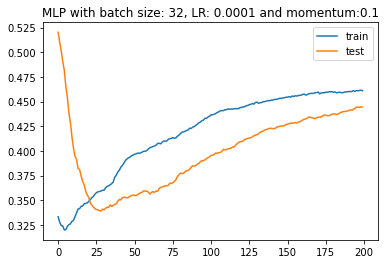

148/148 - 0s - loss: 1.0899 - accuracy: 0.3910 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 1.0899 - accuracy: 0.3910 - 120ms/epoch - 809us/step
148/148 - 0s - loss: 1.0899 - accuracy: 0.3910 - 127ms/epoch - 858us/step
with batch size = 64, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.391 


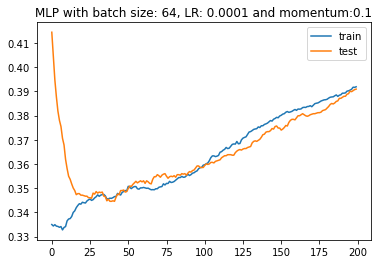

148/148 - 0s - loss: 1.0855 - accuracy: 0.3999 - 141ms/epoch - 951us/step
148/148 - 0s - loss: 1.0855 - accuracy: 0.3999 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0855 - accuracy: 0.3999 - 156ms/epoch - 1ms/step
with batch size = 128, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.400 


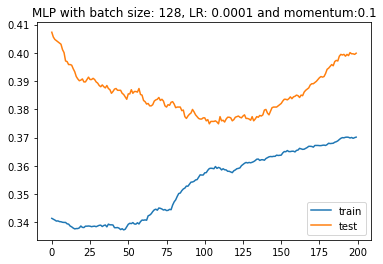

148/148 - 0s - loss: 1.1022 - accuracy: 0.3338 - 141ms/epoch - 951us/step
148/148 - 0s - loss: 1.1022 - accuracy: 0.3338 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 1.1022 - accuracy: 0.3338 - 125ms/epoch - 844us/step
with batch size = 256, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.334 


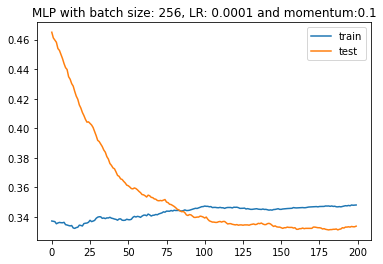

148/148 - 0s - loss: 1.0721 - accuracy: 0.4376 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0721 - accuracy: 0.4376 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0721 - accuracy: 0.4376 - 125ms/epoch - 844us/step
with batch size = 562, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.438 


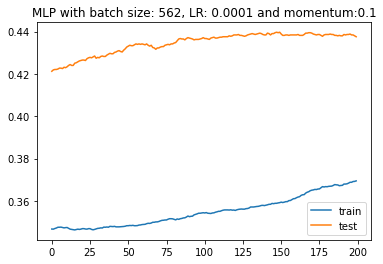

148/148 - 0s - loss: 1.0984 - accuracy: 0.3687 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0984 - accuracy: 0.3687 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0984 - accuracy: 0.3687 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.369 


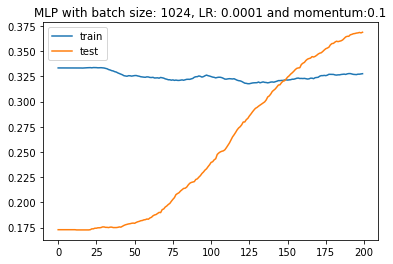

148/148 - 0s - loss: 1.0558 - accuracy: 0.4367 - 142ms/epoch - 957us/step
148/148 - 0s - loss: 1.0558 - accuracy: 0.4367 - 154ms/epoch - 1ms/step
148/148 - 0s - loss: 1.0558 - accuracy: 0.4367 - 142ms/epoch - 962us/step
with batch size = 16839, LR= 0.0001 and momentum=0.1
Test Accuracy: 0.437 


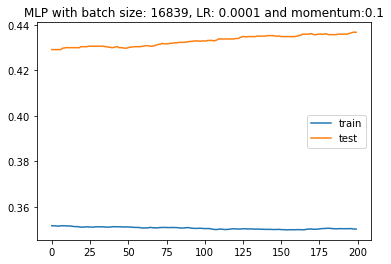

148/148 - 0s - loss: nan - accuracy: 0.5249 - 250ms/epoch - 2ms/step
148/148 - 0s - loss: nan - accuracy: 0.5249 - 141ms/epoch - 954us/step
148/148 - 0s - loss: nan - accuracy: 0.5249 - 125ms/epoch - 847us/step
with batch size = 1, LR= 1 and momentum=0.2
Test Accuracy: 0.525 


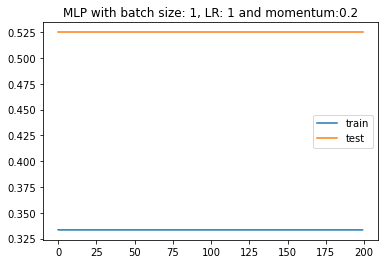

148/148 - 0s - loss: 1.1069 - accuracy: 0.3022 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1069 - accuracy: 0.3022 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.1069 - accuracy: 0.3022 - 156ms/epoch - 1ms/step
with batch size = 32, LR= 1 and momentum=0.2
Test Accuracy: 0.302 


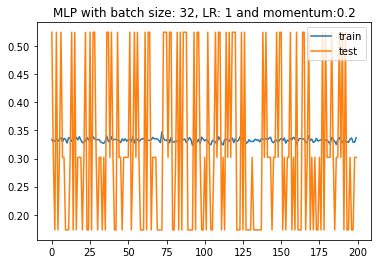

148/148 - 0s - loss: 1.0876 - accuracy: 0.5249 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0876 - accuracy: 0.5249 - 125ms/epoch - 846us/step
148/148 - 0s - loss: 1.0876 - accuracy: 0.5249 - 141ms/epoch - 950us/step
with batch size = 64, LR= 1 and momentum=0.2
Test Accuracy: 0.525 


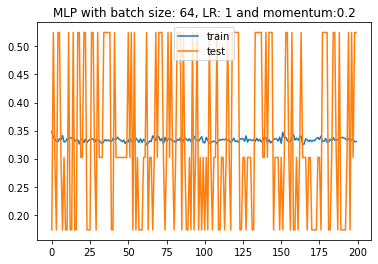

148/148 - 0s - loss: 0.6247 - accuracy: 0.7239 - 140ms/epoch - 945us/step
148/148 - 0s - loss: 0.6247 - accuracy: 0.7239 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6247 - accuracy: 0.7239 - 126ms/epoch - 849us/step
with batch size = 128, LR= 1 and momentum=0.2
Test Accuracy: 0.724 


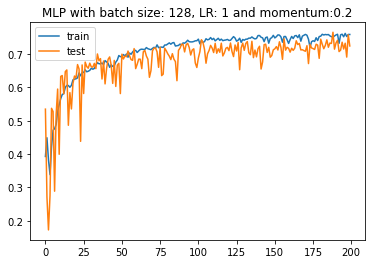

148/148 - 0s - loss: 0.5843 - accuracy: 0.7616 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5843 - accuracy: 0.7616 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5843 - accuracy: 0.7616 - 141ms/epoch - 950us/step
with batch size = 256, LR= 1 and momentum=0.2
Test Accuracy: 0.762 


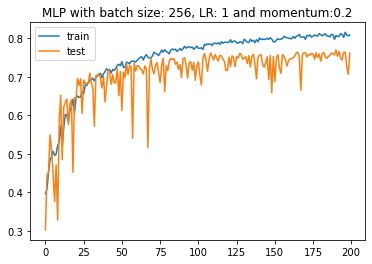

148/148 - 0s - loss: 0.5885 - accuracy: 0.7716 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5885 - accuracy: 0.7716 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5885 - accuracy: 0.7716 - 125ms/epoch - 844us/step
with batch size = 562, LR= 1 and momentum=0.2
Test Accuracy: 0.772 


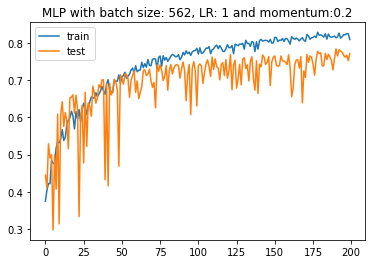

148/148 - 0s - loss: 0.7571 - accuracy: 0.6580 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.7571 - accuracy: 0.6580 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.7571 - accuracy: 0.6580 - 125ms/epoch - 845us/step
with batch size = 1024, LR= 1 and momentum=0.2
Test Accuracy: 0.658 


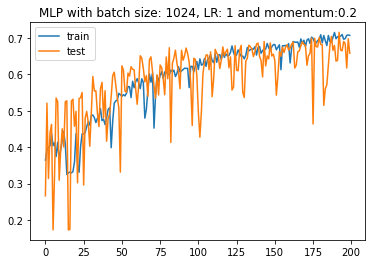

148/148 - 0s - loss: 0.9714 - accuracy: 0.5520 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.9714 - accuracy: 0.5520 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9714 - accuracy: 0.5520 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 1 and momentum=0.2
Test Accuracy: 0.552 


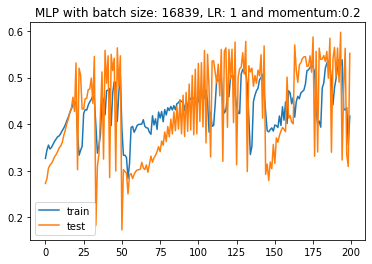

148/148 - 0s - loss: 1.1793 - accuracy: 0.1729 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 1.1793 - accuracy: 0.1729 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1793 - accuracy: 0.1729 - 126ms/epoch - 850us/step
with batch size = 1, LR= 0.1 and momentum=0.2
Test Accuracy: 0.173 


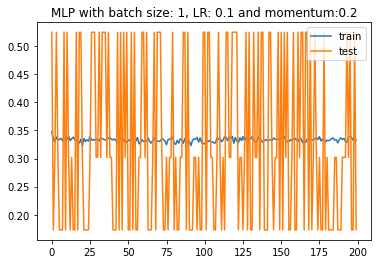

148/148 - 0s - loss: 0.6085 - accuracy: 0.7616 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 0.6085 - accuracy: 0.7616 - 126ms/epoch - 853us/step
148/148 - 0s - loss: 0.6085 - accuracy: 0.7616 - 125ms/epoch - 847us/step
with batch size = 32, LR= 0.1 and momentum=0.2
Test Accuracy: 0.762 


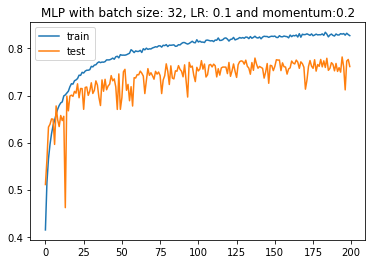

148/148 - 0s - loss: 0.6062 - accuracy: 0.7853 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6062 - accuracy: 0.7853 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6062 - accuracy: 0.7853 - 125ms/epoch - 845us/step
with batch size = 64, LR= 0.1 and momentum=0.2
Test Accuracy: 0.785 


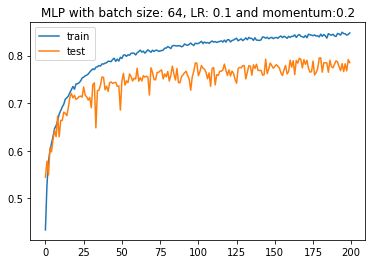

148/148 - 0s - loss: 0.5618 - accuracy: 0.7906 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7906 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7906 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.1 and momentum=0.2
Test Accuracy: 0.791 


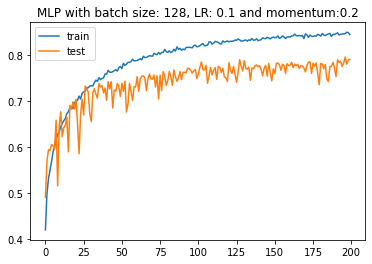

148/148 - 0s - loss: 0.5748 - accuracy: 0.7699 - 118ms/epoch - 800us/step
148/148 - 0s - loss: 0.5748 - accuracy: 0.7699 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.5748 - accuracy: 0.7699 - 121ms/epoch - 818us/step
with batch size = 256, LR= 0.1 and momentum=0.2
Test Accuracy: 0.770 


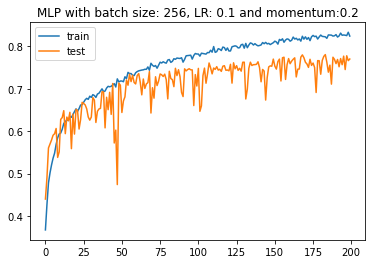

148/148 - 0s - loss: 0.5990 - accuracy: 0.7550 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5990 - accuracy: 0.7550 - 121ms/epoch - 821us/step
148/148 - 0s - loss: 0.5990 - accuracy: 0.7550 - 111ms/epoch - 748us/step
with batch size = 562, LR= 0.1 and momentum=0.2
Test Accuracy: 0.755 


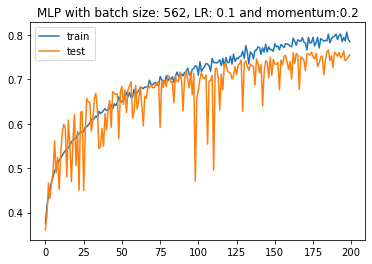

148/148 - 0s - loss: 0.6476 - accuracy: 0.7135 - 115ms/epoch - 777us/step
148/148 - 0s - loss: 0.6476 - accuracy: 0.7135 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.6476 - accuracy: 0.7135 - 117ms/epoch - 789us/step
with batch size = 1024, LR= 0.1 and momentum=0.2
Test Accuracy: 0.713 


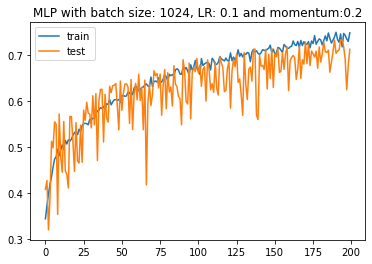

148/148 - 0s - loss: 0.9284 - accuracy: 0.5512 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9284 - accuracy: 0.5512 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9284 - accuracy: 0.5512 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.1 and momentum=0.2
Test Accuracy: 0.551 


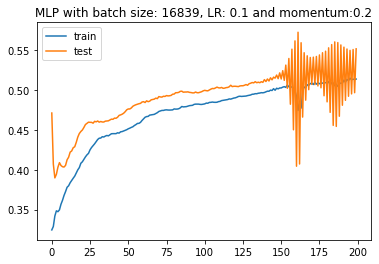

148/148 - 0s - loss: 0.5568 - accuracy: 0.7572 - 232ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5568 - accuracy: 0.7572 - 114ms/epoch - 768us/step
148/148 - 0s - loss: 0.5568 - accuracy: 0.7572 - 111ms/epoch - 748us/step
with batch size = 1, LR= 0.01 and momentum=0.2
Test Accuracy: 0.757 


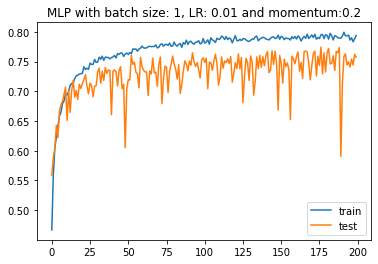

148/148 - 0s - loss: 0.6159 - accuracy: 0.7588 - 112ms/epoch - 755us/step
148/148 - 0s - loss: 0.6159 - accuracy: 0.7588 - 111ms/epoch - 747us/step
148/148 - 0s - loss: 0.6159 - accuracy: 0.7588 - 111ms/epoch - 748us/step
with batch size = 32, LR= 0.01 and momentum=0.2
Test Accuracy: 0.759 


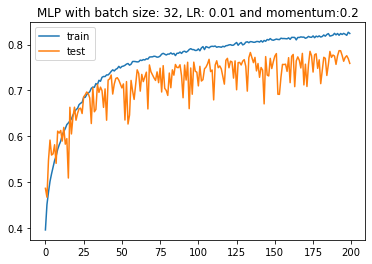

148/148 - 0s - loss: 0.5997 - accuracy: 0.7476 - 114ms/epoch - 773us/step
148/148 - 0s - loss: 0.5997 - accuracy: 0.7476 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5997 - accuracy: 0.7476 - 111ms/epoch - 753us/step
with batch size = 64, LR= 0.01 and momentum=0.2
Test Accuracy: 0.748 


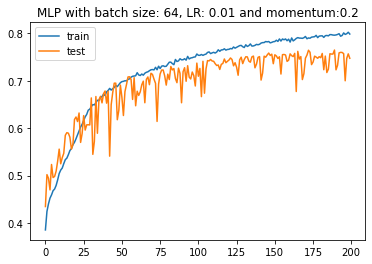

148/148 - 0s - loss: 0.6130 - accuracy: 0.7351 - 127ms/epoch - 857us/step
148/148 - 0s - loss: 0.6130 - accuracy: 0.7351 - 142ms/epoch - 961us/step
148/148 - 0s - loss: 0.6130 - accuracy: 0.7351 - 110ms/epoch - 746us/step
with batch size = 128, LR= 0.01 and momentum=0.2
Test Accuracy: 0.735 


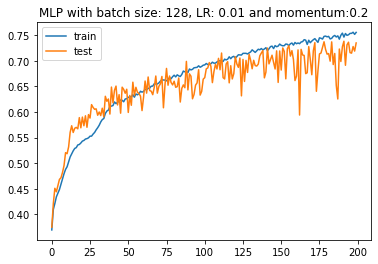

148/148 - 0s - loss: 0.7244 - accuracy: 0.6771 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.7244 - accuracy: 0.6771 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.7244 - accuracy: 0.6771 - 111ms/epoch - 748us/step
with batch size = 256, LR= 0.01 and momentum=0.2
Test Accuracy: 0.677 


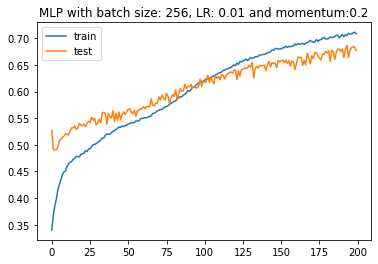

148/148 - 0s - loss: 0.8146 - accuracy: 0.6277 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.8146 - accuracy: 0.6277 - 115ms/epoch - 780us/step
148/148 - 0s - loss: 0.8146 - accuracy: 0.6277 - 120ms/epoch - 808us/step
with batch size = 562, LR= 0.01 and momentum=0.2
Test Accuracy: 0.628 


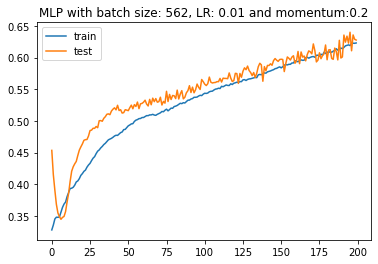

148/148 - 0s - loss: 0.9003 - accuracy: 0.6054 - 127ms/epoch - 860us/step
148/148 - 0s - loss: 0.9003 - accuracy: 0.6054 - 113ms/epoch - 766us/step
148/148 - 0s - loss: 0.9003 - accuracy: 0.6054 - 121ms/epoch - 817us/step
with batch size = 1024, LR= 0.01 and momentum=0.2
Test Accuracy: 0.605 


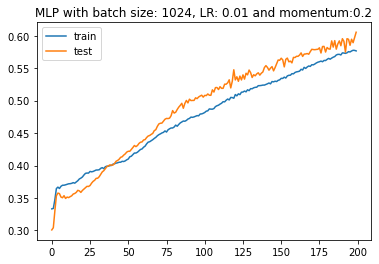

148/148 - 0s - loss: 1.0570 - accuracy: 0.4685 - 118ms/epoch - 796us/step
148/148 - 0s - loss: 1.0570 - accuracy: 0.4685 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 1.0570 - accuracy: 0.4685 - 122ms/epoch - 821us/step
with batch size = 16839, LR= 0.01 and momentum=0.2
Test Accuracy: 0.469 


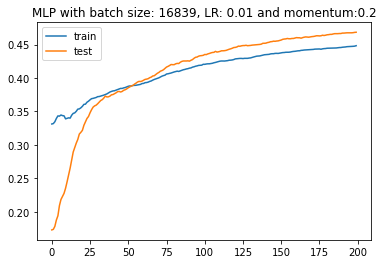

148/148 - 0s - loss: 0.5825 - accuracy: 0.7777 - 232ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5825 - accuracy: 0.7777 - 131ms/epoch - 883us/step
148/148 - 0s - loss: 0.5825 - accuracy: 0.7777 - 141ms/epoch - 956us/step
with batch size = 1, LR= 0.001 and momentum=0.2
Test Accuracy: 0.778 


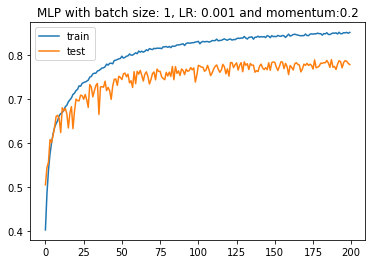

148/148 - 0s - loss: 0.7435 - accuracy: 0.6633 - 120ms/epoch - 811us/step
148/148 - 0s - loss: 0.7435 - accuracy: 0.6633 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.7435 - accuracy: 0.6633 - 121ms/epoch - 818us/step
with batch size = 32, LR= 0.001 and momentum=0.2
Test Accuracy: 0.663 


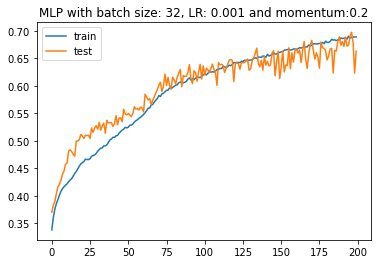

148/148 - 0s - loss: 0.8293 - accuracy: 0.6194 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.8293 - accuracy: 0.6194 - 116ms/epoch - 783us/step
148/148 - 0s - loss: 0.8293 - accuracy: 0.6194 - 121ms/epoch - 817us/step
with batch size = 64, LR= 0.001 and momentum=0.2
Test Accuracy: 0.619 


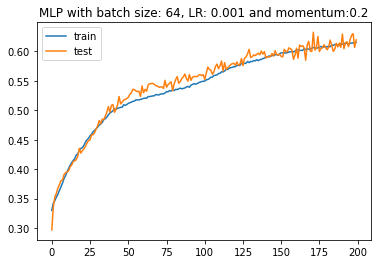

148/148 - 0s - loss: 0.9238 - accuracy: 0.5669 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 0.9238 - accuracy: 0.5669 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.9238 - accuracy: 0.5669 - 111ms/epoch - 748us/step
with batch size = 128, LR= 0.001 and momentum=0.2
Test Accuracy: 0.567 


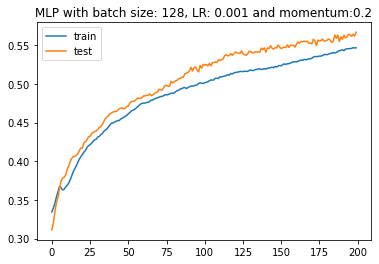

148/148 - 0s - loss: 1.0409 - accuracy: 0.4887 - 197ms/epoch - 1ms/step
148/148 - 0s - loss: 1.0409 - accuracy: 0.4887 - 120ms/epoch - 811us/step
148/148 - 0s - loss: 1.0409 - accuracy: 0.4887 - 111ms/epoch - 750us/step
with batch size = 256, LR= 0.001 and momentum=0.2
Test Accuracy: 0.489 


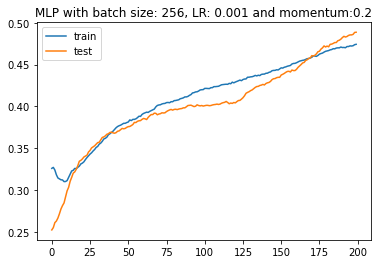

148/148 - 0s - loss: 1.0585 - accuracy: 0.4607 - 126ms/epoch - 853us/step
148/148 - 0s - loss: 1.0585 - accuracy: 0.4607 - 131ms/epoch - 883us/step
148/148 - 0s - loss: 1.0585 - accuracy: 0.4607 - 110ms/epoch - 747us/step
with batch size = 562, LR= 0.001 and momentum=0.2
Test Accuracy: 0.461 


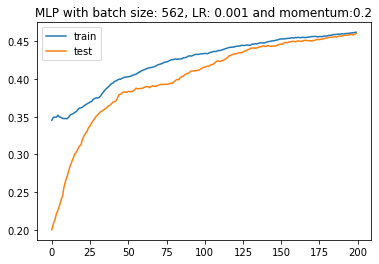

148/148 - 0s - loss: 1.0971 - accuracy: 0.3975 - 112ms/epoch - 760us/step
148/148 - 0s - loss: 1.0971 - accuracy: 0.3975 - 124ms/epoch - 836us/step
148/148 - 0s - loss: 1.0971 - accuracy: 0.3975 - 121ms/epoch - 816us/step
with batch size = 1024, LR= 0.001 and momentum=0.2
Test Accuracy: 0.398 


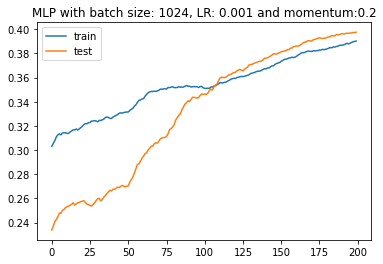

148/148 - 0s - loss: 1.1416 - accuracy: 0.2270 - 129ms/epoch - 870us/step
148/148 - 0s - loss: 1.1416 - accuracy: 0.2270 - 129ms/epoch - 874us/step
148/148 - 0s - loss: 1.1416 - accuracy: 0.2270 - 131ms/epoch - 885us/step
with batch size = 16839, LR= 0.001 and momentum=0.2
Test Accuracy: 0.227 


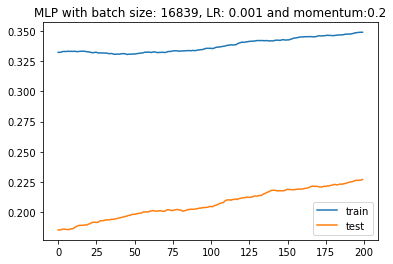

148/148 - 0s - loss: 0.6399 - accuracy: 0.7173 - 208ms/epoch - 1ms/step
148/148 - 0s - loss: 0.6399 - accuracy: 0.7173 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6399 - accuracy: 0.7173 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.717 


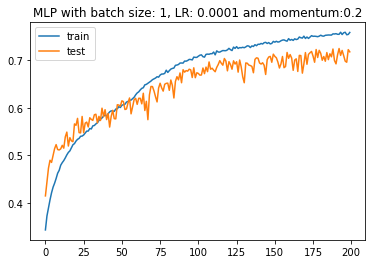

148/148 - 0s - loss: 1.0683 - accuracy: 0.4336 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0683 - accuracy: 0.4336 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0683 - accuracy: 0.4336 - 110ms/epoch - 746us/step
with batch size = 32, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.434 


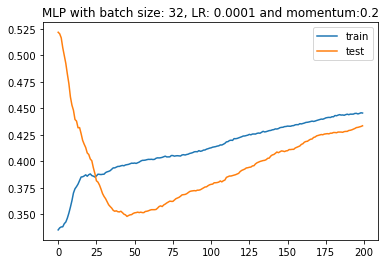

148/148 - 0s - loss: 1.0876 - accuracy: 0.3147 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0876 - accuracy: 0.3147 - 109ms/epoch - 738us/step
148/148 - 0s - loss: 1.0876 - accuracy: 0.3147 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.315 


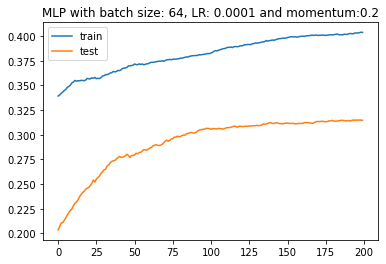

148/148 - 0s - loss: 1.0979 - accuracy: 0.3596 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 1.0979 - accuracy: 0.3596 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0979 - accuracy: 0.3596 - 110ms/epoch - 746us/step
with batch size = 128, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.360 


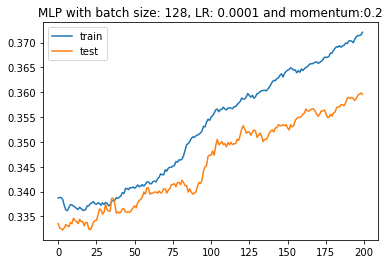

148/148 - 0s - loss: 1.1030 - accuracy: 0.3306 - 114ms/epoch - 767us/step
148/148 - 0s - loss: 1.1030 - accuracy: 0.3306 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1030 - accuracy: 0.3306 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.331 


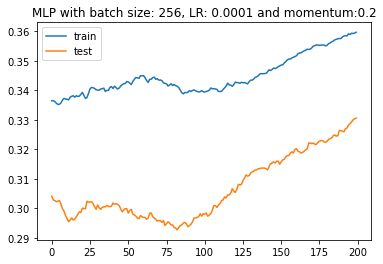

148/148 - 0s - loss: 1.0666 - accuracy: 0.4245 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0666 - accuracy: 0.4245 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0666 - accuracy: 0.4245 - 94ms/epoch - 633us/step
with batch size = 562, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.424 


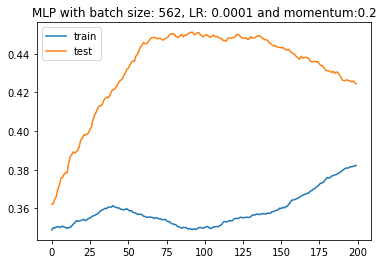

148/148 - 0s - loss: 1.1150 - accuracy: 0.3147 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 1.1150 - accuracy: 0.3147 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 1.1150 - accuracy: 0.3147 - 112ms/epoch - 755us/step
with batch size = 1024, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.315 


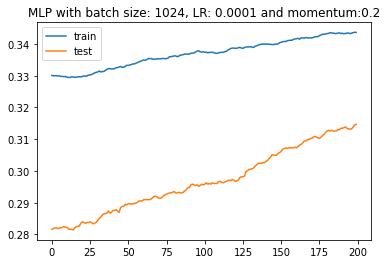

148/148 - 0s - loss: 1.0754 - accuracy: 0.3533 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 1.0754 - accuracy: 0.3533 - 100ms/epoch - 674us/step
148/148 - 0s - loss: 1.0754 - accuracy: 0.3533 - 112ms/epoch - 760us/step
with batch size = 16839, LR= 0.0001 and momentum=0.2
Test Accuracy: 0.353 


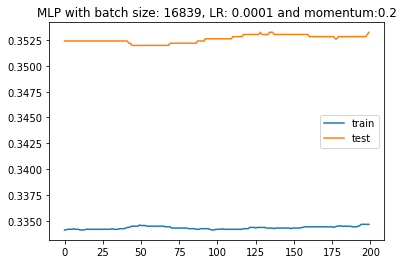

148/148 - 0s - loss: 1.8088 - accuracy: 0.1729 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 1.8088 - accuracy: 0.1729 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.8088 - accuracy: 0.1729 - 140ms/epoch - 948us/step
with batch size = 1, LR= 1 and momentum=0.3
Test Accuracy: 0.173 


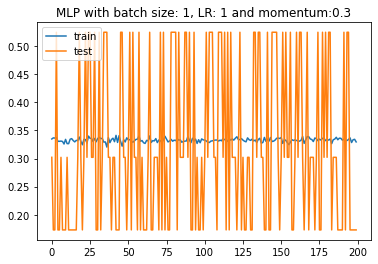

148/148 - 0s - loss: 1.1613 - accuracy: 0.1729 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1613 - accuracy: 0.1729 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1613 - accuracy: 0.1729 - 109ms/epoch - 739us/step
with batch size = 32, LR= 1 and momentum=0.3
Test Accuracy: 0.173 


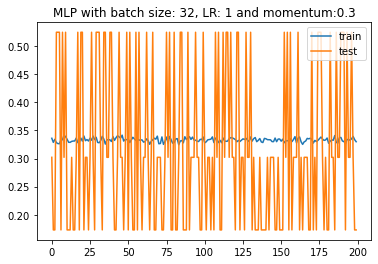

148/148 - 0s - loss: 1.0737 - accuracy: 0.3022 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0737 - accuracy: 0.3022 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0737 - accuracy: 0.3022 - 125ms/epoch - 845us/step
with batch size = 64, LR= 1 and momentum=0.3
Test Accuracy: 0.302 


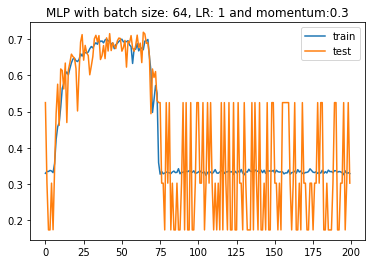

148/148 - 0s - loss: 0.6426 - accuracy: 0.7148 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6426 - accuracy: 0.7148 - 141ms/epoch - 951us/step
148/148 - 0s - loss: 0.6426 - accuracy: 0.7148 - 141ms/epoch - 952us/step
with batch size = 128, LR= 1 and momentum=0.3
Test Accuracy: 0.715 


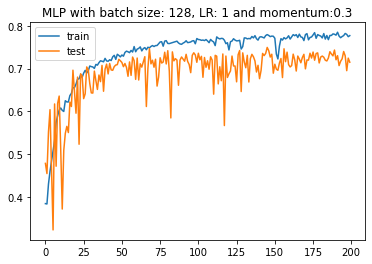

148/148 - 0s - loss: 0.5661 - accuracy: 0.7707 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5661 - accuracy: 0.7707 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5661 - accuracy: 0.7707 - 156ms/epoch - 1ms/step
with batch size = 256, LR= 1 and momentum=0.3
Test Accuracy: 0.771 


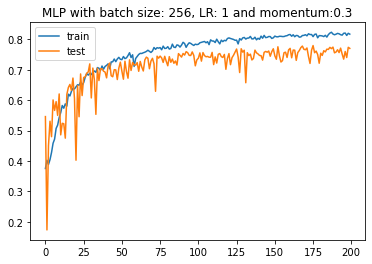

148/148 - 0s - loss: 0.5393 - accuracy: 0.7819 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5393 - accuracy: 0.7819 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5393 - accuracy: 0.7819 - 109ms/epoch - 739us/step
with batch size = 562, LR= 1 and momentum=0.3
Test Accuracy: 0.782 


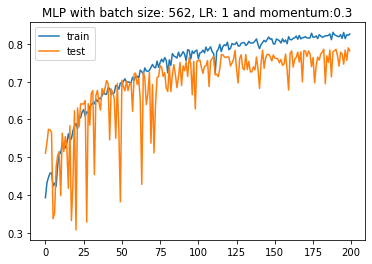

148/148 - 0s - loss: 0.6786 - accuracy: 0.6843 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6786 - accuracy: 0.6843 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6786 - accuracy: 0.6843 - 109ms/epoch - 739us/step
with batch size = 1024, LR= 1 and momentum=0.3
Test Accuracy: 0.684 


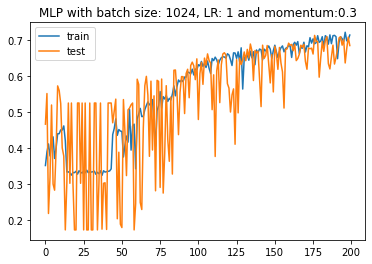

148/148 - 0s - loss: 0.9219 - accuracy: 0.5972 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 0.9219 - accuracy: 0.5972 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.9219 - accuracy: 0.5972 - 125ms/epoch - 845us/step
with batch size = 16839, LR= 1 and momentum=0.3
Test Accuracy: 0.597 


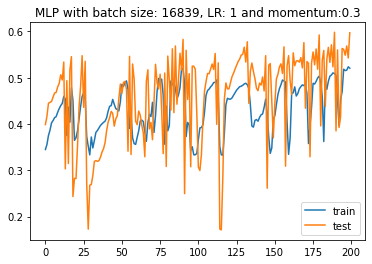

In [ ]:
diff_batchS=[1,32,64,128,256,562,1024,16839]
diff_lR=[1,0.1,0.01,0.001,0.0001]
momentum = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

for i in range(len(momentum)):
    for j in range(len(diff_lR)):
        for k in range(len(diff_batchS)):
            MLP().testLrGdMom(X_train_os, y_train_os,X_test, y_test, 200, diff_batchS[k],diff_lR[j],momentum[i])

148/148 - 1s - loss: 1.3554 - accuracy: 0.1725 - 573ms/epoch - 4ms/step
148/148 - 0s - loss: 1.3554 - accuracy: 0.1725 - 124ms/epoch - 840us/step
148/148 - 0s - loss: 1.3554 - accuracy: 0.1725 - 131ms/epoch - 886us/step
with batch size = 1, LR= 1 and momentum=0.4
Test Accuracy: 0.172 


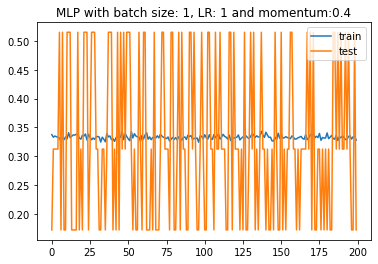

148/148 - 0s - loss: 1.0759 - accuracy: 0.5149 - 136ms/epoch - 918us/step
148/148 - 0s - loss: 1.0759 - accuracy: 0.5149 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0759 - accuracy: 0.5149 - 134ms/epoch - 904us/step
with batch size = 32, LR= 1 and momentum=0.4
Test Accuracy: 0.515 


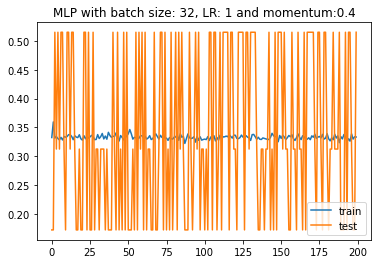

148/148 - 0s - loss: 1.1140 - accuracy: 0.1725 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 1.1140 - accuracy: 0.1725 - 121ms/epoch - 819us/step
148/148 - 0s - loss: 1.1140 - accuracy: 0.1725 - 125ms/epoch - 847us/step
with batch size = 64, LR= 1 and momentum=0.4
Test Accuracy: 0.172 


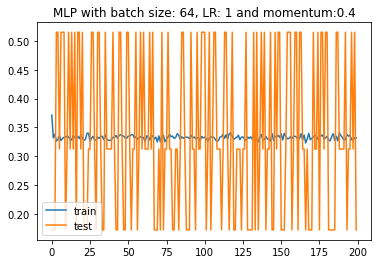

148/148 - 0s - loss: 1.0856 - accuracy: 0.5149 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0856 - accuracy: 0.5149 - 134ms/epoch - 904us/step
148/148 - 0s - loss: 1.0856 - accuracy: 0.5149 - 109ms/epoch - 735us/step
with batch size = 128, LR= 1 and momentum=0.4
Test Accuracy: 0.515 


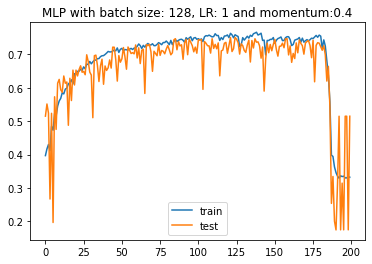

148/148 - 0s - loss: 1.1219 - accuracy: 0.1725 - 120ms/epoch - 812us/step
148/148 - 0s - loss: 1.1219 - accuracy: 0.1725 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1219 - accuracy: 0.1725 - 109ms/epoch - 739us/step
with batch size = 256, LR= 1 and momentum=0.4
Test Accuracy: 0.172 


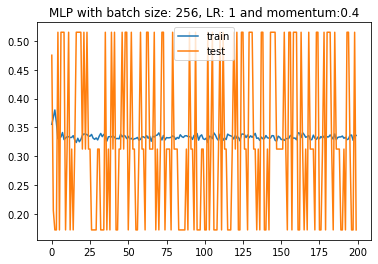

148/148 - 0s - loss: 0.6049 - accuracy: 0.7413 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6049 - accuracy: 0.7413 - 117ms/epoch - 788us/step
148/148 - 0s - loss: 0.6049 - accuracy: 0.7413 - 125ms/epoch - 844us/step
with batch size = 562, LR= 1 and momentum=0.4
Test Accuracy: 0.741 


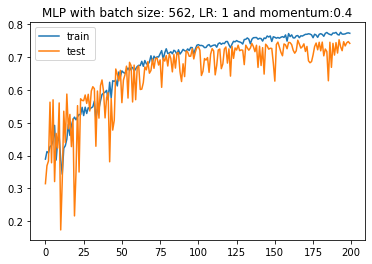

148/148 - 0s - loss: 0.6067 - accuracy: 0.7453 - 111ms/epoch - 752us/step
148/148 - 0s - loss: 0.6067 - accuracy: 0.7453 - 137ms/epoch - 927us/step
148/148 - 0s - loss: 0.6067 - accuracy: 0.7453 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 1 and momentum=0.4
Test Accuracy: 0.745 


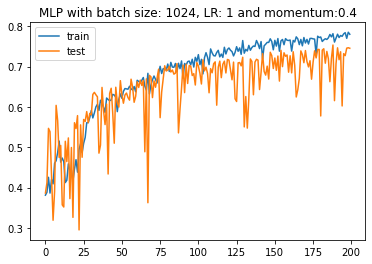

148/148 - 0s - loss: 1.0198 - accuracy: 0.4630 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0198 - accuracy: 0.4630 - 104ms/epoch - 704us/step
148/148 - 0s - loss: 1.0198 - accuracy: 0.4630 - 125ms/epoch - 846us/step
with batch size = 16839, LR= 1 and momentum=0.4
Test Accuracy: 0.463 


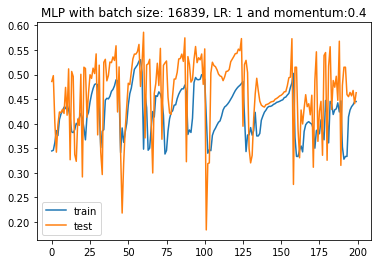

148/148 - 0s - loss: 1.1167 - accuracy: 0.3126 - 232ms/epoch - 2ms/step
148/148 - 0s - loss: 1.1167 - accuracy: 0.3126 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 1.1167 - accuracy: 0.3126 - 98ms/epoch - 660us/step
with batch size = 1, LR= 0.1 and momentum=0.4
Test Accuracy: 0.313 


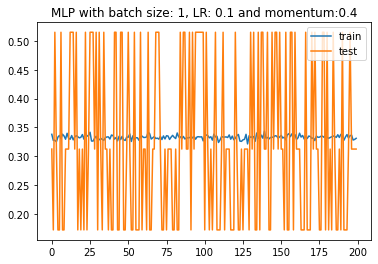

148/148 - 0s - loss: 0.5274 - accuracy: 0.7868 - 131ms/epoch - 886us/step
148/148 - 0s - loss: 0.5274 - accuracy: 0.7868 - 130ms/epoch - 882us/step
148/148 - 0s - loss: 0.5274 - accuracy: 0.7868 - 111ms/epoch - 748us/step
with batch size = 32, LR= 0.1 and momentum=0.4
Test Accuracy: 0.787 


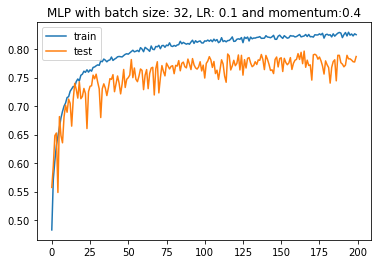

148/148 - 0s - loss: 0.5919 - accuracy: 0.7449 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5919 - accuracy: 0.7449 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 0.5919 - accuracy: 0.7449 - 114ms/epoch - 772us/step
with batch size = 64, LR= 0.1 and momentum=0.4
Test Accuracy: 0.745 


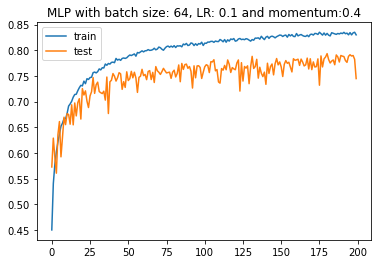

148/148 - 0s - loss: 0.5309 - accuracy: 0.7830 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5309 - accuracy: 0.7830 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5309 - accuracy: 0.7830 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.1 and momentum=0.4
Test Accuracy: 0.783 


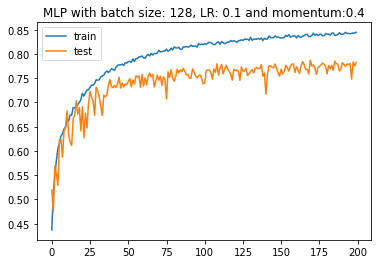

148/148 - 0s - loss: 0.5618 - accuracy: 0.7697 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7697 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7697 - 125ms/epoch - 844us/step
with batch size = 256, LR= 0.1 and momentum=0.4
Test Accuracy: 0.770 


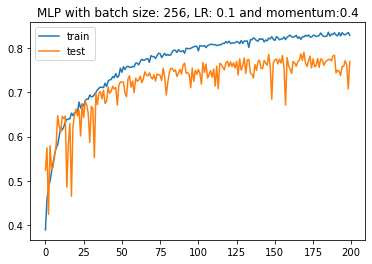

148/148 - 0s - loss: 0.6780 - accuracy: 0.7150 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6780 - accuracy: 0.7150 - 117ms/epoch - 788us/step
148/148 - 0s - loss: 0.6780 - accuracy: 0.7150 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.1 and momentum=0.4
Test Accuracy: 0.715 


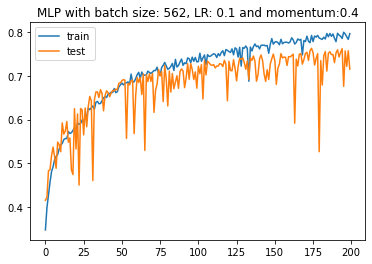

148/148 - 0s - loss: 0.6129 - accuracy: 0.7254 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6129 - accuracy: 0.7254 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6129 - accuracy: 0.7254 - 121ms/epoch - 816us/step
with batch size = 1024, LR= 0.1 and momentum=0.4
Test Accuracy: 0.725 


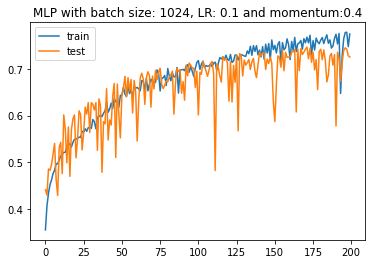

148/148 - 0s - loss: 0.9492 - accuracy: 0.5571 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9492 - accuracy: 0.5571 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9492 - accuracy: 0.5571 - 130ms/epoch - 877us/step
with batch size = 16839, LR= 0.1 and momentum=0.4
Test Accuracy: 0.557 


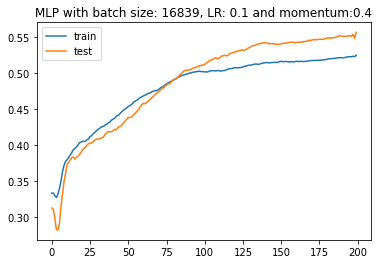

148/148 - 0s - loss: 0.5604 - accuracy: 0.7317 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5604 - accuracy: 0.7317 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5604 - accuracy: 0.7317 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.01 and momentum=0.4
Test Accuracy: 0.732 


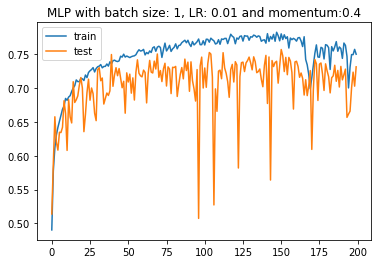

148/148 - 0s - loss: 0.5207 - accuracy: 0.7809 - 109ms/epoch - 740us/step
148/148 - 0s - loss: 0.5207 - accuracy: 0.7809 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5207 - accuracy: 0.7809 - 109ms/epoch - 738us/step
with batch size = 32, LR= 0.01 and momentum=0.4
Test Accuracy: 0.781 


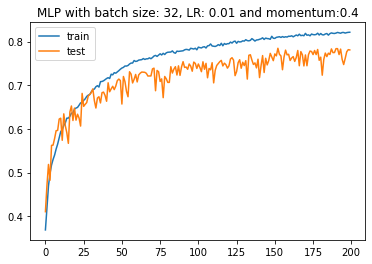

148/148 - 0s - loss: 0.6244 - accuracy: 0.7273 - 121ms/epoch - 819us/step
148/148 - 0s - loss: 0.6244 - accuracy: 0.7273 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6244 - accuracy: 0.7273 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.01 and momentum=0.4
Test Accuracy: 0.727 


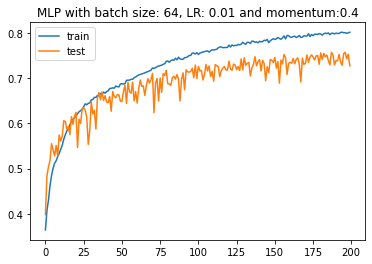

148/148 - 0s - loss: 0.6185 - accuracy: 0.7389 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6185 - accuracy: 0.7389 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6185 - accuracy: 0.7389 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.01 and momentum=0.4
Test Accuracy: 0.739 


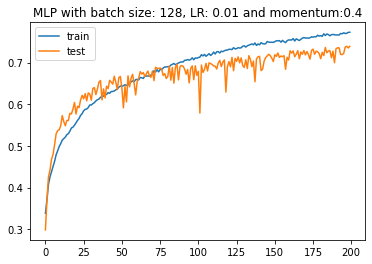

148/148 - 0s - loss: 0.6743 - accuracy: 0.6925 - 125ms/epoch - 846us/step
148/148 - 0s - loss: 0.6743 - accuracy: 0.6925 - 132ms/epoch - 893us/step
148/148 - 0s - loss: 0.6743 - accuracy: 0.6925 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.01 and momentum=0.4
Test Accuracy: 0.693 


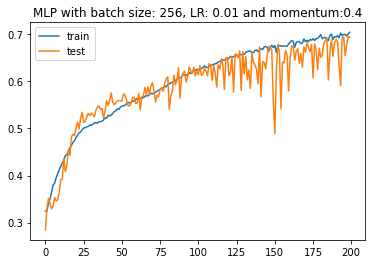

148/148 - 0s - loss: 0.7503 - accuracy: 0.6601 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7503 - accuracy: 0.6601 - 124ms/epoch - 841us/step
148/148 - 0s - loss: 0.7503 - accuracy: 0.6601 - 110ms/epoch - 740us/step
with batch size = 562, LR= 0.01 and momentum=0.4
Test Accuracy: 0.660 


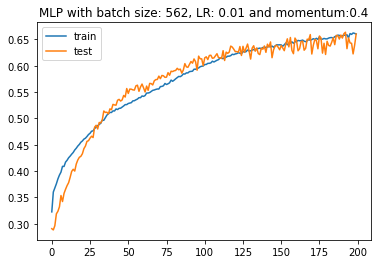

148/148 - 0s - loss: 0.9200 - accuracy: 0.5836 - 104ms/epoch - 706us/step
148/148 - 0s - loss: 0.9200 - accuracy: 0.5836 - 119ms/epoch - 806us/step
148/148 - 0s - loss: 0.9200 - accuracy: 0.5836 - 115ms/epoch - 774us/step
with batch size = 1024, LR= 0.01 and momentum=0.4
Test Accuracy: 0.584 


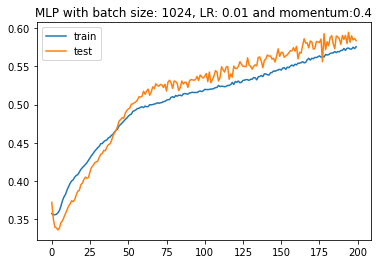

148/148 - 0s - loss: 1.0846 - accuracy: 0.3721 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0846 - accuracy: 0.3721 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0846 - accuracy: 0.3721 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.01 and momentum=0.4
Test Accuracy: 0.372 


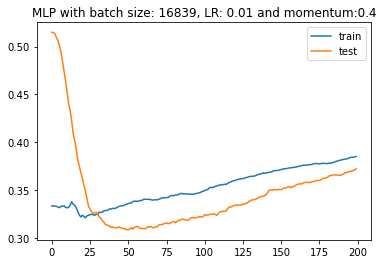

148/148 - 0s - loss: 0.5284 - accuracy: 0.7908 - 222ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5284 - accuracy: 0.7908 - 108ms/epoch - 731us/step
148/148 - 0s - loss: 0.5284 - accuracy: 0.7908 - 110ms/epoch - 746us/step
with batch size = 1, LR= 0.001 and momentum=0.4
Test Accuracy: 0.791 


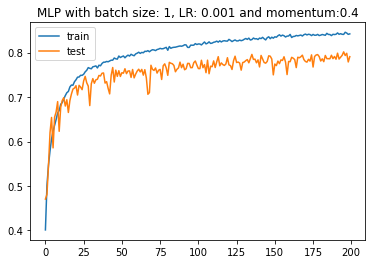

148/148 - 0s - loss: 0.7738 - accuracy: 0.6427 - 126ms/epoch - 850us/step
148/148 - 0s - loss: 0.7738 - accuracy: 0.6427 - 117ms/epoch - 792us/step
148/148 - 0s - loss: 0.7738 - accuracy: 0.6427 - 119ms/epoch - 805us/step
with batch size = 32, LR= 0.001 and momentum=0.4
Test Accuracy: 0.643 


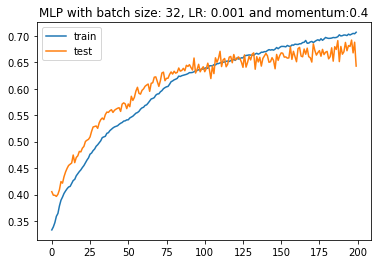

148/148 - 0s - loss: 0.7831 - accuracy: 0.6355 - 116ms/epoch - 781us/step
148/148 - 0s - loss: 0.7831 - accuracy: 0.6355 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.7831 - accuracy: 0.6355 - 111ms/epoch - 748us/step
with batch size = 64, LR= 0.001 and momentum=0.4
Test Accuracy: 0.636 


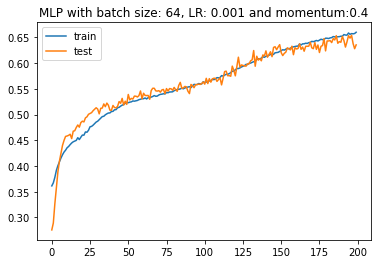

148/148 - 0s - loss: 0.8630 - accuracy: 0.6061 - 122ms/epoch - 827us/step
148/148 - 0s - loss: 0.8630 - accuracy: 0.6061 - 104ms/epoch - 699us/step
148/148 - 0s - loss: 0.8630 - accuracy: 0.6061 - 116ms/epoch - 783us/step
with batch size = 128, LR= 0.001 and momentum=0.4
Test Accuracy: 0.606 


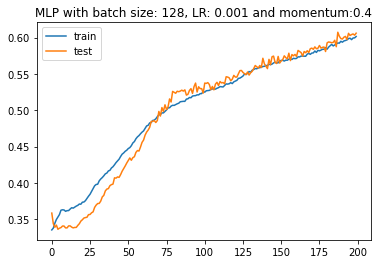

148/148 - 0s - loss: 0.9809 - accuracy: 0.5399 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.9809 - accuracy: 0.5399 - 118ms/epoch - 799us/step
148/148 - 0s - loss: 0.9809 - accuracy: 0.5399 - 116ms/epoch - 781us/step
with batch size = 256, LR= 0.001 and momentum=0.4
Test Accuracy: 0.540 


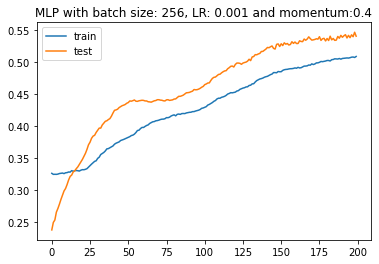

148/148 - 0s - loss: 1.0757 - accuracy: 0.4045 - 124ms/epoch - 835us/step
148/148 - 0s - loss: 1.0757 - accuracy: 0.4045 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 1.0757 - accuracy: 0.4045 - 121ms/epoch - 817us/step
with batch size = 562, LR= 0.001 and momentum=0.4
Test Accuracy: 0.405 


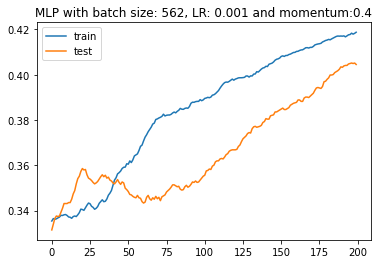

148/148 - 0s - loss: 1.0633 - accuracy: 0.4581 - 118ms/epoch - 798us/step
148/148 - 0s - loss: 1.0633 - accuracy: 0.4581 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 1.0633 - accuracy: 0.4581 - 113ms/epoch - 765us/step
with batch size = 1024, LR= 0.001 and momentum=0.4
Test Accuracy: 0.458 


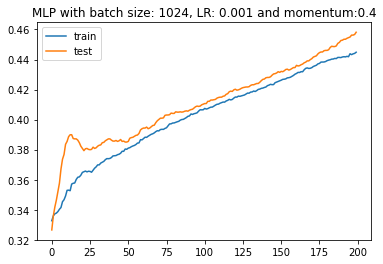

148/148 - 0s - loss: 1.0933 - accuracy: 0.3984 - 126ms/epoch - 854us/step
148/148 - 0s - loss: 1.0933 - accuracy: 0.3984 - 122ms/epoch - 822us/step
148/148 - 0s - loss: 1.0933 - accuracy: 0.3984 - 121ms/epoch - 816us/step
with batch size = 16839, LR= 0.001 and momentum=0.4
Test Accuracy: 0.398 


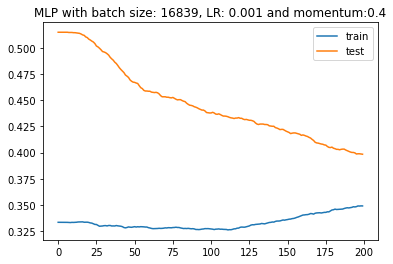

148/148 - 0s - loss: 0.5643 - accuracy: 0.7535 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5643 - accuracy: 0.7535 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5643 - accuracy: 0.7535 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.754 


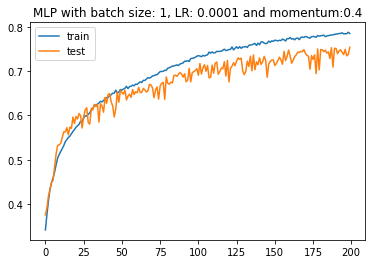

148/148 - 0s - loss: 0.9759 - accuracy: 0.5457 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9759 - accuracy: 0.5457 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9759 - accuracy: 0.5457 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.546 


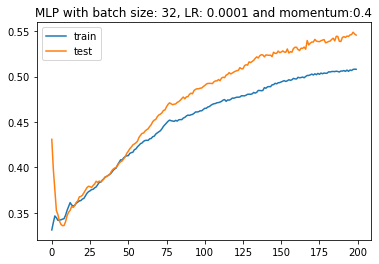

148/148 - 0s - loss: 1.0616 - accuracy: 0.4738 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0616 - accuracy: 0.4738 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0616 - accuracy: 0.4738 - 125ms/epoch - 845us/step
with batch size = 64, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.474 


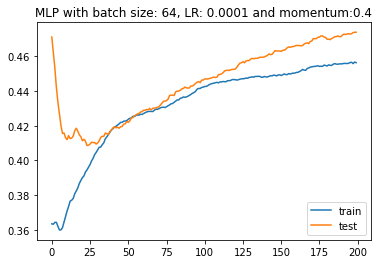

148/148 - 0s - loss: 1.0750 - accuracy: 0.4446 - 121ms/epoch - 819us/step
148/148 - 0s - loss: 1.0750 - accuracy: 0.4446 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0750 - accuracy: 0.4446 - 109ms/epoch - 738us/step
with batch size = 128, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.445 


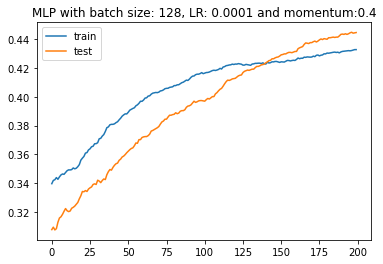

148/148 - 0s - loss: 1.0917 - accuracy: 0.3579 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0917 - accuracy: 0.3579 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0917 - accuracy: 0.3579 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.358 


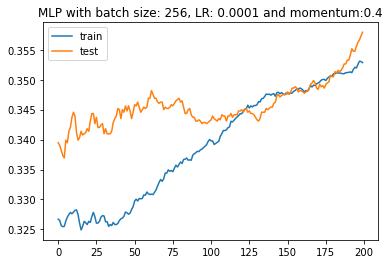

148/148 - 0s - loss: 1.0992 - accuracy: 0.3611 - 112ms/epoch - 755us/step
148/148 - 0s - loss: 1.0992 - accuracy: 0.3611 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0992 - accuracy: 0.3611 - 118ms/epoch - 796us/step
with batch size = 562, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.361 


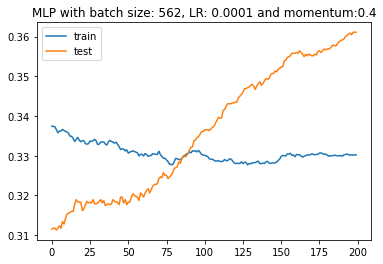

148/148 - 0s - loss: 1.1039 - accuracy: 0.3533 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1039 - accuracy: 0.3533 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1039 - accuracy: 0.3533 - 121ms/epoch - 818us/step
with batch size = 1024, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.353 


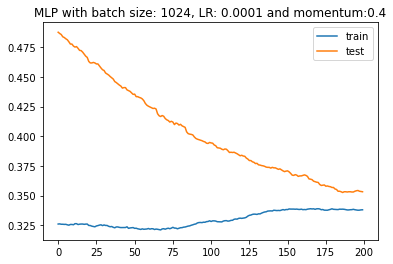

148/148 - 0s - loss: 1.0928 - accuracy: 0.5149 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0928 - accuracy: 0.5149 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0928 - accuracy: 0.5149 - 114ms/epoch - 768us/step
with batch size = 16839, LR= 0.0001 and momentum=0.4
Test Accuracy: 0.515 


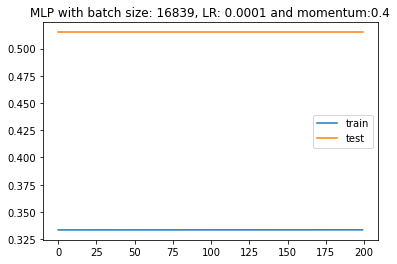

148/148 - 0s - loss: 1.5985 - accuracy: 0.1725 - 216ms/epoch - 1ms/step
148/148 - 0s - loss: 1.5985 - accuracy: 0.1725 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.5985 - accuracy: 0.1725 - 94ms/epoch - 633us/step
with batch size = 1, LR= 1 and momentum=0.5
Test Accuracy: 0.172 


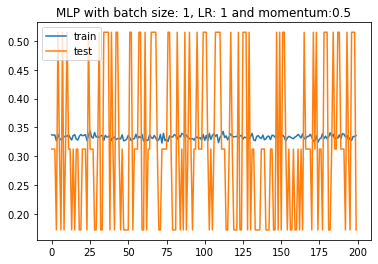

148/148 - 0s - loss: 1.3815 - accuracy: 0.1725 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.3815 - accuracy: 0.1725 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.3815 - accuracy: 0.1725 - 125ms/epoch - 846us/step
with batch size = 32, LR= 1 and momentum=0.5
Test Accuracy: 0.172 


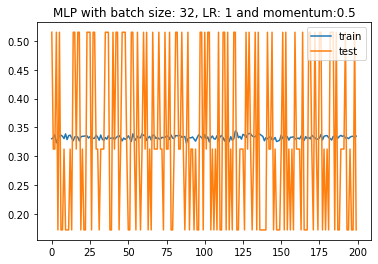

148/148 - 0s - loss: 1.0905 - accuracy: 0.5149 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 1.0905 - accuracy: 0.5149 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0905 - accuracy: 0.5149 - 125ms/epoch - 845us/step
with batch size = 64, LR= 1 and momentum=0.5
Test Accuracy: 0.515 


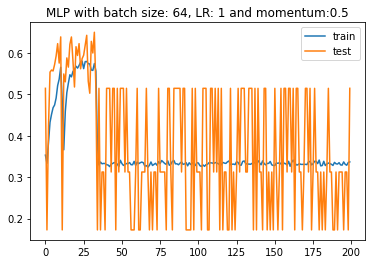

148/148 - 0s - loss: 1.0706 - accuracy: 0.5149 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0706 - accuracy: 0.5149 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0706 - accuracy: 0.5149 - 125ms/epoch - 844us/step
with batch size = 128, LR= 1 and momentum=0.5
Test Accuracy: 0.515 


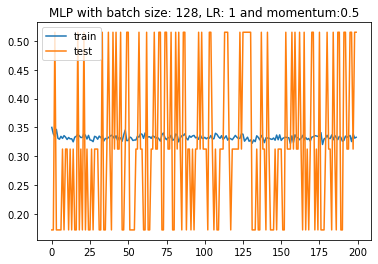

148/148 - 0s - loss: 1.0839 - accuracy: 0.3126 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0839 - accuracy: 0.3126 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0839 - accuracy: 0.3126 - 125ms/epoch - 844us/step
with batch size = 256, LR= 1 and momentum=0.5
Test Accuracy: 0.313 


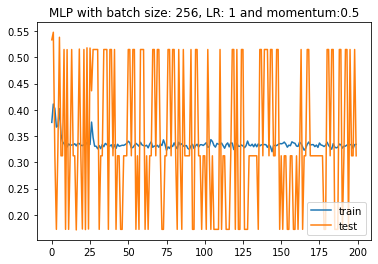

148/148 - 0s - loss: 1.0865 - accuracy: 0.5149 - 108ms/epoch - 730us/step
148/148 - 0s - loss: 1.0865 - accuracy: 0.5149 - 110ms/epoch - 741us/step
148/148 - 0s - loss: 1.0865 - accuracy: 0.5149 - 109ms/epoch - 739us/step
with batch size = 562, LR= 1 and momentum=0.5
Test Accuracy: 0.515 


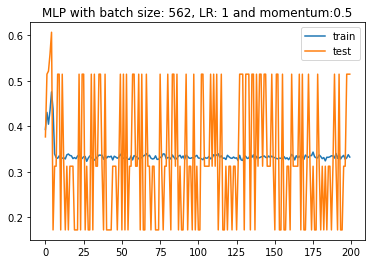

148/148 - 0s - loss: 1.1070 - accuracy: 0.3126 - 117ms/epoch - 794us/step
148/148 - 0s - loss: 1.1070 - accuracy: 0.3126 - 100ms/epoch - 674us/step
148/148 - 0s - loss: 1.1070 - accuracy: 0.3126 - 125ms/epoch - 845us/step
with batch size = 1024, LR= 1 and momentum=0.5
Test Accuracy: 0.313 


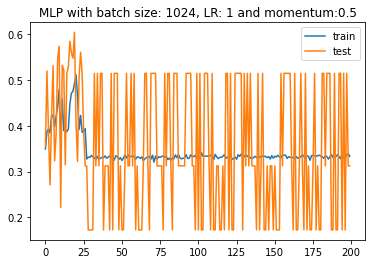

148/148 - 0s - loss: 1.0405 - accuracy: 0.5181 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0405 - accuracy: 0.5181 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0405 - accuracy: 0.5181 - 109ms/epoch - 739us/step
with batch size = 16839, LR= 1 and momentum=0.5
Test Accuracy: 0.518 


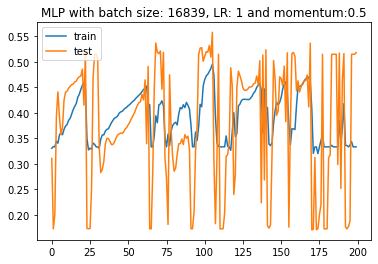

148/148 - 0s - loss: 1.1850 - accuracy: 0.3126 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 1.1850 - accuracy: 0.3126 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1850 - accuracy: 0.3126 - 120ms/epoch - 808us/step
with batch size = 1, LR= 0.1 and momentum=0.5
Test Accuracy: 0.313 


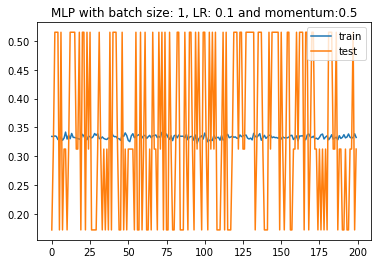

148/148 - 0s - loss: 0.6139 - accuracy: 0.7480 - 103ms/epoch - 694us/step
148/148 - 0s - loss: 0.6139 - accuracy: 0.7480 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 0.6139 - accuracy: 0.7480 - 108ms/epoch - 731us/step
with batch size = 32, LR= 0.1 and momentum=0.5
Test Accuracy: 0.748 


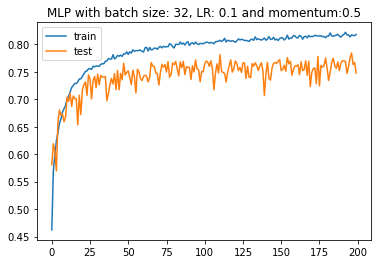

148/148 - 0s - loss: 0.5552 - accuracy: 0.7728 - 110ms/epoch - 746us/step
148/148 - 0s - loss: 0.5552 - accuracy: 0.7728 - 117ms/epoch - 791us/step
148/148 - 0s - loss: 0.5552 - accuracy: 0.7728 - 117ms/epoch - 788us/step
with batch size = 64, LR= 0.1 and momentum=0.5
Test Accuracy: 0.773 


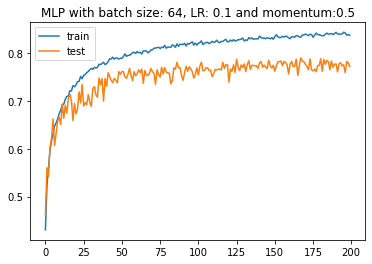

148/148 - 0s - loss: 0.5430 - accuracy: 0.7788 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5430 - accuracy: 0.7788 - 114ms/epoch - 770us/step
148/148 - 0s - loss: 0.5430 - accuracy: 0.7788 - 117ms/epoch - 792us/step
with batch size = 128, LR= 0.1 and momentum=0.5
Test Accuracy: 0.779 


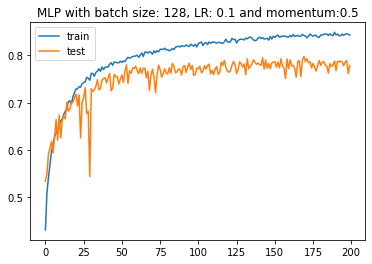

148/148 - 0s - loss: 0.5461 - accuracy: 0.7756 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 0.5461 - accuracy: 0.7756 - 143ms/epoch - 963us/step
148/148 - 0s - loss: 0.5461 - accuracy: 0.7756 - 131ms/epoch - 883us/step
with batch size = 256, LR= 0.1 and momentum=0.5
Test Accuracy: 0.776 


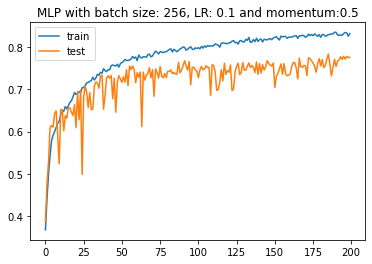

148/148 - 0s - loss: 0.5364 - accuracy: 0.7652 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5364 - accuracy: 0.7652 - 112ms/epoch - 755us/step
148/148 - 0s - loss: 0.5364 - accuracy: 0.7652 - 103ms/epoch - 696us/step
with batch size = 562, LR= 0.1 and momentum=0.5
Test Accuracy: 0.765 


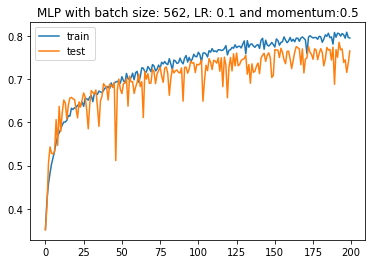

148/148 - 0s - loss: 0.5787 - accuracy: 0.7449 - 128ms/epoch - 867us/step
148/148 - 0s - loss: 0.5787 - accuracy: 0.7449 - 141ms/epoch - 952us/step
148/148 - 0s - loss: 0.5787 - accuracy: 0.7449 - 111ms/epoch - 747us/step
with batch size = 1024, LR= 0.1 and momentum=0.5
Test Accuracy: 0.745 


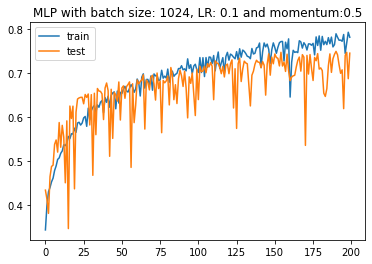

148/148 - 0s - loss: 0.9378 - accuracy: 0.5849 - 101ms/epoch - 681us/step
148/148 - 0s - loss: 0.9378 - accuracy: 0.5849 - 101ms/epoch - 680us/step
148/148 - 0s - loss: 0.9378 - accuracy: 0.5849 - 112ms/epoch - 758us/step
with batch size = 16839, LR= 0.1 and momentum=0.5
Test Accuracy: 0.585 


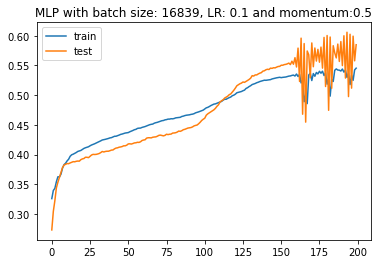

148/148 - 0s - loss: 0.9908 - accuracy: 0.5522 - 230ms/epoch - 2ms/step
148/148 - 0s - loss: 0.9908 - accuracy: 0.5522 - 112ms/epoch - 756us/step
148/148 - 0s - loss: 0.9908 - accuracy: 0.5522 - 111ms/epoch - 753us/step
with batch size = 1, LR= 0.01 and momentum=0.5
Test Accuracy: 0.552 


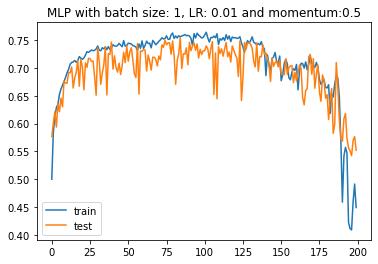

148/148 - 0s - loss: 0.5541 - accuracy: 0.7652 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5541 - accuracy: 0.7652 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 0.5541 - accuracy: 0.7652 - 112ms/epoch - 758us/step
with batch size = 32, LR= 0.01 and momentum=0.5
Test Accuracy: 0.765 


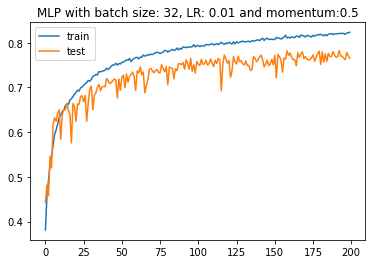

148/148 - 0s - loss: 0.5643 - accuracy: 0.7588 - 124ms/epoch - 840us/step
148/148 - 0s - loss: 0.5643 - accuracy: 0.7588 - 121ms/epoch - 819us/step
148/148 - 0s - loss: 0.5643 - accuracy: 0.7588 - 111ms/epoch - 747us/step
with batch size = 64, LR= 0.01 and momentum=0.5
Test Accuracy: 0.759 


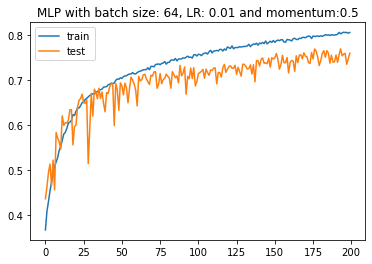

148/148 - 0s - loss: 0.5748 - accuracy: 0.7408 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 0.5748 - accuracy: 0.7408 - 121ms/epoch - 816us/step
148/148 - 0s - loss: 0.5748 - accuracy: 0.7408 - 115ms/epoch - 780us/step
with batch size = 128, LR= 0.01 and momentum=0.5
Test Accuracy: 0.741 


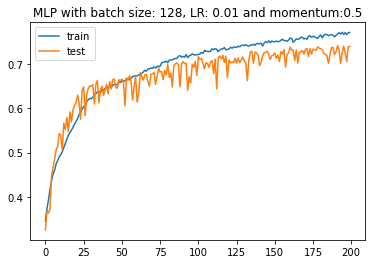

148/148 - 0s - loss: 0.6559 - accuracy: 0.6989 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.6559 - accuracy: 0.6989 - 111ms/epoch - 750us/step
148/148 - 0s - loss: 0.6559 - accuracy: 0.6989 - 112ms/epoch - 755us/step
with batch size = 256, LR= 0.01 and momentum=0.5
Test Accuracy: 0.699 


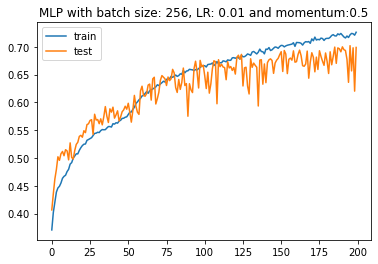

148/148 - 0s - loss: 0.7639 - accuracy: 0.6398 - 115ms/epoch - 779us/step
148/148 - 0s - loss: 0.7639 - accuracy: 0.6398 - 110ms/epoch - 746us/step
148/148 - 0s - loss: 0.7639 - accuracy: 0.6398 - 119ms/epoch - 807us/step
with batch size = 562, LR= 0.01 and momentum=0.5
Test Accuracy: 0.640 


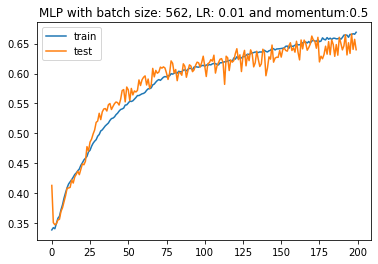

148/148 - 0s - loss: 0.8731 - accuracy: 0.5965 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.8731 - accuracy: 0.5965 - 114ms/epoch - 771us/step
148/148 - 0s - loss: 0.8731 - accuracy: 0.5965 - 109ms/epoch - 735us/step
with batch size = 1024, LR= 0.01 and momentum=0.5
Test Accuracy: 0.597 


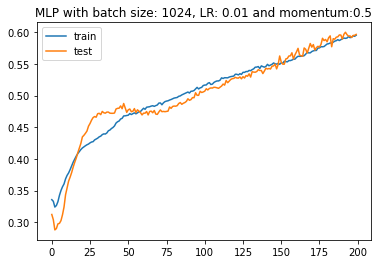

148/148 - 0s - loss: 1.0959 - accuracy: 0.3431 - 116ms/epoch - 786us/step
148/148 - 0s - loss: 1.0959 - accuracy: 0.3431 - 117ms/epoch - 791us/step
148/148 - 0s - loss: 1.0959 - accuracy: 0.3431 - 111ms/epoch - 747us/step
with batch size = 16839, LR= 0.01 and momentum=0.5
Test Accuracy: 0.343 


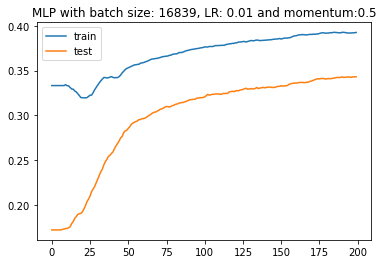

148/148 - 0s - loss: 0.5157 - accuracy: 0.7955 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5157 - accuracy: 0.7955 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5157 - accuracy: 0.7955 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.001 and momentum=0.5
Test Accuracy: 0.796 


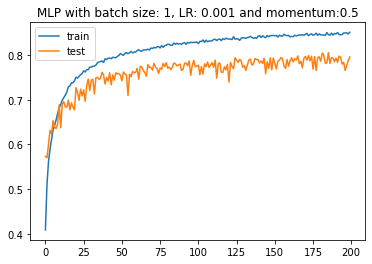

148/148 - 0s - loss: 0.6563 - accuracy: 0.6949 - 109ms/epoch - 740us/step
148/148 - 0s - loss: 0.6563 - accuracy: 0.6949 - 117ms/epoch - 788us/step
148/148 - 0s - loss: 0.6563 - accuracy: 0.6949 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.001 and momentum=0.5
Test Accuracy: 0.695 


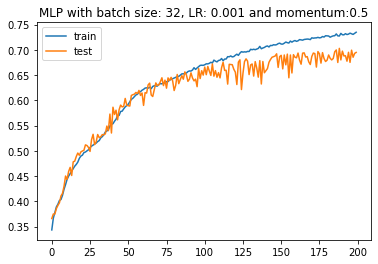

148/148 - 0s - loss: 0.7699 - accuracy: 0.6480 - 109ms/epoch - 738us/step
148/148 - 0s - loss: 0.7699 - accuracy: 0.6480 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7699 - accuracy: 0.6480 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.001 and momentum=0.5
Test Accuracy: 0.648 


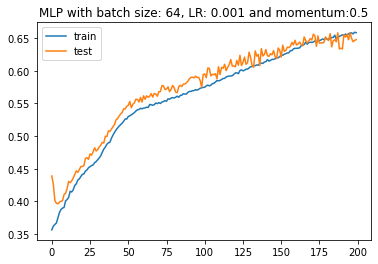

148/148 - 0s - loss: 0.9103 - accuracy: 0.5662 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9103 - accuracy: 0.5662 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9103 - accuracy: 0.5662 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.001 and momentum=0.5
Test Accuracy: 0.566 


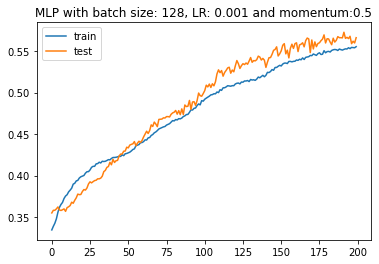

148/148 - 0s - loss: 0.9559 - accuracy: 0.5478 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9559 - accuracy: 0.5478 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.9559 - accuracy: 0.5478 - 141ms/epoch - 950us/step
with batch size = 256, LR= 0.001 and momentum=0.5
Test Accuracy: 0.548 


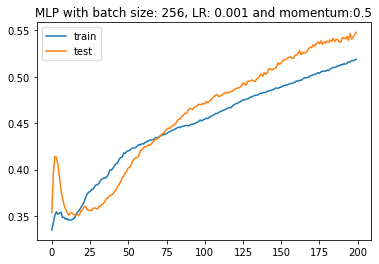

148/148 - 0s - loss: 1.0781 - accuracy: 0.4056 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0781 - accuracy: 0.4056 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 1.0781 - accuracy: 0.4056 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.001 and momentum=0.5
Test Accuracy: 0.406 


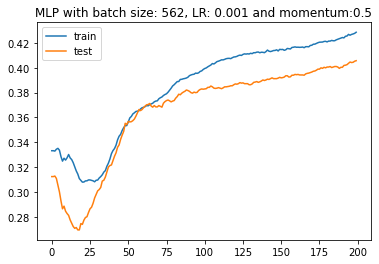

148/148 - 0s - loss: 1.0733 - accuracy: 0.4541 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0733 - accuracy: 0.4541 - 156ms/epoch - 1ms/step
148/148 - 0s - loss: 1.0733 - accuracy: 0.4541 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 0.001 and momentum=0.5
Test Accuracy: 0.454 


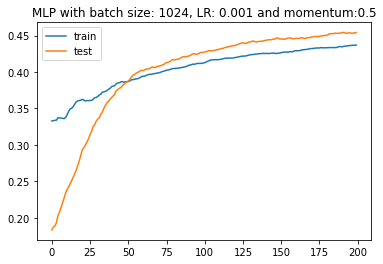

148/148 - 0s - loss: 1.1319 - accuracy: 0.2689 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1319 - accuracy: 0.2689 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1319 - accuracy: 0.2689 - 109ms/epoch - 739us/step
with batch size = 16839, LR= 0.001 and momentum=0.5
Test Accuracy: 0.269 


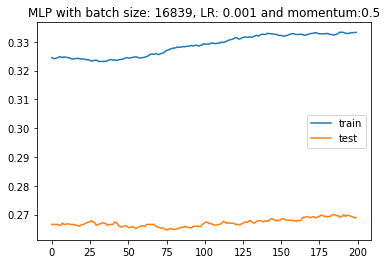

148/148 - 0s - loss: 0.5783 - accuracy: 0.7493 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5783 - accuracy: 0.7493 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5783 - accuracy: 0.7493 - 125ms/epoch - 844us/step
with batch size = 1, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.749 


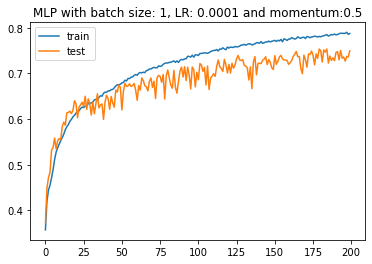

148/148 - 0s - loss: 0.9751 - accuracy: 0.5488 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9751 - accuracy: 0.5488 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9751 - accuracy: 0.5488 - 110ms/epoch - 741us/step
with batch size = 32, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.549 


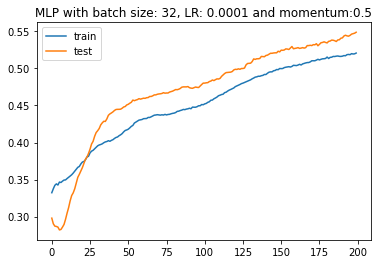

148/148 - 0s - loss: 1.0738 - accuracy: 0.4160 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0738 - accuracy: 0.4160 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0738 - accuracy: 0.4160 - 125ms/epoch - 844us/step
with batch size = 64, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.416 


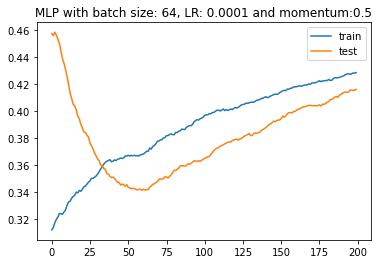

148/148 - 0s - loss: 1.0726 - accuracy: 0.4596 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0726 - accuracy: 0.4596 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0726 - accuracy: 0.4596 - 125ms/epoch - 845us/step
with batch size = 128, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.460 


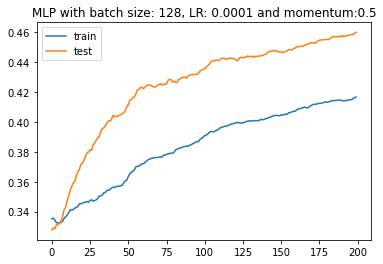

148/148 - 0s - loss: 1.0863 - accuracy: 0.4083 - 135ms/epoch - 915us/step
148/148 - 0s - loss: 1.0863 - accuracy: 0.4083 - 112ms/epoch - 757us/step
148/148 - 0s - loss: 1.0863 - accuracy: 0.4083 - 121ms/epoch - 815us/step
with batch size = 256, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.408 


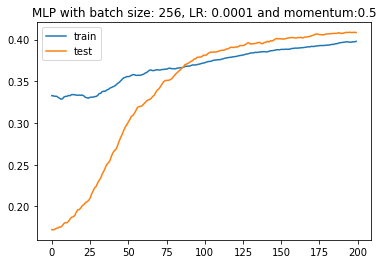

148/148 - 0s - loss: 1.1022 - accuracy: 0.3473 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1022 - accuracy: 0.3473 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1022 - accuracy: 0.3473 - 125ms/epoch - 844us/step
with batch size = 562, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.347 


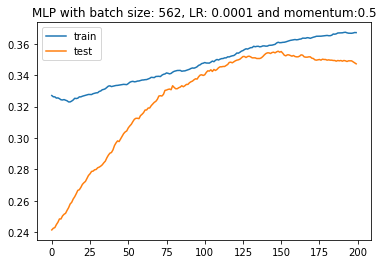

148/148 - 0s - loss: 1.0872 - accuracy: 0.3954 - 125ms/epoch - 848us/step
148/148 - 0s - loss: 1.0872 - accuracy: 0.3954 - 126ms/epoch - 854us/step
148/148 - 0s - loss: 1.0872 - accuracy: 0.3954 - 120ms/epoch - 812us/step
with batch size = 1024, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.395 


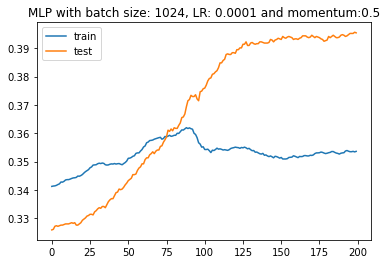

148/148 - 0s - loss: 1.1035 - accuracy: 0.3683 - 121ms/epoch - 818us/step
148/148 - 0s - loss: 1.1035 - accuracy: 0.3683 - 161ms/epoch - 1ms/step
148/148 - 0s - loss: 1.1035 - accuracy: 0.3683 - 123ms/epoch - 829us/step
with batch size = 16839, LR= 0.0001 and momentum=0.5
Test Accuracy: 0.368 


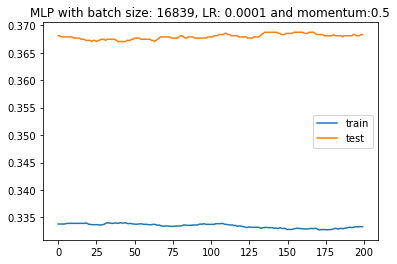

148/148 - 0s - loss: 1.1782 - accuracy: 0.3126 - 211ms/epoch - 1ms/step
148/148 - 0s - loss: 1.1782 - accuracy: 0.3126 - 110ms/epoch - 741us/step
148/148 - 0s - loss: 1.1782 - accuracy: 0.3126 - 119ms/epoch - 805us/step
with batch size = 1, LR= 1 and momentum=0.6
Test Accuracy: 0.313 


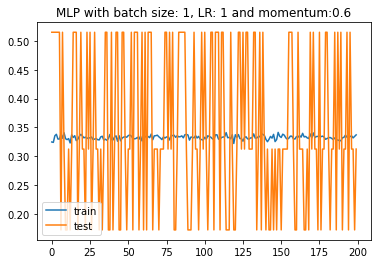

148/148 - 0s - loss: 1.0734 - accuracy: 0.5149 - 135ms/epoch - 909us/step
148/148 - 0s - loss: 1.0734 - accuracy: 0.5149 - 130ms/epoch - 877us/step
148/148 - 0s - loss: 1.0734 - accuracy: 0.5149 - 130ms/epoch - 882us/step
with batch size = 32, LR= 1 and momentum=0.6
Test Accuracy: 0.515 


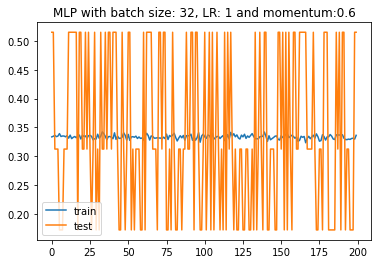

148/148 - 0s - loss: 1.0809 - accuracy: 0.5149 - 127ms/epoch - 860us/step
148/148 - 0s - loss: 1.0809 - accuracy: 0.5149 - 126ms/epoch - 851us/step
148/148 - 0s - loss: 1.0809 - accuracy: 0.5149 - 121ms/epoch - 815us/step
with batch size = 64, LR= 1 and momentum=0.6
Test Accuracy: 0.515 


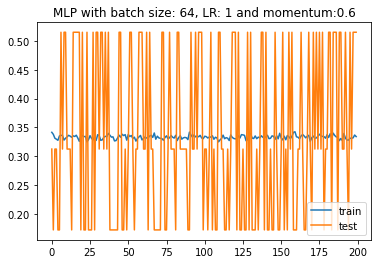

148/148 - 0s - loss: 1.0919 - accuracy: 0.5149 - 120ms/epoch - 814us/step
148/148 - 0s - loss: 1.0919 - accuracy: 0.5149 - 125ms/epoch - 848us/step
148/148 - 0s - loss: 1.0919 - accuracy: 0.5149 - 118ms/epoch - 800us/step
with batch size = 128, LR= 1 and momentum=0.6
Test Accuracy: 0.515 


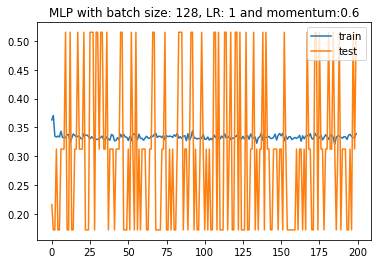

148/148 - 0s - loss: 1.1068 - accuracy: 0.3126 - 131ms/epoch - 882us/step
148/148 - 0s - loss: 1.1068 - accuracy: 0.3126 - 152ms/epoch - 1ms/step
148/148 - 0s - loss: 1.1068 - accuracy: 0.3126 - 140ms/epoch - 949us/step
with batch size = 256, LR= 1 and momentum=0.6
Test Accuracy: 0.313 


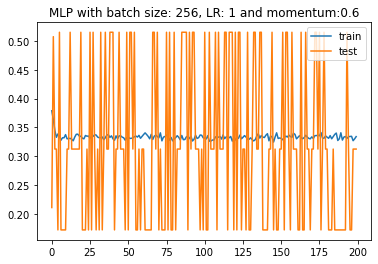

148/148 - 0s - loss: 1.1028 - accuracy: 0.1725 - 140ms/epoch - 949us/step
148/148 - 0s - loss: 1.1028 - accuracy: 0.1725 - 130ms/epoch - 881us/step
148/148 - 0s - loss: 1.1028 - accuracy: 0.1725 - 128ms/epoch - 862us/step
with batch size = 562, LR= 1 and momentum=0.6
Test Accuracy: 0.172 


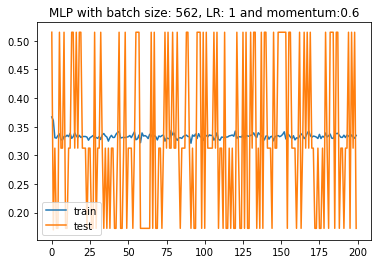

148/148 - 0s - loss: 1.0968 - accuracy: 0.5149 - 124ms/epoch - 836us/step
148/148 - 0s - loss: 1.0968 - accuracy: 0.5149 - 127ms/epoch - 857us/step
148/148 - 0s - loss: 1.0968 - accuracy: 0.5149 - 131ms/epoch - 882us/step
with batch size = 1024, LR= 1 and momentum=0.6
Test Accuracy: 0.515 


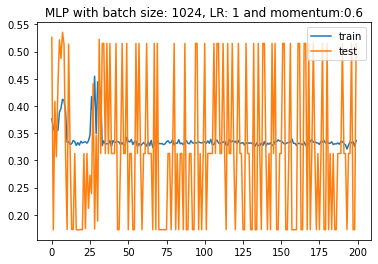

148/148 - 0s - loss: 1.1001 - accuracy: 0.1725 - 116ms/epoch - 787us/step
148/148 - 0s - loss: 1.1001 - accuracy: 0.1725 - 113ms/epoch - 764us/step
148/148 - 0s - loss: 1.1001 - accuracy: 0.1725 - 124ms/epoch - 841us/step
with batch size = 16839, LR= 1 and momentum=0.6
Test Accuracy: 0.172 


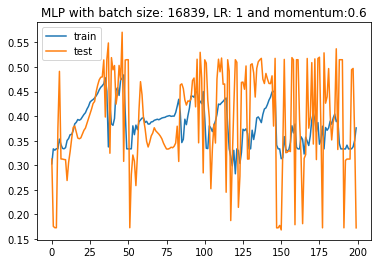

148/148 - 0s - loss: 1.1342 - accuracy: 0.1725 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 1.1342 - accuracy: 0.1725 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1342 - accuracy: 0.1725 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.1 and momentum=0.6
Test Accuracy: 0.172 


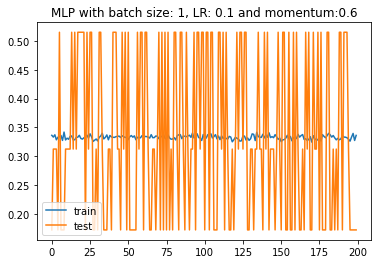

148/148 - 0s - loss: 0.5443 - accuracy: 0.7781 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5443 - accuracy: 0.7781 - 160ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5443 - accuracy: 0.7781 - 110ms/epoch - 740us/step
with batch size = 32, LR= 0.1 and momentum=0.6
Test Accuracy: 0.778 


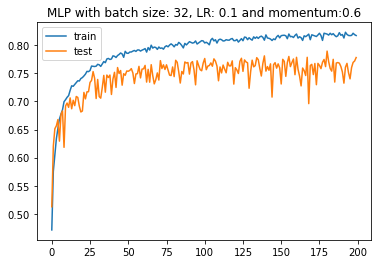

148/148 - 0s - loss: 0.5448 - accuracy: 0.7783 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5448 - accuracy: 0.7783 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5448 - accuracy: 0.7783 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.1 and momentum=0.6
Test Accuracy: 0.778 


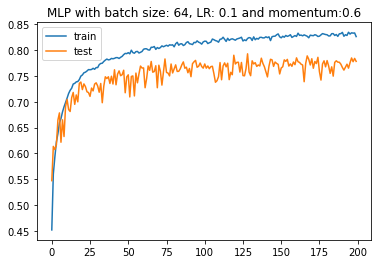

148/148 - 0s - loss: 0.5342 - accuracy: 0.7692 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5342 - accuracy: 0.7692 - 125ms/epoch - 846us/step
148/148 - 0s - loss: 0.5342 - accuracy: 0.7692 - 156ms/epoch - 1ms/step
with batch size = 128, LR= 0.1 and momentum=0.6
Test Accuracy: 0.769 


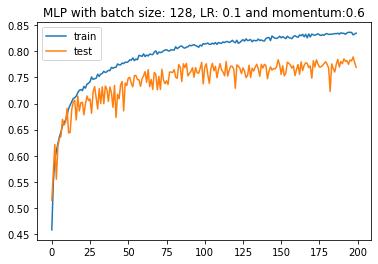

148/148 - 0s - loss: 0.5618 - accuracy: 0.7832 - 133ms/epoch - 898us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7832 - 112ms/epoch - 759us/step
148/148 - 0s - loss: 0.5618 - accuracy: 0.7832 - 107ms/epoch - 726us/step
with batch size = 256, LR= 0.1 and momentum=0.6
Test Accuracy: 0.783 


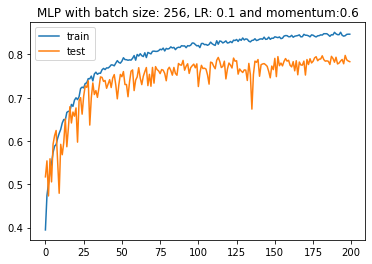

148/148 - 0s - loss: 0.5511 - accuracy: 0.7648 - 110ms/epoch - 745us/step
148/148 - 0s - loss: 0.5511 - accuracy: 0.7648 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5511 - accuracy: 0.7648 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.1 and momentum=0.6
Test Accuracy: 0.765 


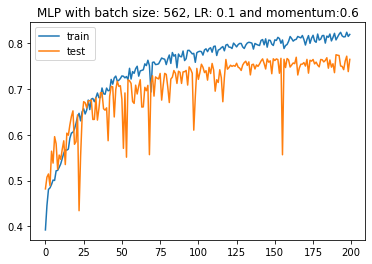

148/148 - 0s - loss: 0.5766 - accuracy: 0.7512 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5766 - accuracy: 0.7512 - 115ms/epoch - 779us/step
148/148 - 0s - loss: 0.5766 - accuracy: 0.7512 - 125ms/epoch - 847us/step
with batch size = 1024, LR= 0.1 and momentum=0.6
Test Accuracy: 0.751 


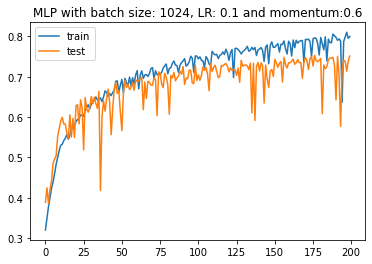

148/148 - 0s - loss: 1.0258 - accuracy: 0.4882 - 112ms/epoch - 760us/step
148/148 - 0s - loss: 1.0258 - accuracy: 0.4882 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 1.0258 - accuracy: 0.4882 - 128ms/epoch - 864us/step
with batch size = 16839, LR= 0.1 and momentum=0.6
Test Accuracy: 0.488 


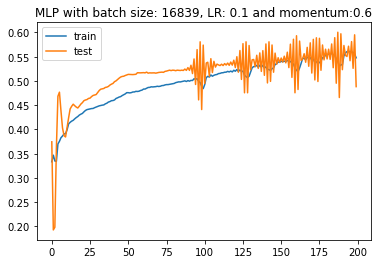

In [ ]:
diff_batchS=[1,32,64,128,256,562,1024,16839]
diff_lR=[1,0.1,0.01,0.001,0.0001]
momentum = [0.4,0.5,0.6]

for i in range(len(momentum)):
    for j in range(len(diff_lR)):
        for k in range(len(diff_batchS)):
            MLP().testLrGdMom(X_train_os, y_train_os,X_test, y_test, 200, diff_batchS[k],diff_lR[j],momentum[i])

148/148 - 1s - loss: 3.4862 - accuracy: 0.3166 - 1s/epoch - 8ms/step
148/148 - 0s - loss: 3.4862 - accuracy: 0.3166 - 130ms/epoch - 879us/step
148/148 - 0s - loss: 3.4862 - accuracy: 0.3166 - 121ms/epoch - 815us/step
with batch size = 1, LR= 1 and momentum=0.7
Test Accuracy: 0.317 


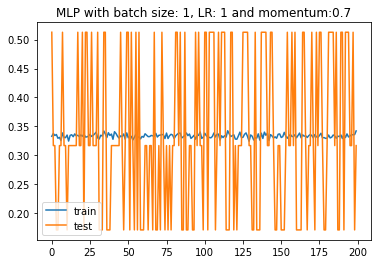

148/148 - 0s - loss: 1.0402 - accuracy: 0.5128 - 121ms/epoch - 820us/step
148/148 - 0s - loss: 1.0402 - accuracy: 0.5128 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0402 - accuracy: 0.5128 - 125ms/epoch - 845us/step
with batch size = 32, LR= 1 and momentum=0.7
Test Accuracy: 0.513 


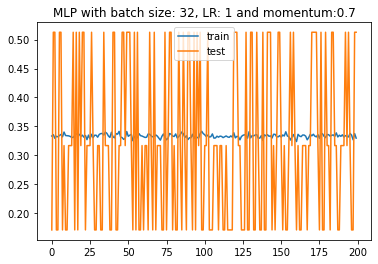

148/148 - 0s - loss: 1.0436 - accuracy: 0.5128 - 104ms/epoch - 703us/step
148/148 - 0s - loss: 1.0436 - accuracy: 0.5128 - 113ms/epoch - 766us/step
148/148 - 0s - loss: 1.0436 - accuracy: 0.5128 - 109ms/epoch - 734us/step
with batch size = 64, LR= 1 and momentum=0.7
Test Accuracy: 0.513 


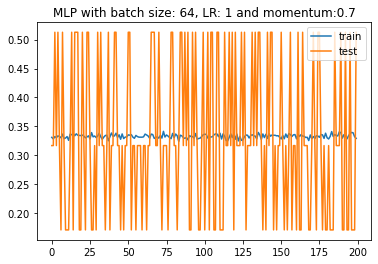

148/148 - 0s - loss: 1.1110 - accuracy: 0.1706 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1110 - accuracy: 0.1706 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1110 - accuracy: 0.1706 - 109ms/epoch - 739us/step
with batch size = 128, LR= 1 and momentum=0.7
Test Accuracy: 0.171 


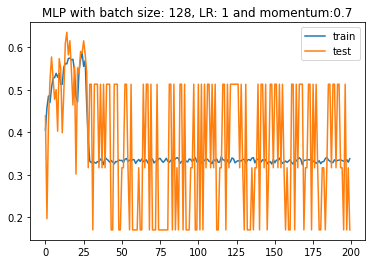

148/148 - 0s - loss: 1.1365 - accuracy: 0.1706 - 121ms/epoch - 820us/step
148/148 - 0s - loss: 1.1365 - accuracy: 0.1706 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1365 - accuracy: 0.1706 - 109ms/epoch - 739us/step
with batch size = 256, LR= 1 and momentum=0.7
Test Accuracy: 0.171 


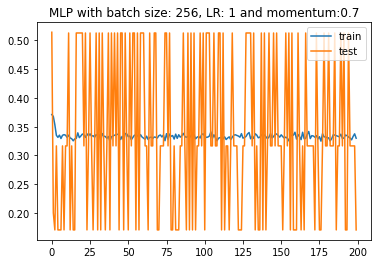

148/148 - 0s - loss: 0.5809 - accuracy: 0.7493 - 98ms/epoch - 662us/step
148/148 - 0s - loss: 0.5809 - accuracy: 0.7493 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5809 - accuracy: 0.7493 - 94ms/epoch - 633us/step
with batch size = 562, LR= 1 and momentum=0.7
Test Accuracy: 0.749 


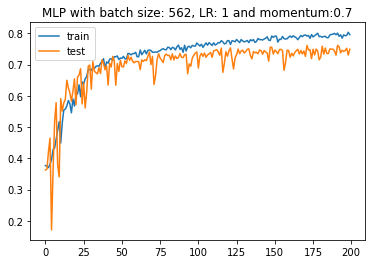

148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 115ms/epoch - 774us/step
148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 104ms/epoch - 703us/step
with batch size = 1024, LR= 1 and momentum=0.7
Test Accuracy: 0.513 


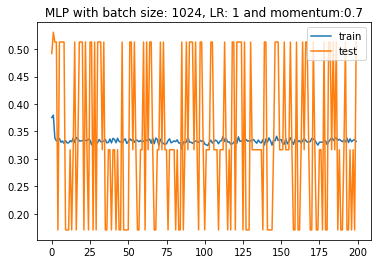

148/148 - 0s - loss: 1.0986 - accuracy: 0.5132 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 1.0986 - accuracy: 0.5132 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0986 - accuracy: 0.5132 - 122ms/epoch - 822us/step
with batch size = 16839, LR= 1 and momentum=0.7
Test Accuracy: 0.513 


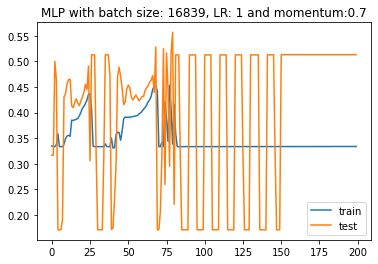

148/148 - 0s - loss: 1.1579 - accuracy: 0.3166 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 1.1579 - accuracy: 0.3166 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1579 - accuracy: 0.3166 - 125ms/epoch - 844us/step
with batch size = 1, LR= 0.1 and momentum=0.7
Test Accuracy: 0.317 


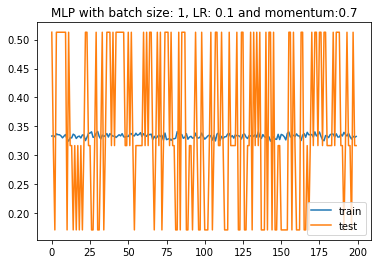

148/148 - 0s - loss: 0.5970 - accuracy: 0.7531 - 111ms/epoch - 751us/step
148/148 - 0s - loss: 0.5970 - accuracy: 0.7531 - 112ms/epoch - 758us/step
148/148 - 0s - loss: 0.5970 - accuracy: 0.7531 - 100ms/epoch - 676us/step
with batch size = 32, LR= 0.1 and momentum=0.7
Test Accuracy: 0.753 


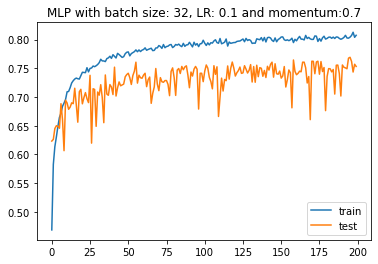

148/148 - 0s - loss: 0.5943 - accuracy: 0.7705 - 112ms/epoch - 760us/step
148/148 - 0s - loss: 0.5943 - accuracy: 0.7705 - 101ms/epoch - 685us/step
148/148 - 0s - loss: 0.5943 - accuracy: 0.7705 - 117ms/epoch - 790us/step
with batch size = 64, LR= 0.1 and momentum=0.7
Test Accuracy: 0.771 


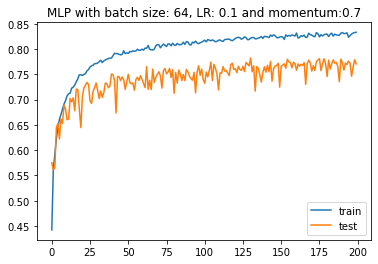

148/148 - 0s - loss: 0.5923 - accuracy: 0.7557 - 151ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5923 - accuracy: 0.7557 - 113ms/epoch - 761us/step
148/148 - 0s - loss: 0.5923 - accuracy: 0.7557 - 110ms/epoch - 745us/step
with batch size = 128, LR= 0.1 and momentum=0.7
Test Accuracy: 0.756 


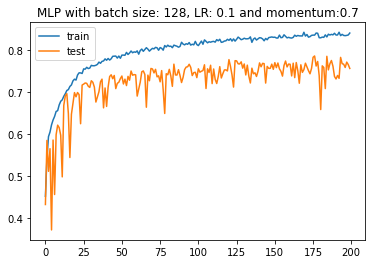

148/148 - 0s - loss: 0.5269 - accuracy: 0.7800 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5269 - accuracy: 0.7800 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5269 - accuracy: 0.7800 - 109ms/epoch - 738us/step
with batch size = 256, LR= 0.1 and momentum=0.7
Test Accuracy: 0.780 


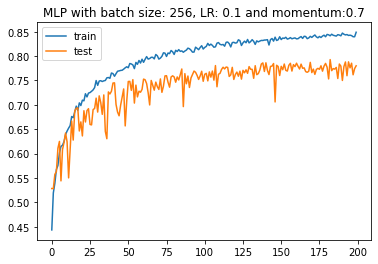

148/148 - 0s - loss: 0.5345 - accuracy: 0.7745 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5345 - accuracy: 0.7745 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5345 - accuracy: 0.7745 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.1 and momentum=0.7
Test Accuracy: 0.775 


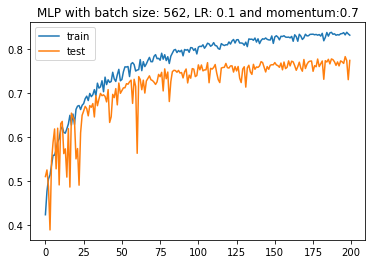

148/148 - 0s - loss: 0.5719 - accuracy: 0.7591 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5719 - accuracy: 0.7591 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5719 - accuracy: 0.7591 - 109ms/epoch - 739us/step
with batch size = 1024, LR= 0.1 and momentum=0.7
Test Accuracy: 0.759 


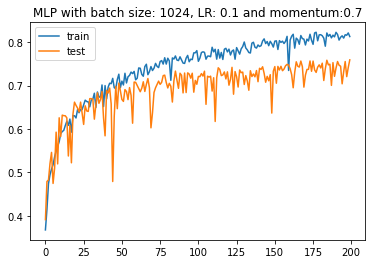

148/148 - 0s - loss: 1.0586 - accuracy: 0.4673 - 120ms/epoch - 809us/step
148/148 - 0s - loss: 1.0586 - accuracy: 0.4673 - 116ms/epoch - 785us/step
148/148 - 0s - loss: 1.0586 - accuracy: 0.4673 - 116ms/epoch - 786us/step
with batch size = 16839, LR= 0.1 and momentum=0.7
Test Accuracy: 0.467 


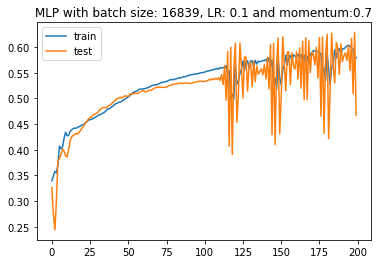

148/148 - 0s - loss: 1.0420 - accuracy: 0.5128 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 1.0420 - accuracy: 0.5128 - 110ms/epoch - 740us/step
148/148 - 0s - loss: 1.0420 - accuracy: 0.5128 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.01 and momentum=0.7
Test Accuracy: 0.513 


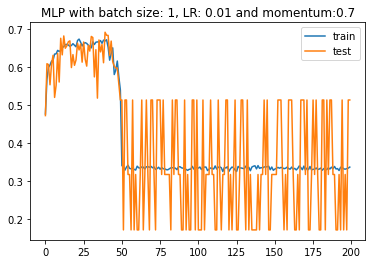

148/148 - 0s - loss: 0.5496 - accuracy: 0.7826 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5496 - accuracy: 0.7826 - 94ms/epoch - 636us/step
148/148 - 0s - loss: 0.5496 - accuracy: 0.7826 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.01 and momentum=0.7
Test Accuracy: 0.783 


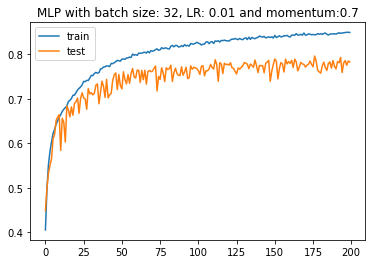

148/148 - 0s - loss: 0.5171 - accuracy: 0.7841 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5171 - accuracy: 0.7841 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5171 - accuracy: 0.7841 - 125ms/epoch - 844us/step
with batch size = 64, LR= 0.01 and momentum=0.7
Test Accuracy: 0.784 


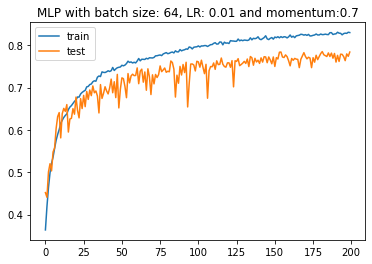

148/148 - 0s - loss: 0.6043 - accuracy: 0.7491 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6043 - accuracy: 0.7491 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6043 - accuracy: 0.7491 - 125ms/epoch - 846us/step
with batch size = 128, LR= 0.01 and momentum=0.7
Test Accuracy: 0.749 


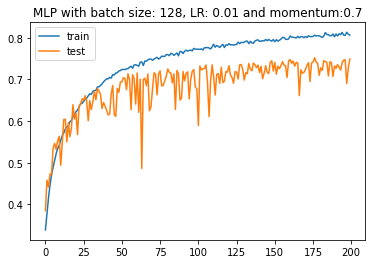

148/148 - 0s - loss: 0.5939 - accuracy: 0.7362 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5939 - accuracy: 0.7362 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5939 - accuracy: 0.7362 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.01 and momentum=0.7
Test Accuracy: 0.736 


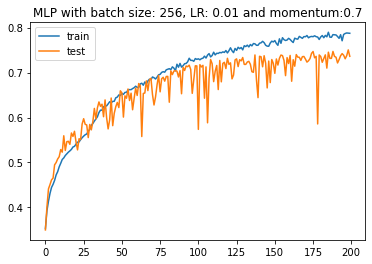

148/148 - 0s - loss: 0.7094 - accuracy: 0.6802 - 113ms/epoch - 766us/step
148/148 - 0s - loss: 0.7094 - accuracy: 0.6802 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7094 - accuracy: 0.6802 - 141ms/epoch - 950us/step
with batch size = 562, LR= 0.01 and momentum=0.7
Test Accuracy: 0.680 


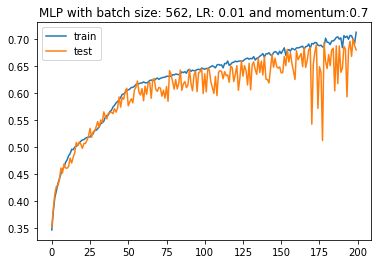

148/148 - 0s - loss: 0.8075 - accuracy: 0.6251 - 124ms/epoch - 840us/step
148/148 - 0s - loss: 0.8075 - accuracy: 0.6251 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.8075 - accuracy: 0.6251 - 124ms/epoch - 841us/step
with batch size = 1024, LR= 0.01 and momentum=0.7
Test Accuracy: 0.625 


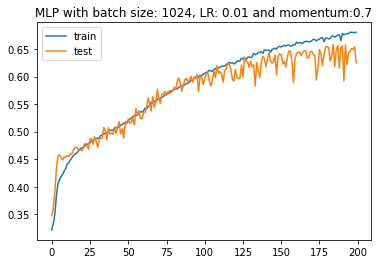

148/148 - 0s - loss: 1.0508 - accuracy: 0.4755 - 134ms/epoch - 904us/step
148/148 - 0s - loss: 1.0508 - accuracy: 0.4755 - 126ms/epoch - 850us/step
148/148 - 0s - loss: 1.0508 - accuracy: 0.4755 - 109ms/epoch - 739us/step
with batch size = 16839, LR= 0.01 and momentum=0.7
Test Accuracy: 0.476 


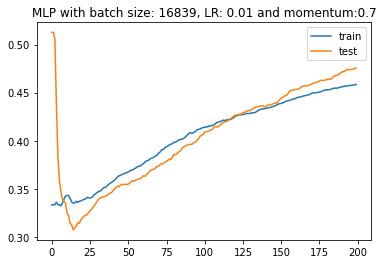

148/148 - 0s - loss: 0.5796 - accuracy: 0.7718 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5796 - accuracy: 0.7718 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5796 - accuracy: 0.7718 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.001 and momentum=0.7
Test Accuracy: 0.772 


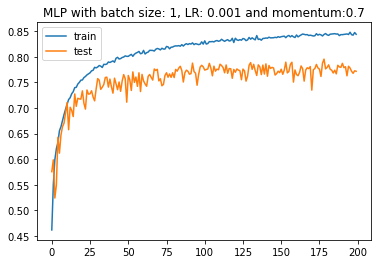

148/148 - 0s - loss: 0.6341 - accuracy: 0.7129 - 122ms/epoch - 828us/step
148/148 - 0s - loss: 0.6341 - accuracy: 0.7129 - 118ms/epoch - 796us/step
148/148 - 0s - loss: 0.6341 - accuracy: 0.7129 - 111ms/epoch - 750us/step
with batch size = 32, LR= 0.001 and momentum=0.7
Test Accuracy: 0.713 


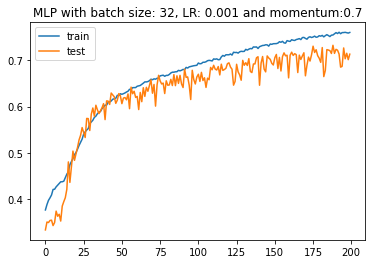

148/148 - 0s - loss: 0.6966 - accuracy: 0.6832 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6966 - accuracy: 0.6832 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6966 - accuracy: 0.6832 - 109ms/epoch - 738us/step
with batch size = 64, LR= 0.001 and momentum=0.7
Test Accuracy: 0.683 


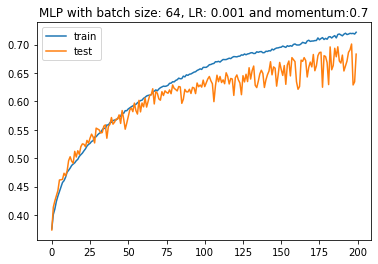

148/148 - 0s - loss: 0.8040 - accuracy: 0.6376 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8040 - accuracy: 0.6376 - 111ms/epoch - 750us/step
148/148 - 0s - loss: 0.8040 - accuracy: 0.6376 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.001 and momentum=0.7
Test Accuracy: 0.638 


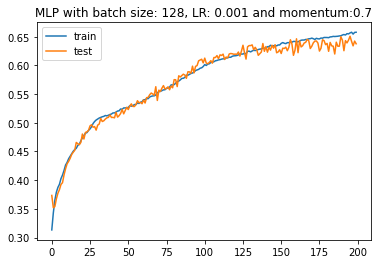

148/148 - 0s - loss: 0.8984 - accuracy: 0.5641 - 129ms/epoch - 874us/step
148/148 - 0s - loss: 0.8984 - accuracy: 0.5641 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8984 - accuracy: 0.5641 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.001 and momentum=0.7
Test Accuracy: 0.564 


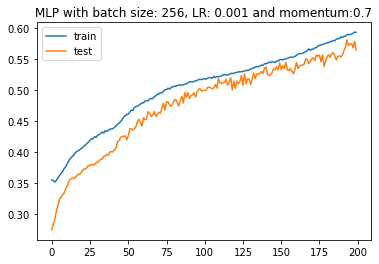

148/148 - 0s - loss: 1.0128 - accuracy: 0.5035 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0128 - accuracy: 0.5035 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0128 - accuracy: 0.5035 - 112ms/epoch - 758us/step
with batch size = 562, LR= 0.001 and momentum=0.7
Test Accuracy: 0.503 


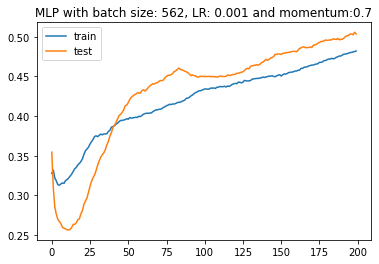

148/148 - 0s - loss: 1.0100 - accuracy: 0.5005 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0100 - accuracy: 0.5005 - 117ms/epoch - 789us/step
148/148 - 0s - loss: 1.0100 - accuracy: 0.5005 - 141ms/epoch - 950us/step
with batch size = 1024, LR= 0.001 and momentum=0.7
Test Accuracy: 0.501 


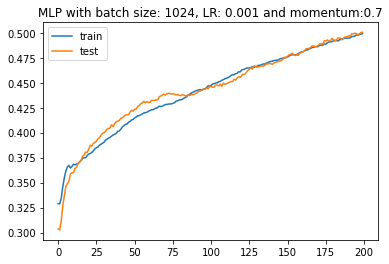

148/148 - 0s - loss: 1.0931 - accuracy: 0.3511 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0931 - accuracy: 0.3511 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0931 - accuracy: 0.3511 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.001 and momentum=0.7
Test Accuracy: 0.351 


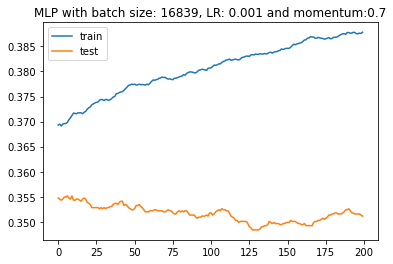

148/148 - 0s - loss: 0.5481 - accuracy: 0.7707 - 234ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5481 - accuracy: 0.7707 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5481 - accuracy: 0.7707 - 125ms/epoch - 844us/step
with batch size = 1, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.771 


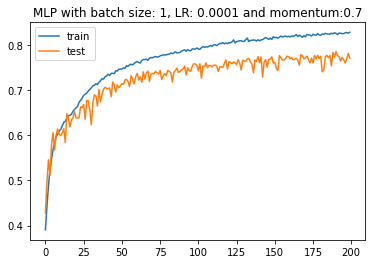

148/148 - 0s - loss: 0.9547 - accuracy: 0.5370 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9547 - accuracy: 0.5370 - 137ms/epoch - 925us/step
148/148 - 0s - loss: 0.9547 - accuracy: 0.5370 - 125ms/epoch - 844us/step
with batch size = 32, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.537 


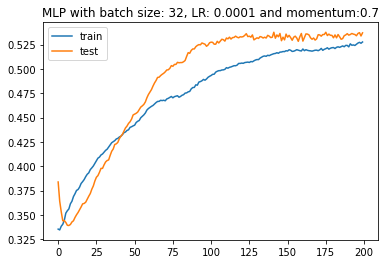

148/148 - 0s - loss: 1.0503 - accuracy: 0.4764 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0503 - accuracy: 0.4764 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0503 - accuracy: 0.4764 - 141ms/epoch - 950us/step
with batch size = 64, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.476 


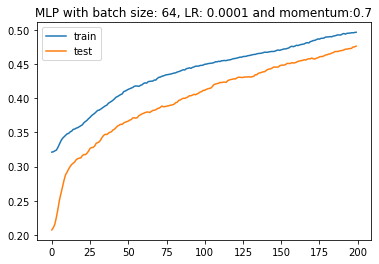

148/148 - 0s - loss: 1.0727 - accuracy: 0.4050 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0727 - accuracy: 0.4050 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0727 - accuracy: 0.4050 - 141ms/epoch - 950us/step
with batch size = 128, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.405 


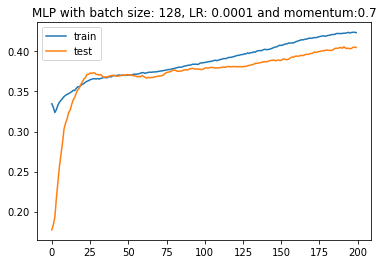

148/148 - 0s - loss: 1.0878 - accuracy: 0.3804 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0878 - accuracy: 0.3804 - 110ms/epoch - 741us/step
148/148 - 0s - loss: 1.0878 - accuracy: 0.3804 - 110ms/epoch - 742us/step
with batch size = 256, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.380 


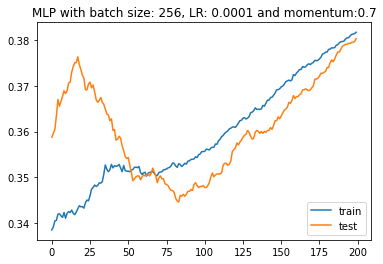

148/148 - 0s - loss: 1.1010 - accuracy: 0.3234 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1010 - accuracy: 0.3234 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1010 - accuracy: 0.3234 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.323 


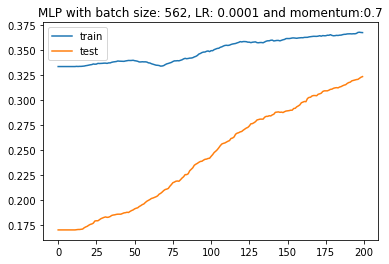

148/148 - 0s - loss: 1.1041 - accuracy: 0.3282 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1041 - accuracy: 0.3282 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1041 - accuracy: 0.3282 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.328 


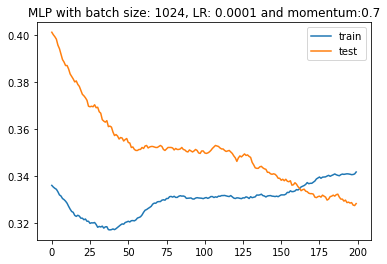

148/148 - 0s - loss: 1.1287 - accuracy: 0.3545 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.1287 - accuracy: 0.3545 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.1287 - accuracy: 0.3545 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.0001 and momentum=0.7
Test Accuracy: 0.355 


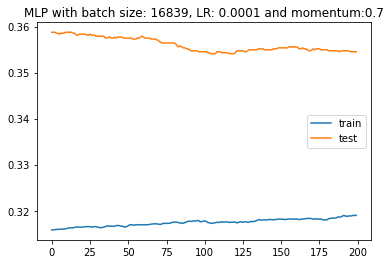

148/148 - 0s - loss: 1.0372 - accuracy: 0.3166 - 227ms/epoch - 2ms/step
148/148 - 0s - loss: 1.0372 - accuracy: 0.3166 - 112ms/epoch - 755us/step
148/148 - 0s - loss: 1.0372 - accuracy: 0.3166 - 121ms/epoch - 816us/step
with batch size = 1, LR= 1 and momentum=0.8
Test Accuracy: 0.317 


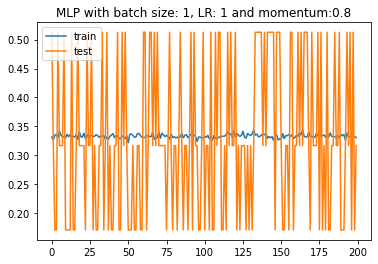

148/148 - 0s - loss: 1.2710 - accuracy: 0.1706 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.2710 - accuracy: 0.1706 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.2710 - accuracy: 0.1706 - 117ms/epoch - 789us/step
with batch size = 32, LR= 1 and momentum=0.8
Test Accuracy: 0.171 


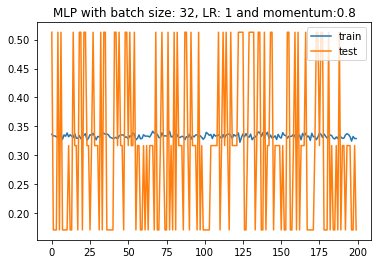

148/148 - 0s - loss: 1.0374 - accuracy: 0.5128 - 114ms/epoch - 771us/step
148/148 - 0s - loss: 1.0374 - accuracy: 0.5128 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0374 - accuracy: 0.5128 - 109ms/epoch - 739us/step
with batch size = 64, LR= 1 and momentum=0.8
Test Accuracy: 0.513 


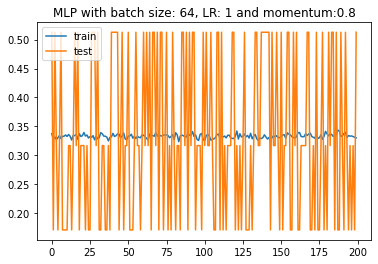

148/148 - 0s - loss: 1.1212 - accuracy: 0.1706 - 122ms/epoch - 824us/step
148/148 - 0s - loss: 1.1212 - accuracy: 0.1706 - 111ms/epoch - 747us/step
148/148 - 0s - loss: 1.1212 - accuracy: 0.1706 - 100ms/epoch - 679us/step
with batch size = 128, LR= 1 and momentum=0.8
Test Accuracy: 0.171 


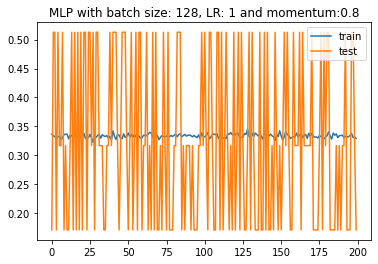

148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 108ms/epoch - 733us/step
148/148 - 0s - loss: 1.0870 - accuracy: 0.5128 - 110ms/epoch - 741us/step
with batch size = 256, LR= 1 and momentum=0.8
Test Accuracy: 0.513 


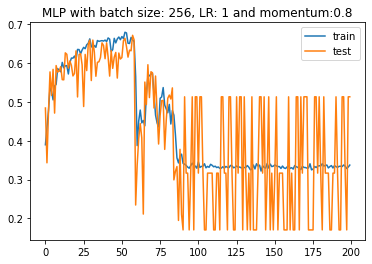

148/148 - 0s - loss: 1.0944 - accuracy: 0.5128 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 1.0944 - accuracy: 0.5128 - 107ms/epoch - 721us/step
148/148 - 0s - loss: 1.0944 - accuracy: 0.5128 - 100ms/epoch - 679us/step
with batch size = 562, LR= 1 and momentum=0.8
Test Accuracy: 0.513 


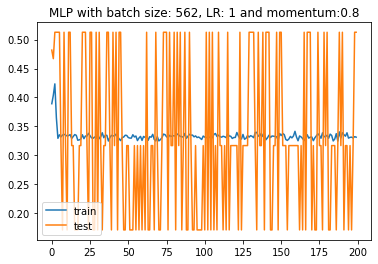

148/148 - 0s - loss: 1.1060 - accuracy: 0.1708 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 1.1060 - accuracy: 0.1708 - 117ms/epoch - 790us/step
148/148 - 0s - loss: 1.1060 - accuracy: 0.1708 - 111ms/epoch - 748us/step
with batch size = 1024, LR= 1 and momentum=0.8
Test Accuracy: 0.171 


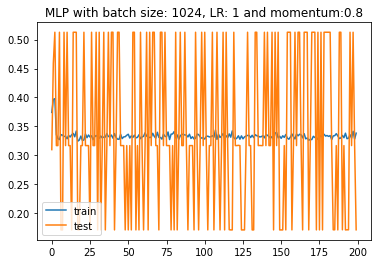

148/148 - 0s - loss: 1.0947 - accuracy: 0.4658 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0947 - accuracy: 0.4658 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0947 - accuracy: 0.4658 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 1 and momentum=0.8
Test Accuracy: 0.466 


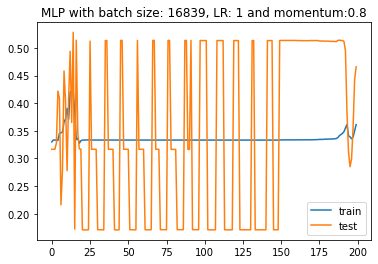

148/148 - 0s - loss: 1.0995 - accuracy: 0.5128 - 232ms/epoch - 2ms/step
148/148 - 0s - loss: 1.0995 - accuracy: 0.5128 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 1.0995 - accuracy: 0.5128 - 116ms/epoch - 783us/step
with batch size = 1, LR= 0.1 and momentum=0.8
Test Accuracy: 0.513 


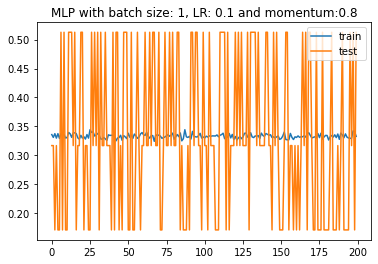

148/148 - 0s - loss: 0.6884 - accuracy: 0.7264 - 115ms/epoch - 778us/step
148/148 - 0s - loss: 0.6884 - accuracy: 0.7264 - 124ms/epoch - 836us/step
148/148 - 0s - loss: 0.6884 - accuracy: 0.7264 - 111ms/epoch - 748us/step
with batch size = 32, LR= 0.1 and momentum=0.8
Test Accuracy: 0.726 


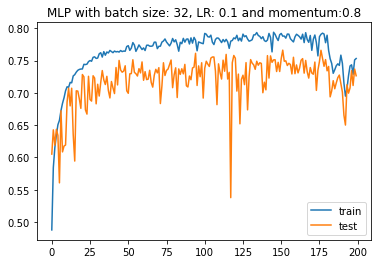

148/148 - 0s - loss: 0.5746 - accuracy: 0.7775 - 113ms/epoch - 767us/step
148/148 - 0s - loss: 0.5746 - accuracy: 0.7775 - 111ms/epoch - 750us/step
148/148 - 0s - loss: 0.5746 - accuracy: 0.7775 - 121ms/epoch - 817us/step
with batch size = 64, LR= 0.1 and momentum=0.8
Test Accuracy: 0.777 


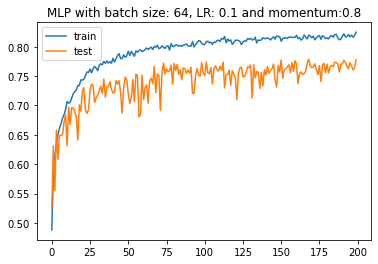

148/148 - 0s - loss: 0.5749 - accuracy: 0.7741 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5749 - accuracy: 0.7741 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5749 - accuracy: 0.7741 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.1 and momentum=0.8
Test Accuracy: 0.774 


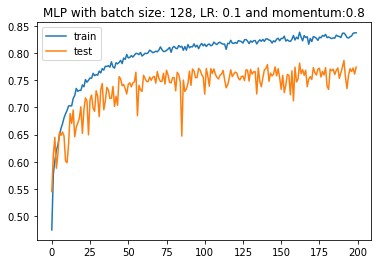

148/148 - 0s - loss: 0.5086 - accuracy: 0.7944 - 125ms/epoch - 847us/step
148/148 - 0s - loss: 0.5086 - accuracy: 0.7944 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5086 - accuracy: 0.7944 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.1 and momentum=0.8
Test Accuracy: 0.794 


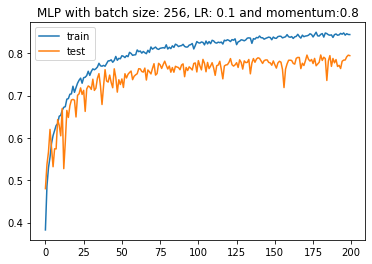

148/148 - 0s - loss: 0.5308 - accuracy: 0.7868 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5308 - accuracy: 0.7868 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5308 - accuracy: 0.7868 - 125ms/epoch - 844us/step
with batch size = 562, LR= 0.1 and momentum=0.8
Test Accuracy: 0.787 


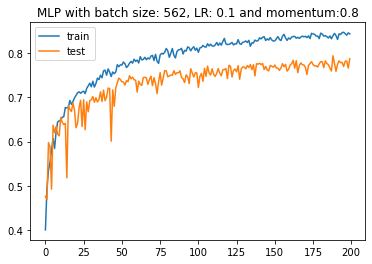

148/148 - 0s - loss: 0.5493 - accuracy: 0.7783 - 126ms/epoch - 848us/step
148/148 - 0s - loss: 0.5493 - accuracy: 0.7783 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5493 - accuracy: 0.7783 - 125ms/epoch - 847us/step
with batch size = 1024, LR= 0.1 and momentum=0.8
Test Accuracy: 0.778 


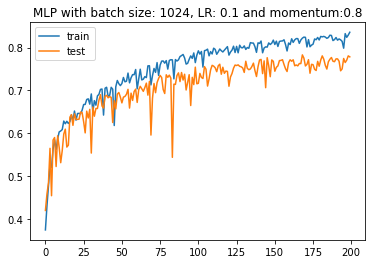

148/148 - 0s - loss: 1.2044 - accuracy: 0.4219 - 133ms/epoch - 897us/step
148/148 - 0s - loss: 1.2044 - accuracy: 0.4219 - 107ms/epoch - 721us/step
148/148 - 0s - loss: 1.2044 - accuracy: 0.4219 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.1 and momentum=0.8
Test Accuracy: 0.422 


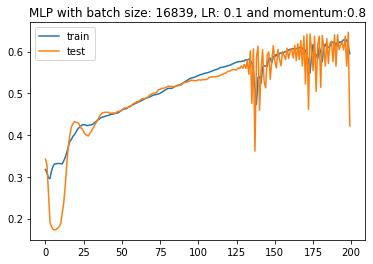

148/148 - 0s - loss: 1.1430 - accuracy: 0.1706 - 293ms/epoch - 2ms/step
148/148 - 0s - loss: 1.1430 - accuracy: 0.1706 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 1.1430 - accuracy: 0.1706 - 111ms/epoch - 751us/step
with batch size = 1, LR= 0.01 and momentum=0.8
Test Accuracy: 0.171 


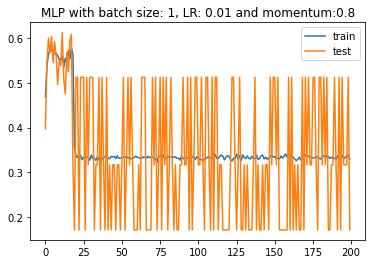

148/148 - 0s - loss: 0.5750 - accuracy: 0.7760 - 142ms/epoch - 957us/step
148/148 - 0s - loss: 0.5750 - accuracy: 0.7760 - 111ms/epoch - 748us/step
148/148 - 0s - loss: 0.5750 - accuracy: 0.7760 - 112ms/epoch - 758us/step
with batch size = 32, LR= 0.01 and momentum=0.8
Test Accuracy: 0.776 


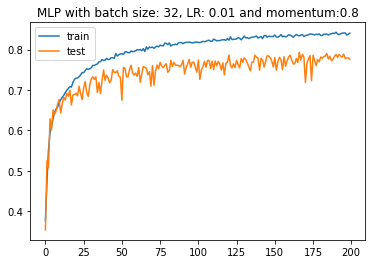

148/148 - 0s - loss: 0.5652 - accuracy: 0.7608 - 171ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5652 - accuracy: 0.7608 - 114ms/epoch - 769us/step
148/148 - 0s - loss: 0.5652 - accuracy: 0.7608 - 117ms/epoch - 788us/step
with batch size = 64, LR= 0.01 and momentum=0.8
Test Accuracy: 0.761 


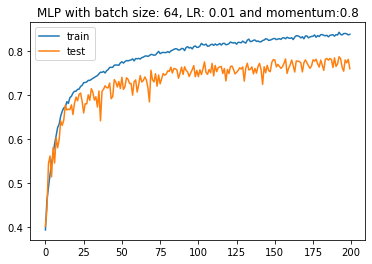

148/148 - 0s - loss: 0.6244 - accuracy: 0.7241 - 122ms/epoch - 823us/step
148/148 - 0s - loss: 0.6244 - accuracy: 0.7241 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 0.6244 - accuracy: 0.7241 - 121ms/epoch - 816us/step
with batch size = 128, LR= 0.01 and momentum=0.8
Test Accuracy: 0.724 


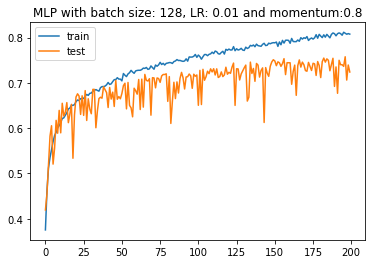

148/148 - 0s - loss: 0.6313 - accuracy: 0.7264 - 132ms/epoch - 892us/step
148/148 - 0s - loss: 0.6313 - accuracy: 0.7264 - 123ms/epoch - 828us/step
148/148 - 0s - loss: 0.6313 - accuracy: 0.7264 - 124ms/epoch - 838us/step
with batch size = 256, LR= 0.01 and momentum=0.8
Test Accuracy: 0.726 


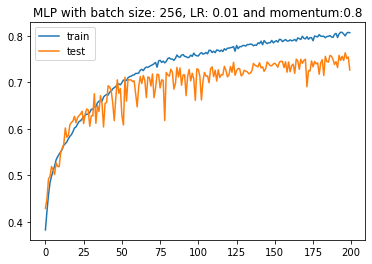

148/148 - 0s - loss: 0.6497 - accuracy: 0.7010 - 133ms/epoch - 898us/step
148/148 - 0s - loss: 0.6497 - accuracy: 0.7010 - 129ms/epoch - 869us/step
148/148 - 0s - loss: 0.6497 - accuracy: 0.7010 - 131ms/epoch - 885us/step
with batch size = 562, LR= 0.01 and momentum=0.8
Test Accuracy: 0.701 


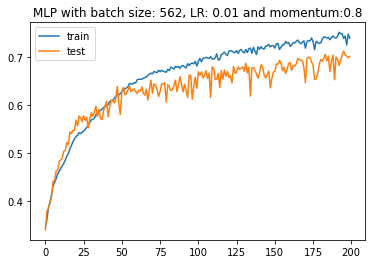

148/148 - 0s - loss: 0.7385 - accuracy: 0.6609 - 120ms/epoch - 813us/step
148/148 - 0s - loss: 0.7385 - accuracy: 0.6609 - 130ms/epoch - 881us/step
148/148 - 0s - loss: 0.7385 - accuracy: 0.6609 - 134ms/epoch - 905us/step
with batch size = 1024, LR= 0.01 and momentum=0.8
Test Accuracy: 0.661 


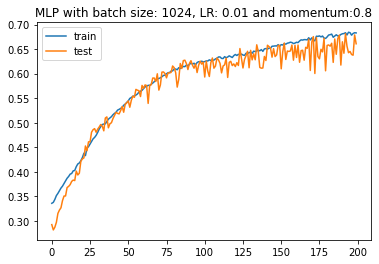

148/148 - 0s - loss: 1.0765 - accuracy: 0.4200 - 116ms/epoch - 784us/step
148/148 - 0s - loss: 1.0765 - accuracy: 0.4200 - 111ms/epoch - 747us/step
148/148 - 0s - loss: 1.0765 - accuracy: 0.4200 - 111ms/epoch - 750us/step
with batch size = 16839, LR= 0.01 and momentum=0.8
Test Accuracy: 0.420 


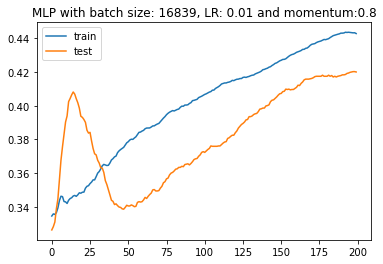

148/148 - 0s - loss: 0.5423 - accuracy: 0.7803 - 391ms/epoch - 3ms/step
148/148 - 0s - loss: 0.5423 - accuracy: 0.7803 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5423 - accuracy: 0.7803 - 123ms/epoch - 829us/step
with batch size = 1, LR= 0.001 and momentum=0.8
Test Accuracy: 0.780 


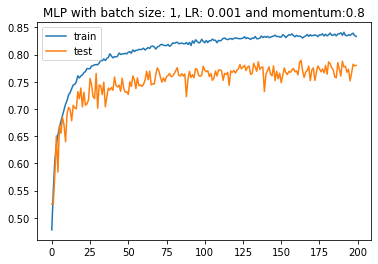

148/148 - 0s - loss: 0.6123 - accuracy: 0.7300 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6123 - accuracy: 0.7300 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 0.6123 - accuracy: 0.7300 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.001 and momentum=0.8
Test Accuracy: 0.730 


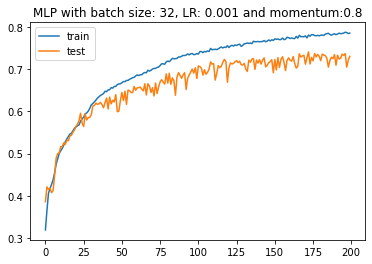

148/148 - 0s - loss: 0.6369 - accuracy: 0.7165 - 129ms/epoch - 874us/step
148/148 - 0s - loss: 0.6369 - accuracy: 0.7165 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6369 - accuracy: 0.7165 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.001 and momentum=0.8
Test Accuracy: 0.716 


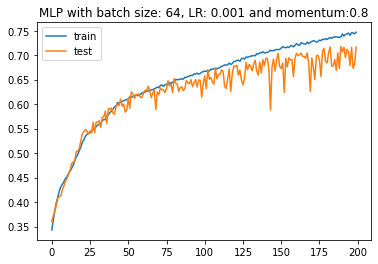

148/148 - 0s - loss: 0.7351 - accuracy: 0.6614 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.7351 - accuracy: 0.6614 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7351 - accuracy: 0.6614 - 125ms/epoch - 845us/step
with batch size = 128, LR= 0.001 and momentum=0.8
Test Accuracy: 0.661 


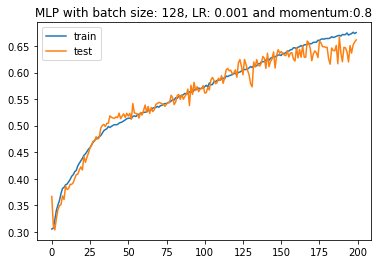

148/148 - 0s - loss: 0.8833 - accuracy: 0.6025 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8833 - accuracy: 0.6025 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8833 - accuracy: 0.6025 - 125ms/epoch - 844us/step
with batch size = 256, LR= 0.001 and momentum=0.8
Test Accuracy: 0.602 


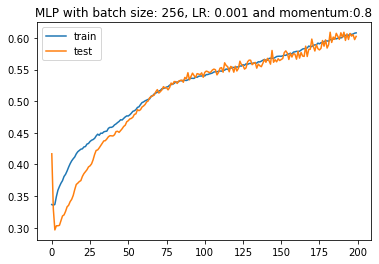

148/148 - 0s - loss: 0.9800 - accuracy: 0.5257 - 111ms/epoch - 747us/step
148/148 - 0s - loss: 0.9800 - accuracy: 0.5257 - 111ms/epoch - 752us/step
148/148 - 0s - loss: 0.9800 - accuracy: 0.5257 - 110ms/epoch - 746us/step
with batch size = 562, LR= 0.001 and momentum=0.8
Test Accuracy: 0.526 


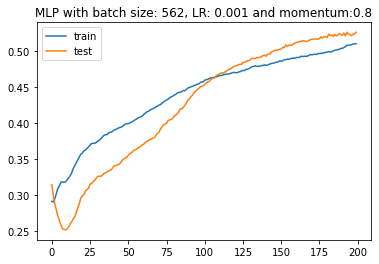

148/148 - 0s - loss: 0.9696 - accuracy: 0.5349 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9696 - accuracy: 0.5349 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9696 - accuracy: 0.5349 - 112ms/epoch - 758us/step
with batch size = 1024, LR= 0.001 and momentum=0.8
Test Accuracy: 0.535 


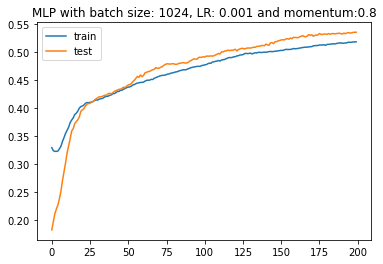

148/148 - 0s - loss: 1.1082 - accuracy: 0.3304 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1082 - accuracy: 0.3304 - 125ms/epoch - 848us/step
148/148 - 0s - loss: 1.1082 - accuracy: 0.3304 - 125ms/epoch - 844us/step
with batch size = 16839, LR= 0.001 and momentum=0.8
Test Accuracy: 0.330 


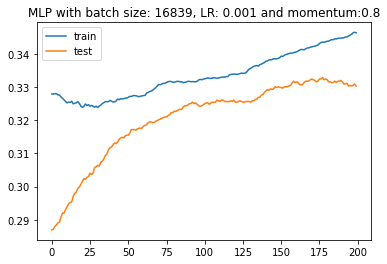

148/148 - 0s - loss: 0.5438 - accuracy: 0.7722 - 250ms/epoch - 2ms/step
148/148 - 0s - loss: 0.5438 - accuracy: 0.7722 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5438 - accuracy: 0.7722 - 125ms/epoch - 845us/step
with batch size = 1, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.772 


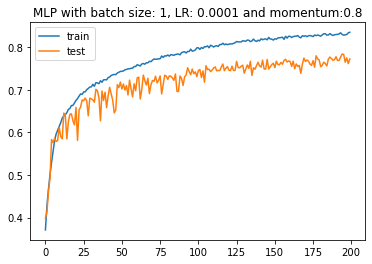

148/148 - 0s - loss: 0.8898 - accuracy: 0.5798 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8898 - accuracy: 0.5798 - 110ms/epoch - 740us/step
148/148 - 0s - loss: 0.8898 - accuracy: 0.5798 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.580 


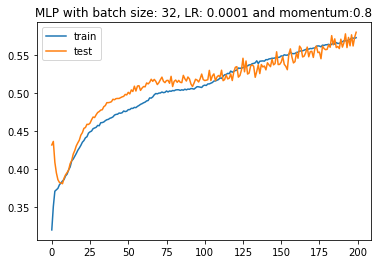

148/148 - 0s - loss: 1.0132 - accuracy: 0.5224 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0132 - accuracy: 0.5224 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 1.0132 - accuracy: 0.5224 - 125ms/epoch - 844us/step
with batch size = 64, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.522 


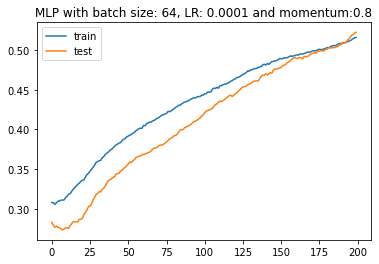

148/148 - 0s - loss: 1.0547 - accuracy: 0.4715 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0547 - accuracy: 0.4715 - 125ms/epoch - 848us/step
148/148 - 0s - loss: 1.0547 - accuracy: 0.4715 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.471 


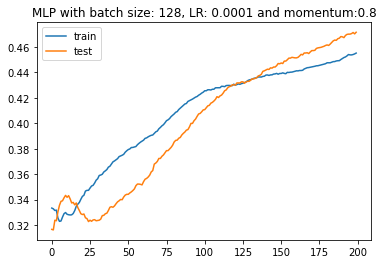

148/148 - 0s - loss: 1.0913 - accuracy: 0.3952 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0913 - accuracy: 0.3952 - 119ms/epoch - 805us/step
148/148 - 0s - loss: 1.0913 - accuracy: 0.3952 - 125ms/epoch - 844us/step
with batch size = 256, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.395 


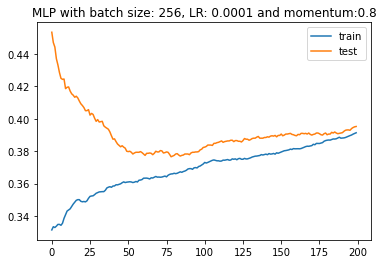

148/148 - 0s - loss: 1.0966 - accuracy: 0.3499 - 131ms/epoch - 883us/step
148/148 - 0s - loss: 1.0966 - accuracy: 0.3499 - 124ms/epoch - 840us/step
148/148 - 0s - loss: 1.0966 - accuracy: 0.3499 - 114ms/epoch - 771us/step
with batch size = 562, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.350 


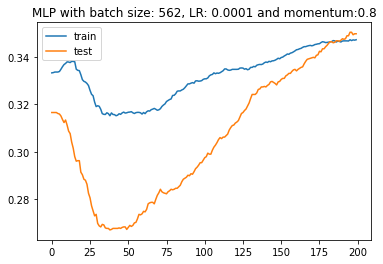

148/148 - 0s - loss: 1.0951 - accuracy: 0.3927 - 124ms/epoch - 837us/step
148/148 - 0s - loss: 1.0951 - accuracy: 0.3927 - 123ms/epoch - 831us/step
148/148 - 0s - loss: 1.0951 - accuracy: 0.3927 - 121ms/epoch - 816us/step
with batch size = 1024, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.393 


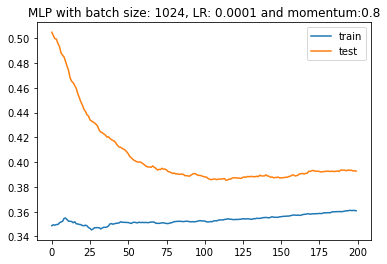

148/148 - 0s - loss: 1.1545 - accuracy: 0.1714 - 126ms/epoch - 849us/step
148/148 - 0s - loss: 1.1545 - accuracy: 0.1714 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1545 - accuracy: 0.1714 - 116ms/epoch - 786us/step
with batch size = 16839, LR= 0.0001 and momentum=0.8
Test Accuracy: 0.171 


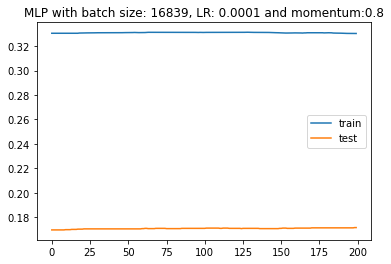

148/148 - 0s - loss: nan - accuracy: 0.5128 - 218ms/epoch - 1ms/step
148/148 - 0s - loss: nan - accuracy: 0.5128 - 104ms/epoch - 706us/step
148/148 - 0s - loss: nan - accuracy: 0.5128 - 111ms/epoch - 753us/step
with batch size = 1, LR= 1 and momentum=0.9
Test Accuracy: 0.513 


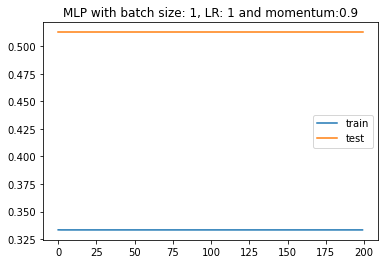

148/148 - 0s - loss: 1.0981 - accuracy: 0.3166 - 105ms/epoch - 710us/step
148/148 - 0s - loss: 1.0981 - accuracy: 0.3166 - 110ms/epoch - 742us/step
148/148 - 0s - loss: 1.0981 - accuracy: 0.3166 - 109ms/epoch - 739us/step
with batch size = 32, LR= 1 and momentum=0.9
Test Accuracy: 0.317 


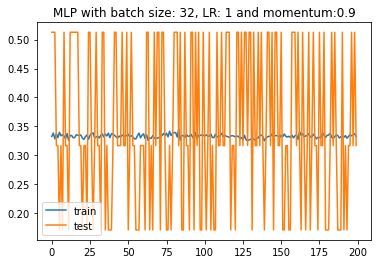

148/148 - 0s - loss: 1.1599 - accuracy: 0.3166 - 109ms/epoch - 736us/step
148/148 - 0s - loss: 1.1599 - accuracy: 0.3166 - 101ms/epoch - 680us/step
148/148 - 0s - loss: 1.1599 - accuracy: 0.3166 - 112ms/epoch - 757us/step
with batch size = 64, LR= 1 and momentum=0.9
Test Accuracy: 0.317 


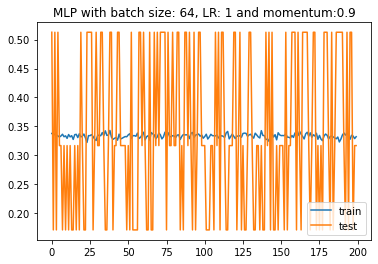

148/148 - 0s - loss: 1.1052 - accuracy: 0.1706 - 111ms/epoch - 752us/step
148/148 - 0s - loss: 1.1052 - accuracy: 0.1706 - 112ms/epoch - 758us/step
148/148 - 0s - loss: 1.1052 - accuracy: 0.1706 - 112ms/epoch - 758us/step
with batch size = 128, LR= 1 and momentum=0.9
Test Accuracy: 0.171 


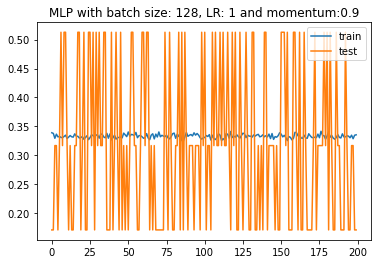

148/148 - 0s - loss: 1.0827 - accuracy: 0.3166 - 103ms/epoch - 694us/step
148/148 - 0s - loss: 1.0827 - accuracy: 0.3166 - 121ms/epoch - 815us/step
148/148 - 0s - loss: 1.0827 - accuracy: 0.3166 - 116ms/epoch - 787us/step
with batch size = 256, LR= 1 and momentum=0.9
Test Accuracy: 0.317 


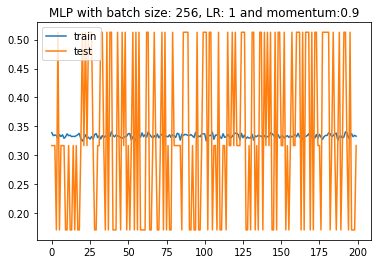

148/148 - 0s - loss: 1.0736 - accuracy: 0.3166 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0736 - accuracy: 0.3166 - 94ms/epoch - 634us/step
148/148 - 0s - loss: 1.0736 - accuracy: 0.3166 - 109ms/epoch - 739us/step
with batch size = 562, LR= 1 and momentum=0.9
Test Accuracy: 0.317 


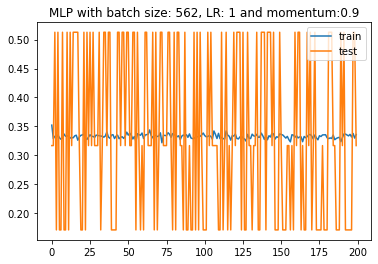

148/148 - 0s - loss: 1.0709 - accuracy: 0.5128 - 120ms/epoch - 813us/step
148/148 - 0s - loss: 1.0709 - accuracy: 0.5128 - 123ms/epoch - 831us/step
148/148 - 0s - loss: 1.0709 - accuracy: 0.5128 - 126ms/epoch - 851us/step
with batch size = 1024, LR= 1 and momentum=0.9
Test Accuracy: 0.513 


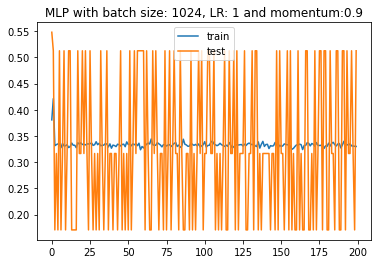

148/148 - 0s - loss: 1.0986 - accuracy: 0.1706 - 129ms/epoch - 869us/step
148/148 - 0s - loss: 1.0986 - accuracy: 0.1706 - 136ms/epoch - 917us/step
148/148 - 0s - loss: 1.0986 - accuracy: 0.1706 - 129ms/epoch - 871us/step
with batch size = 16839, LR= 1 and momentum=0.9
Test Accuracy: 0.171 


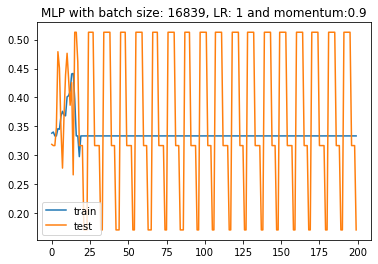

148/148 - 0s - loss: 1.0534 - accuracy: 0.5128 - 249ms/epoch - 2ms/step
148/148 - 0s - loss: 1.0534 - accuracy: 0.5128 - 135ms/epoch - 912us/step
148/148 - 0s - loss: 1.0534 - accuracy: 0.5128 - 119ms/epoch - 806us/step
with batch size = 1, LR= 0.1 and momentum=0.9
Test Accuracy: 0.513 


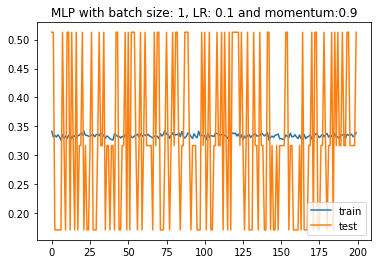

148/148 - 0s - loss: 1.0866 - accuracy: 0.5128 - 111ms/epoch - 750us/step
148/148 - 0s - loss: 1.0866 - accuracy: 0.5128 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 1.0866 - accuracy: 0.5128 - 128ms/epoch - 867us/step
with batch size = 32, LR= 0.1 and momentum=0.9
Test Accuracy: 0.513 


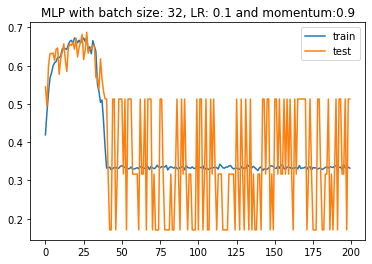

148/148 - 0s - loss: 1.1010 - accuracy: 0.3166 - 111ms/epoch - 752us/step
148/148 - 0s - loss: 1.1010 - accuracy: 0.3166 - 123ms/epoch - 829us/step
148/148 - 0s - loss: 1.1010 - accuracy: 0.3166 - 111ms/epoch - 748us/step
with batch size = 64, LR= 0.1 and momentum=0.9
Test Accuracy: 0.317 


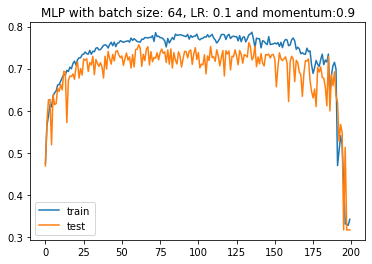

148/148 - 0s - loss: 0.5715 - accuracy: 0.7616 - 109ms/epoch - 738us/step
148/148 - 0s - loss: 0.5715 - accuracy: 0.7616 - 121ms/epoch - 817us/step
148/148 - 0s - loss: 0.5715 - accuracy: 0.7616 - 105ms/epoch - 710us/step
with batch size = 128, LR= 0.1 and momentum=0.9
Test Accuracy: 0.762 


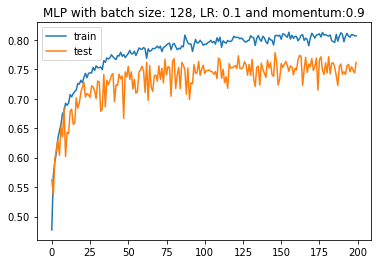

148/148 - 0s - loss: 0.5412 - accuracy: 0.7713 - 111ms/epoch - 749us/step
148/148 - 0s - loss: 0.5412 - accuracy: 0.7713 - 115ms/epoch - 778us/step
148/148 - 0s - loss: 0.5412 - accuracy: 0.7713 - 110ms/epoch - 746us/step
with batch size = 256, LR= 0.1 and momentum=0.9
Test Accuracy: 0.771 


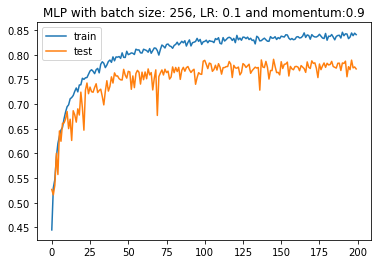

148/148 - 0s - loss: 0.5469 - accuracy: 0.7620 - 117ms/epoch - 793us/step
148/148 - 0s - loss: 0.5469 - accuracy: 0.7620 - 112ms/epoch - 754us/step
148/148 - 0s - loss: 0.5469 - accuracy: 0.7620 - 121ms/epoch - 816us/step
with batch size = 562, LR= 0.1 and momentum=0.9
Test Accuracy: 0.762 


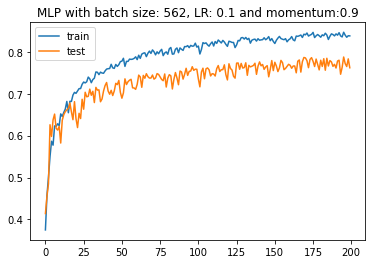

148/148 - 0s - loss: 0.5484 - accuracy: 0.7826 - 116ms/epoch - 785us/step
148/148 - 0s - loss: 0.5484 - accuracy: 0.7826 - 113ms/epoch - 763us/step
148/148 - 0s - loss: 0.5484 - accuracy: 0.7826 - 121ms/epoch - 816us/step
with batch size = 1024, LR= 0.1 and momentum=0.9
Test Accuracy: 0.783 


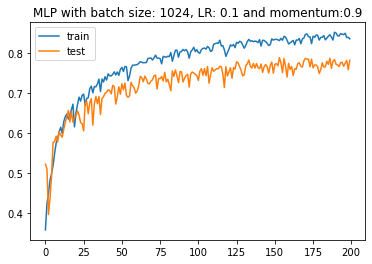

148/148 - 0s - loss: 0.7768 - accuracy: 0.6482 - 116ms/epoch - 782us/step
148/148 - 0s - loss: 0.7768 - accuracy: 0.6482 - 122ms/epoch - 826us/step
148/148 - 0s - loss: 0.7768 - accuracy: 0.6482 - 121ms/epoch - 818us/step
with batch size = 16839, LR= 0.1 and momentum=0.9
Test Accuracy: 0.648 


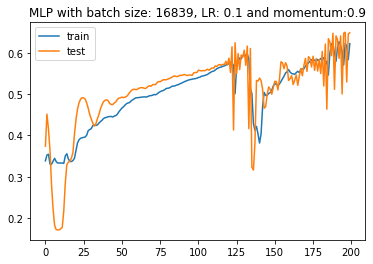

In [ ]:
diff_batchS=[1,32,64,128,256,562,1024,16839]
diff_lR=[1,0.1,0.01,0.001,0.0001]
momentum = [0.7,0.8,0.9]

for i in range(len(momentum)):
    for j in range(len(diff_lR)):
        for k in range(len(diff_batchS)):
            MLP().testLrGdMom(X_train_os, y_train_os,X_test, y_test, 200, diff_batchS[k],diff_lR[j],momentum[i])

148/148 - 1s - loss: 1.1647 - accuracy: 0.1725 - 609ms/epoch - 4ms/step
148/148 - 0s - loss: 1.1647 - accuracy: 0.1725 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.1647 - accuracy: 0.1725 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.01 and momentum=0.9
Test Accuracy: 0.172 


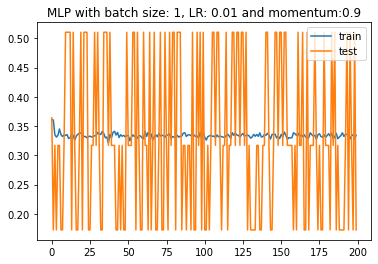

148/148 - 0s - loss: 0.5583 - accuracy: 0.7828 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5583 - accuracy: 0.7828 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5583 - accuracy: 0.7828 - 125ms/epoch - 844us/step
with batch size = 32, LR= 0.01 and momentum=0.9
Test Accuracy: 0.783 


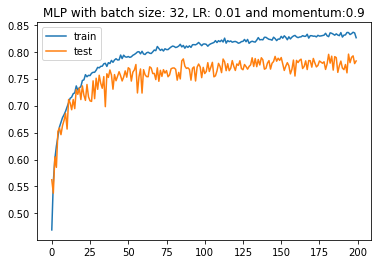

148/148 - 0s - loss: 0.5803 - accuracy: 0.7713 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5803 - accuracy: 0.7713 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5803 - accuracy: 0.7713 - 125ms/epoch - 844us/step
with batch size = 64, LR= 0.01 and momentum=0.9
Test Accuracy: 0.771 


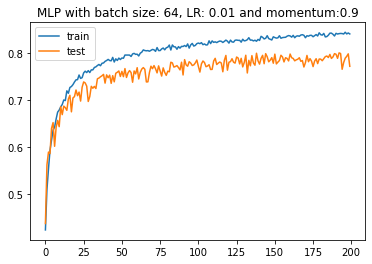

148/148 - 0s - loss: 0.5445 - accuracy: 0.7773 - 156ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5445 - accuracy: 0.7773 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.5445 - accuracy: 0.7773 - 125ms/epoch - 844us/step
with batch size = 128, LR= 0.01 and momentum=0.9
Test Accuracy: 0.777 


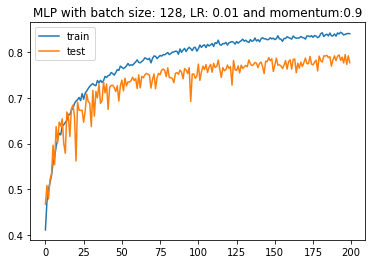

148/148 - 0s - loss: 0.5745 - accuracy: 0.7633 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5745 - accuracy: 0.7633 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5745 - accuracy: 0.7633 - 109ms/epoch - 739us/step
with batch size = 256, LR= 0.01 and momentum=0.9
Test Accuracy: 0.763 


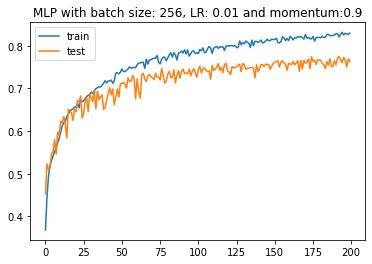

148/148 - 0s - loss: 0.5847 - accuracy: 0.7476 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5847 - accuracy: 0.7476 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.5847 - accuracy: 0.7476 - 141ms/epoch - 950us/step
with batch size = 562, LR= 0.01 and momentum=0.9
Test Accuracy: 0.748 


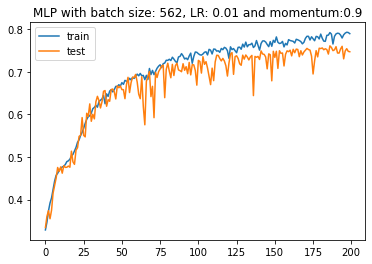

148/148 - 0s - loss: 0.6107 - accuracy: 0.7268 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6107 - accuracy: 0.7268 - 125ms/epoch - 845us/step
148/148 - 0s - loss: 0.6107 - accuracy: 0.7268 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 0.01 and momentum=0.9
Test Accuracy: 0.727 


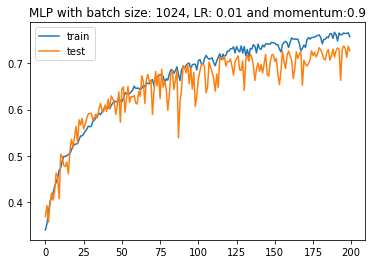

148/148 - 0s - loss: 0.9935 - accuracy: 0.5050 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.9935 - accuracy: 0.5050 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 0.9935 - accuracy: 0.5050 - 141ms/epoch - 950us/step
with batch size = 16839, LR= 0.01 and momentum=0.9
Test Accuracy: 0.505 


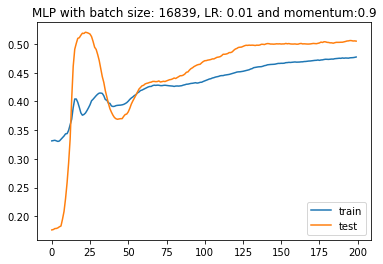

148/148 - 0s - loss: 0.6243 - accuracy: 0.7404 - 222ms/epoch - 1ms/step
148/148 - 0s - loss: 0.6243 - accuracy: 0.7404 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.6243 - accuracy: 0.7404 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.001 and momentum=0.9
Test Accuracy: 0.740 


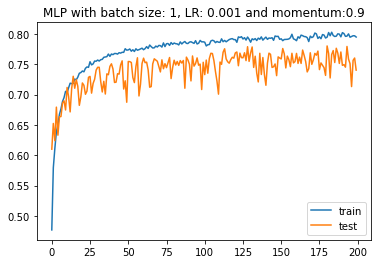

148/148 - 0s - loss: 0.5528 - accuracy: 0.7669 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5528 - accuracy: 0.7669 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5528 - accuracy: 0.7669 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.001 and momentum=0.9
Test Accuracy: 0.767 


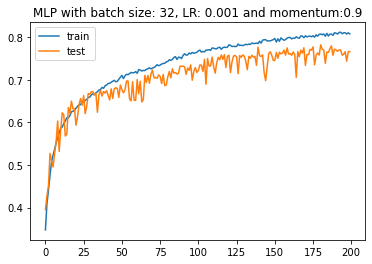

148/148 - 0s - loss: 0.5752 - accuracy: 0.7519 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.5752 - accuracy: 0.7519 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5752 - accuracy: 0.7519 - 125ms/epoch - 844us/step
with batch size = 64, LR= 0.001 and momentum=0.9
Test Accuracy: 0.752 


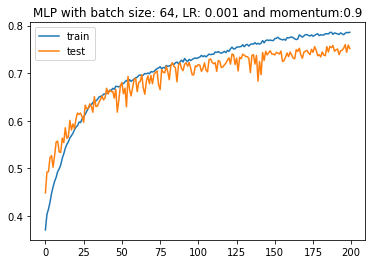

148/148 - 0s - loss: 0.6743 - accuracy: 0.6921 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6743 - accuracy: 0.6921 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.6743 - accuracy: 0.6921 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.001 and momentum=0.9
Test Accuracy: 0.692 


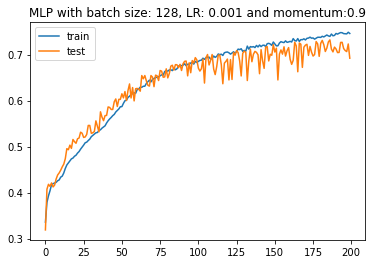

148/148 - 0s - loss: 0.7328 - accuracy: 0.6605 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7328 - accuracy: 0.6605 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7328 - accuracy: 0.6605 - 111ms/epoch - 751us/step
with batch size = 256, LR= 0.001 and momentum=0.9
Test Accuracy: 0.661 


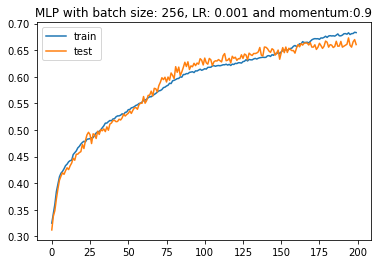

148/148 - 0s - loss: 0.9090 - accuracy: 0.5789 - 114ms/epoch - 768us/step
148/148 - 0s - loss: 0.9090 - accuracy: 0.5789 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9090 - accuracy: 0.5789 - 101ms/epoch - 681us/step
with batch size = 562, LR= 0.001 and momentum=0.9
Test Accuracy: 0.579 


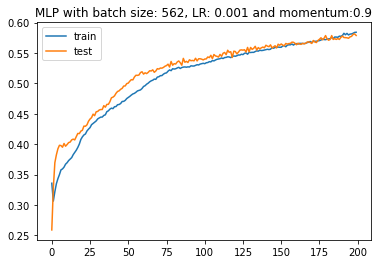

148/148 - 0s - loss: 0.9577 - accuracy: 0.5370 - 123ms/epoch - 829us/step
148/148 - 0s - loss: 0.9577 - accuracy: 0.5370 - 117ms/epoch - 789us/step
148/148 - 0s - loss: 0.9577 - accuracy: 0.5370 - 119ms/epoch - 805us/step
with batch size = 1024, LR= 0.001 and momentum=0.9
Test Accuracy: 0.537 


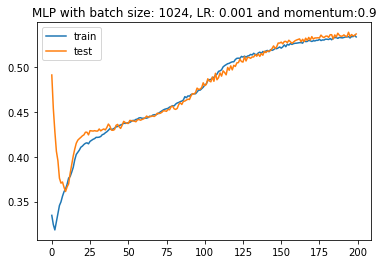

148/148 - 0s - loss: 1.0969 - accuracy: 0.3255 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0969 - accuracy: 0.3255 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0969 - accuracy: 0.3255 - 125ms/epoch - 845us/step
with batch size = 16839, LR= 0.001 and momentum=0.9
Test Accuracy: 0.325 


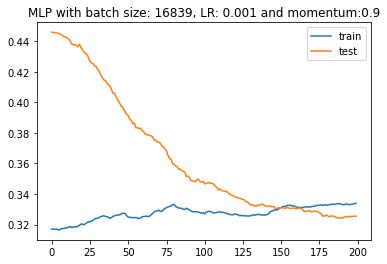

148/148 - 0s - loss: 0.5508 - accuracy: 0.7794 - 219ms/epoch - 1ms/step
148/148 - 0s - loss: 0.5508 - accuracy: 0.7794 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.5508 - accuracy: 0.7794 - 109ms/epoch - 739us/step
with batch size = 1, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.779 


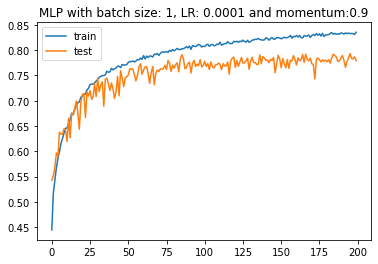

148/148 - 0s - loss: 0.7914 - accuracy: 0.6421 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.7914 - accuracy: 0.6421 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.7914 - accuracy: 0.6421 - 109ms/epoch - 739us/step
with batch size = 32, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.642 


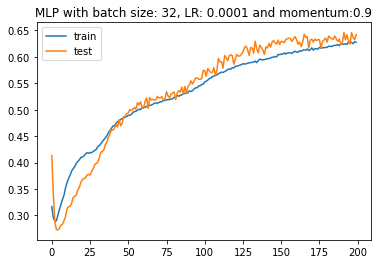

148/148 - 0s - loss: 0.8810 - accuracy: 0.6020 - 116ms/epoch - 781us/step
148/148 - 0s - loss: 0.8810 - accuracy: 0.6020 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.8810 - accuracy: 0.6020 - 109ms/epoch - 739us/step
with batch size = 64, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.602 


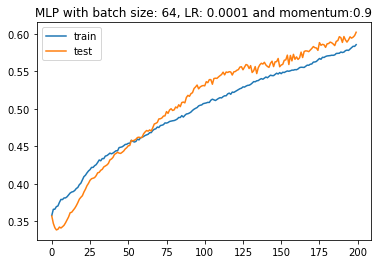

148/148 - 0s - loss: 0.9615 - accuracy: 0.5325 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 0.9615 - accuracy: 0.5325 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 0.9615 - accuracy: 0.5325 - 109ms/epoch - 739us/step
with batch size = 128, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.533 


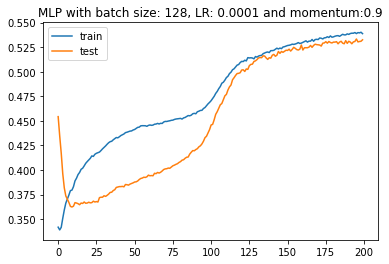

148/148 - 0s - loss: 1.0616 - accuracy: 0.4745 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0616 - accuracy: 0.4745 - 141ms/epoch - 950us/step
148/148 - 0s - loss: 1.0616 - accuracy: 0.4745 - 125ms/epoch - 844us/step
with batch size = 256, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.474 


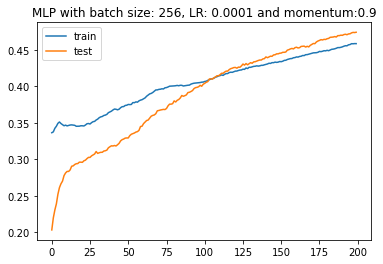

148/148 - 0s - loss: 1.0899 - accuracy: 0.3694 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0899 - accuracy: 0.3694 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.0899 - accuracy: 0.3694 - 109ms/epoch - 739us/step
with batch size = 562, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.369 


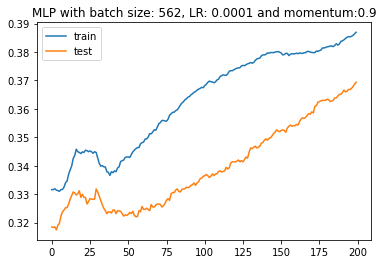

148/148 - 0s - loss: 1.0924 - accuracy: 0.3668 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0924 - accuracy: 0.3668 - 125ms/epoch - 844us/step
148/148 - 0s - loss: 1.0924 - accuracy: 0.3668 - 125ms/epoch - 844us/step
with batch size = 1024, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.367 


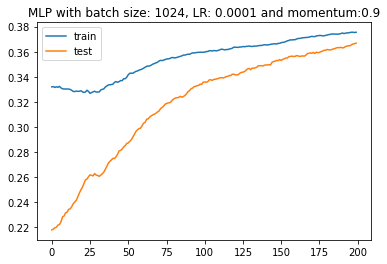

148/148 - 0s - loss: 1.2196 - accuracy: 0.2526 - 95ms/epoch - 641us/step
148/148 - 0s - loss: 1.2196 - accuracy: 0.2526 - 109ms/epoch - 739us/step
148/148 - 0s - loss: 1.2196 - accuracy: 0.2526 - 109ms/epoch - 739us/step
with batch size = 16839, LR= 0.0001 and momentum=0.9
Test Accuracy: 0.253 


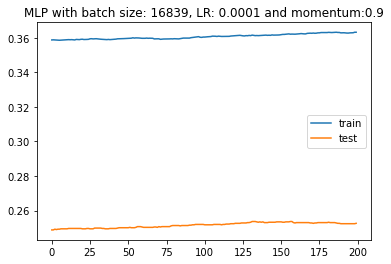

In [8]:
diff_batchS=[1,32,64,128,256,562,1024,16839]
diff_lR=[0.01,0.001,0.0001]
momentum = [0.9]

for i in range(len(momentum)):
    for j in range(len(diff_lR)):
        for k in range(len(diff_batchS)):
            MLP().testLrGdMom(X_train_os, y_train_os,X_test, y_test, 200, diff_batchS[k],diff_lR[j],momentum[i])